In [1]:
import numpy as np
import cv2
import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline
import pickle
import glob
import os
import math
from scipy import signal
from moviepy.editor import VideoFileClip

In [2]:
base_dir = os.getcwd()
test_images = os.path.join(base_dir, 'test_images')
output_images = os.path.join(base_dir, 'output_images')
camera_cal = os.path.join(base_dir, 'camera_cal')
print(test_images)

/home/vatsal/SDN/BitBucketRepos/CarND-Advanced-Lane-Detection-Project/test_images


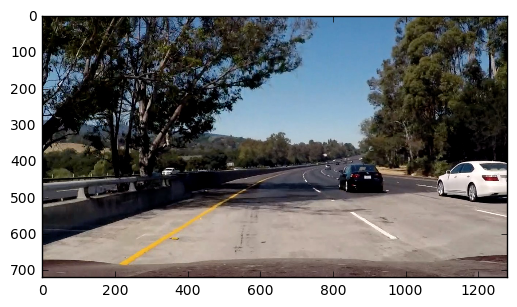

In [3]:
# Read in an image
imgIn = mpimg.imread(os.path.join(test_images, 'test5.jpg'))
plt.imshow(imgIn)

### Pipeline for the Project

The aim of this project was to use different computer vision technique to clearly identify road lane lines from a video. Most of the work has been done using OpenCV as well as Numpy.

The course website provided a very detailed description of what steps to take to successfully complete the project. I have mostly incorporated them, with a few modifications and additions.

For each image frame in the video, the following steps have been applied in the 

### Step 1: Camera Calibration and Distortion Correction

##### Compute the camera calibration matrix and the distortion coefficients with the given set of chessboard images. Then apply distortion correstion on the raw images.

In [4]:
def load_images(dir_path):
    """
    Load the camera images and return an array of images in the input dir.
    """
    return np.array([cv2.imread(os.path.join(dir_path, image)) for image in os.listdir(dir_path)])

def get_img_obj_points():
    """
    Use the camera_cal folder images to return the image points and object points
    @Returns: image_points array, object_points array, nx, ny
    """
    cal_img = load_images(camera_cal)
    nx = 9    # number of inner corners along x-axis
    ny = 6    # number of inner corners aling y-axis
    
    obj_points = []    # 3D points in real world space
    img_points = []    # 2D points in image space
    
    # Create a 6x9x3 points np array of object points like (0,0,0),(1,0,0),...,(2,3,0),...,(8,5,0)
    obj_pts = np.zeros([nx*ny, 3], np.float32)
    obj_pts[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)    # Set the x and y coordinates
    
    for image in cal_img:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
        # Find the chessboard corner
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        
        #print(ret)
        if(ret):
            img_points.append(corners)
            obj_points.append(obj_pts)
            
    return img_points, obj_points, nx, ny

def undistort_image(img, objPoints, imgPoints, nx, ny):
    """
    Performs camera calibration and image distortion correction
    @Returns: Undistorted image
    """
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, gray.shape[::-1], None, None)
    undist_img = cv2.undistort(img, mtx, dist, None, mtx)
        
    return undist_img

In [5]:
def plotter(test_img, new_img, plot_title=None, n=0):
    """
    A helper function to avoid code duplication.
    Takes in two images and plots them side by side for comparison.
    """
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
    f.tight_layout()
    matplotlib.rc('xtick', labelsize=15) 
    matplotlib.rc('ytick', labelsize=15)
    ax1.imshow(test_img)
    ax1.set_title('Original Image:', fontsize=15)
    ax2.imshow(new_img, cmap='gray')
    ax2.set_title('{0} Test {1}:'.format(plot_title, n+1), fontsize=15)

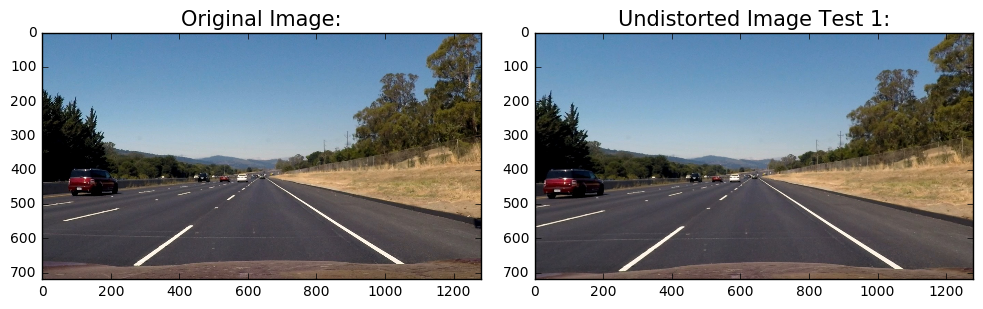

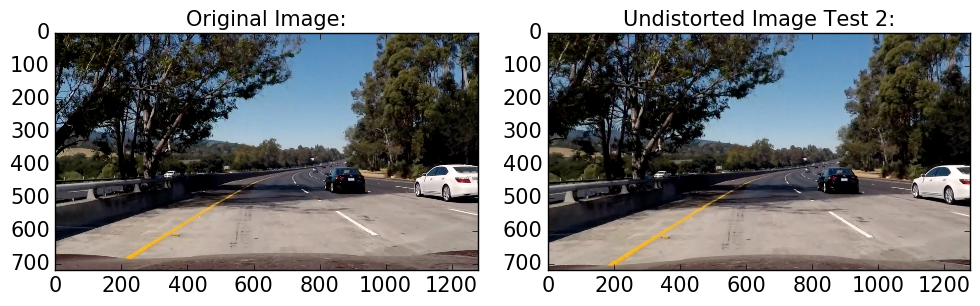

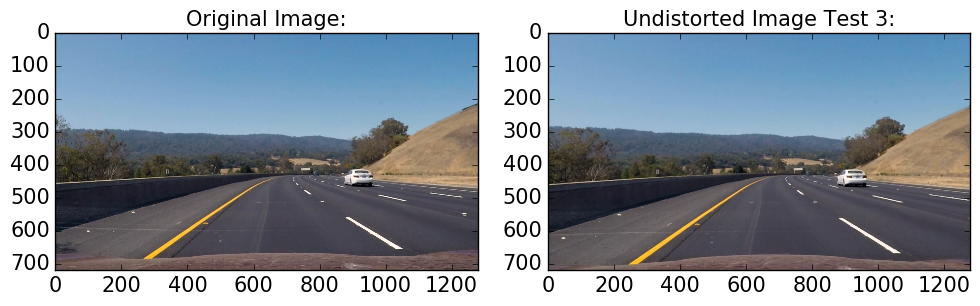

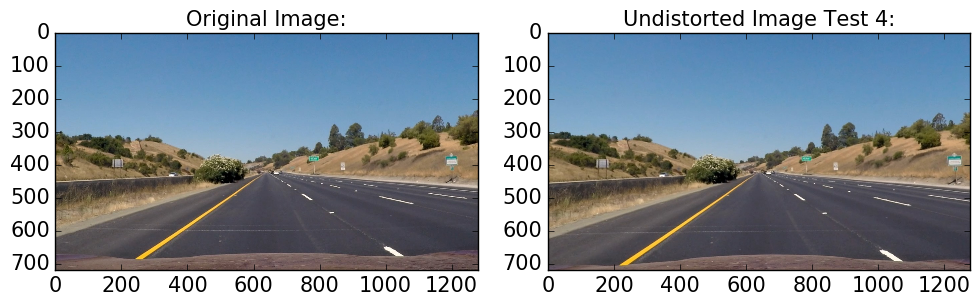

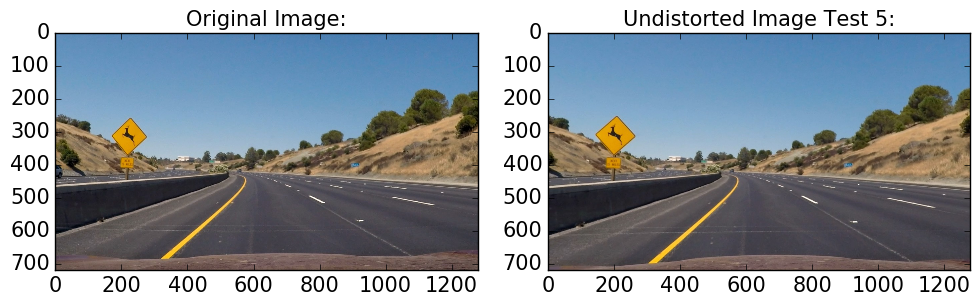

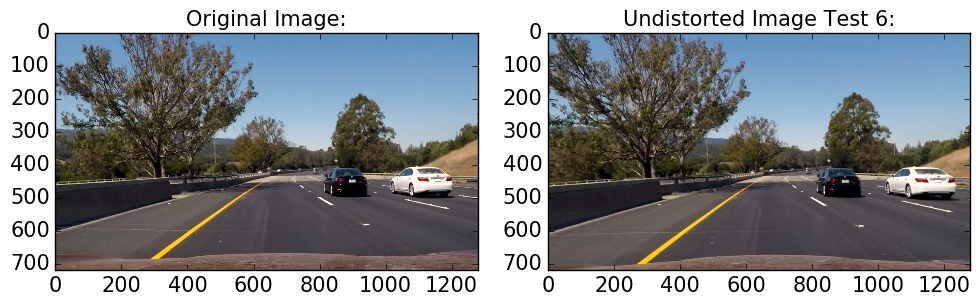

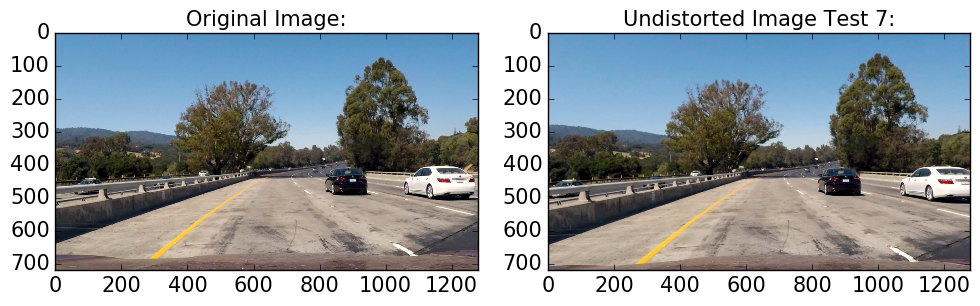

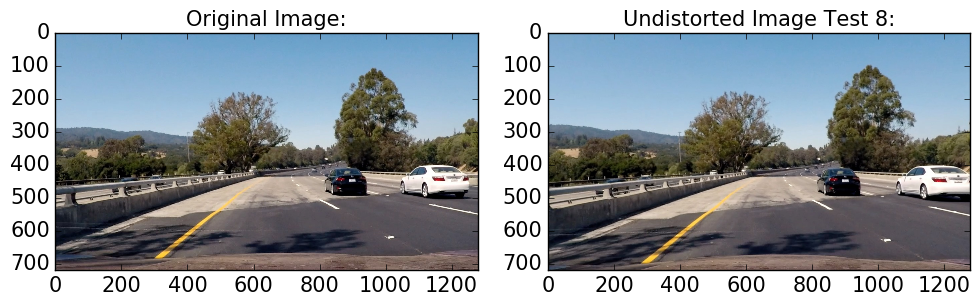

In [6]:
# See the results of the camera calibration and distortion correction
# on the test images
test_img = load_images(test_images)
img_points, obj_points, nx, ny = get_img_obj_points()
n=0
for img in test_img:
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ud_img = undistort_image(img, obj_points, img_points, nx, ny)
    plotter(img, ud_img, 'Undistorted Image',n)
    n+=1

In [7]:
def bgr_to_rgb(img):
    """
    Function to convert BGR images to RGB
    """
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

### Step 2: Color and Gradient Thresholds

##### Create a threshold binary image using color transforms and gradient operators 

In [8]:
def sobel_x(img, threshold_MIN=15, threshold_MAX=255):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= threshold_MIN) & (scaled_sobel <= threshold_MAX)] = 1
    return binary_output

def sobel_y(img, threshold_MIN=35, threshold_MAX=255):  
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= threshold_MIN) & (scaled_sobel <= threshold_MAX)] = 1
    return binary_output

def gradient_magnitude(img, sobel_kernel=9, mag_threshold=(60, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    gradmag = np.sqrt(sobel_x**2 + sobel_y**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_threshold[0]) & (gradmag <= mag_threshold[1])] = 1
    return binary_output

def gradient_direction(img, sobel_kernel=9, thresh=(0.8, 1.1)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_grad_dir = np.arctan2(np.absolute(sobel_y), np.absolute(sobel_x))
    binary_output =  np.zeros_like(abs_grad_dir)
    binary_output[(abs_grad_dir >= thresh[0]) & (abs_grad_dir <= thresh[1])] = 1
    return binary_output

def color_thresholds(img, HLS_s_threshold=(170, 255), HSV_v_threshold=(200,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > HLS_s_threshold[0]) & (s_channel <= HLS_s_threshold[1])] = 1
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel > HSV_v_threshold[0]) & (v_channel <= HSV_v_threshold[1])] = 1  
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_binary == 1) & (v_binary == 1)] = 1
    return binary_output

def combined_thresholds(img):
    binary_x = sobel_x(img)
    binary_y = sobel_y(img)
    mag = gradient_magnitude(img)
    direct = gradient_direction(img)
    color = color_thresholds(img)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    binary_output = np.zeros_like(img)
    binary_output[(binary_x == 1) & (binary_y == 1) | (color == 1)] = 1
    return binary_output

def region_of_interest(img):
    width = img.shape[1]
    height = img.shape[0]
    vertices = np.array([[(width*0.45, height*0.65),
                        (width*0.6, height*0.65),
                        (width, height),
                        (0, height)]], 
                        dtype=np.int32)
    mask = np.zeros_like(img)   
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

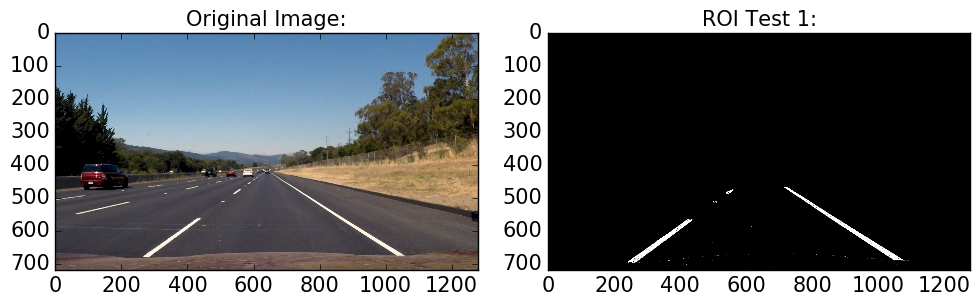

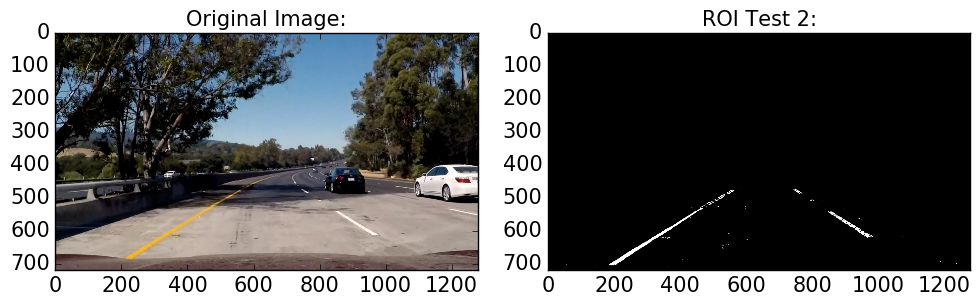

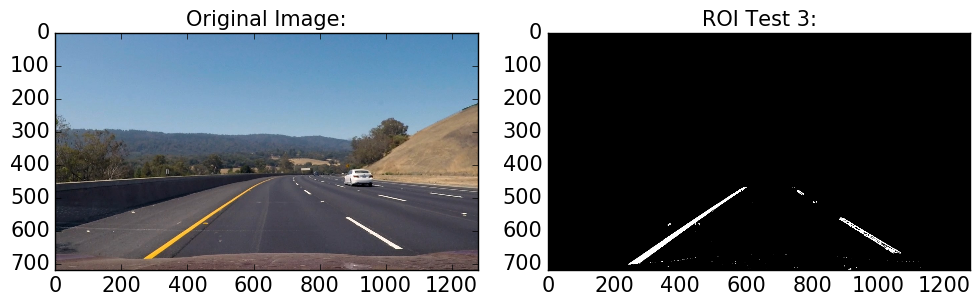

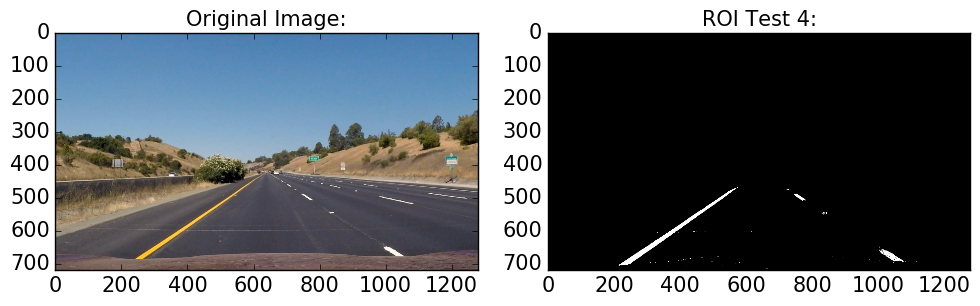

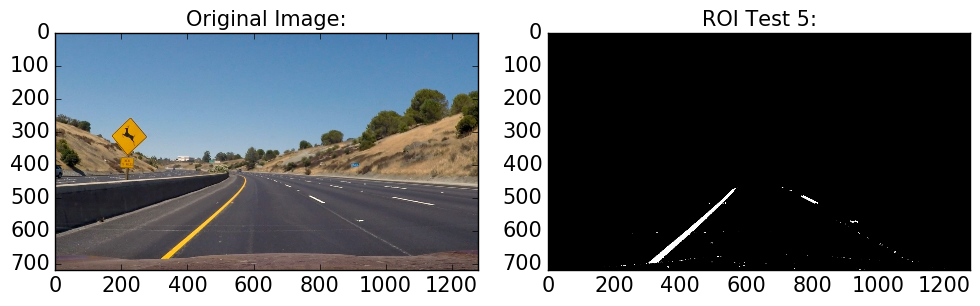

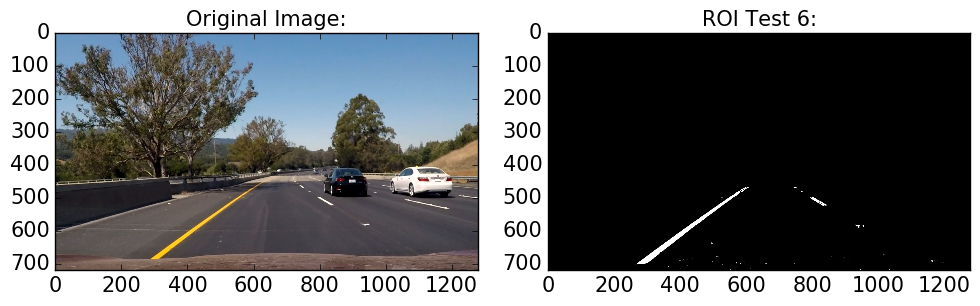

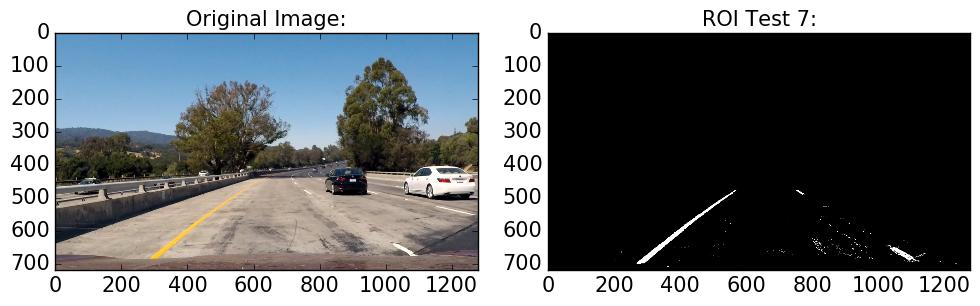

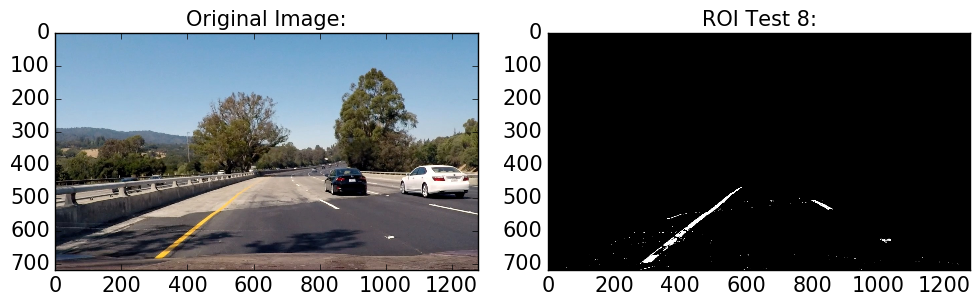

In [9]:
n=0
for img in test_img:
    img_rgb = bgr_to_rgb(img)
    new_img = undistort_image(img_rgb, obj_points, img_points, nx, ny)
    new_img = combined_thresholds(new_img)
    new_img = region_of_interest(new_img)
    plotter(img_rgb, new_img, 'ROI', n)
    n+=1

In [10]:
# Draw continuous Hough Lines on the image over the detected lanes
def hough_lines(img, rho=1, theta=1/180, threshold=70, min_line_len=10, max_line_gap=30):
    img = region_of_interest(img)
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), 
                            minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((*img.shape, 3), dtype=np.uint8)
    for line in lines:
        for x1,y1,x2,y2 in line:
            slope = (y2-y1)/(x2-x1)
            point = np.mean(line, axis=0)
            y = point[1]
            x = point[0] 
            intercept = y - slope*x
            yLeft = intercept
            yRight = slope * img.shape[1] + intercept
            cv2.line(line_img, (0, int(yLeft)), (img.shape[1], int(yRight)), color=[255, 0, 0], thickness=5)
    return line_img

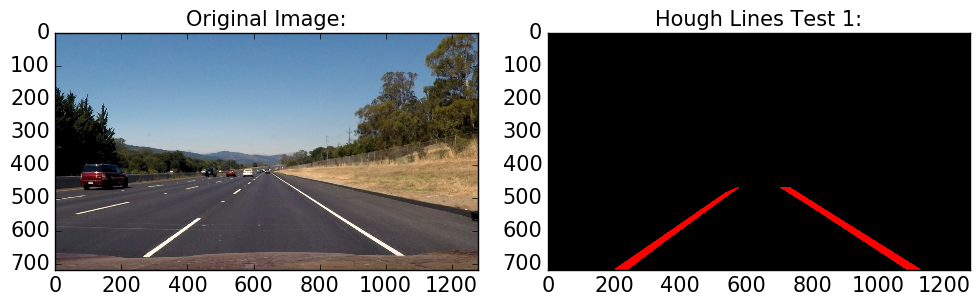

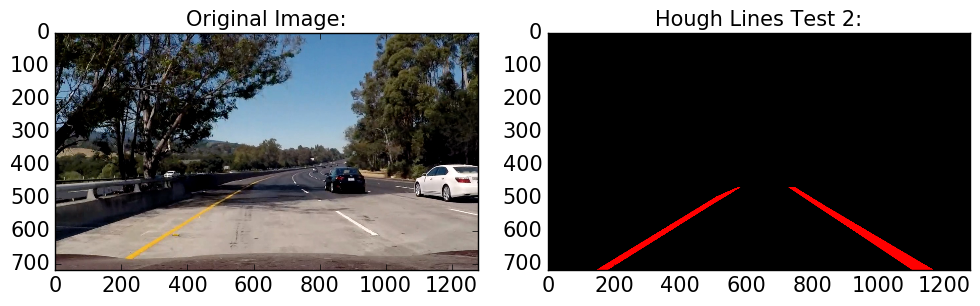

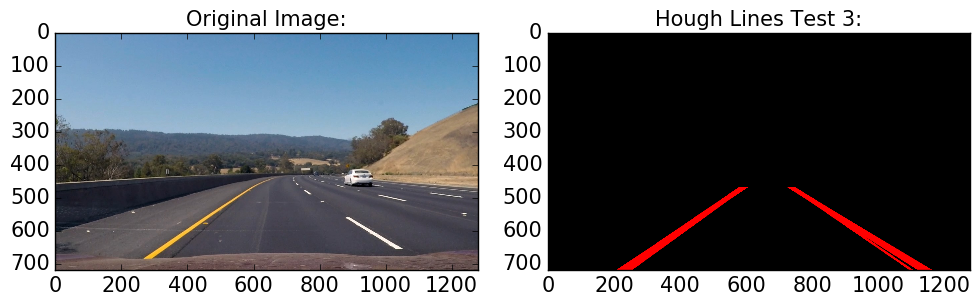

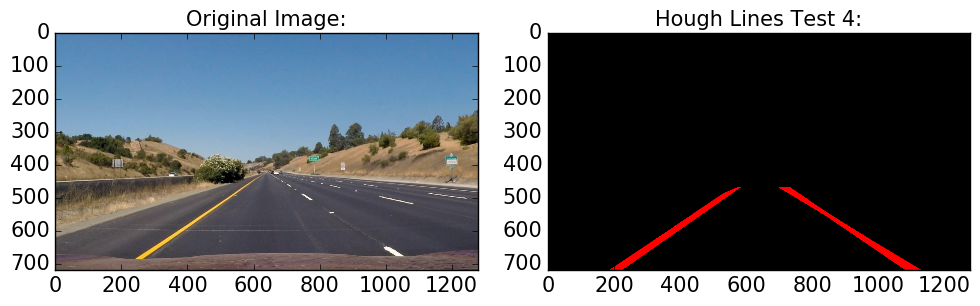

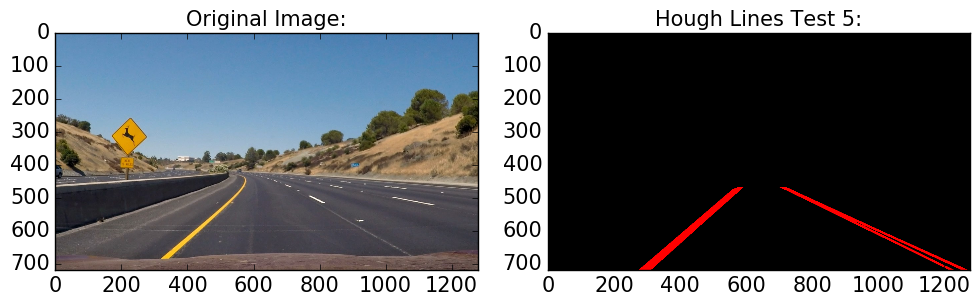

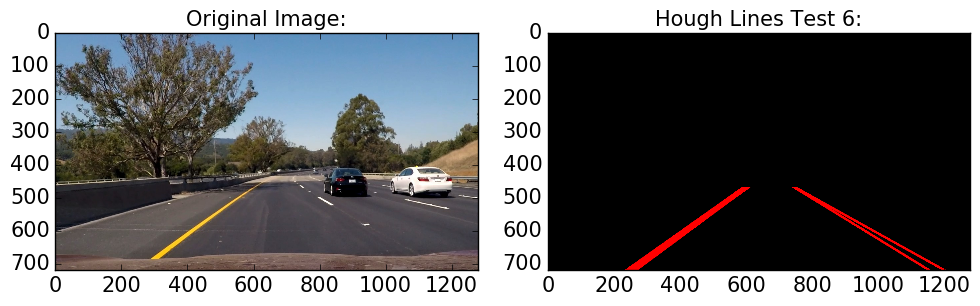

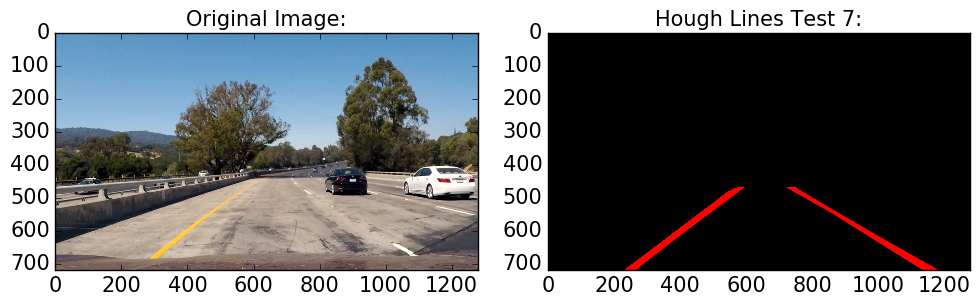

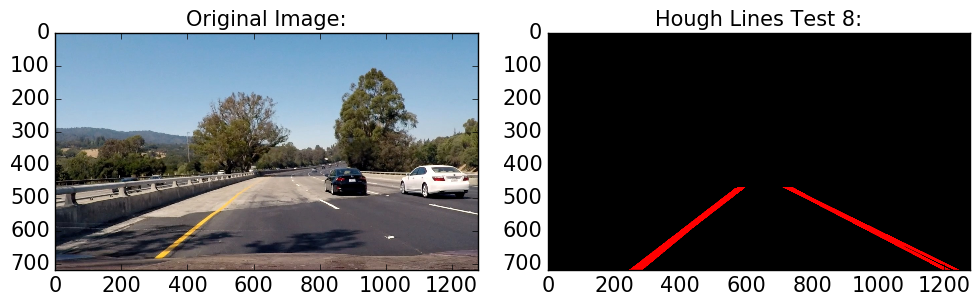

In [11]:
n=0
for img in test_img:
    img_rgb = bgr_to_rgb(img)
    new_img = undistort_image(img_rgb, obj_points, img_points, nx, ny)
    new_img = combined_thresholds(new_img)
    new_img = region_of_interest(new_img)
    new_img = hough_lines(new_img)
    new_img = region_of_interest(new_img)
    plotter(img_rgb, new_img, 'Hough Lines', n)
    n+=1

### Step 3: Perspective Transform

##### Apply a perspective transform to get a bird's eye view of the lanes

In [12]:
def transform_perspective(image):
    """
    Transform the image's perspective within a certain region of interest.
    """
    width = image.shape[1]
    height = image.shape[0]
    src = np.array([[(width*0.4, height*0.65),
                        (width*0.6, height*0.65),
                        (width, height),
                        (0, height)]], 
                        dtype=np.float32)
    dst = np.array([[0,0], 
                    [image.shape[1], 0], 
                    [image.shape[1], image.shape[0]],
                    [0, image.shape[0]]],
                    dtype = 'float32')
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped_output = cv2.warpPerspective(image, M, (width,height), flags=cv2.INTER_LINEAR)
    return warped_output, M, Minv 

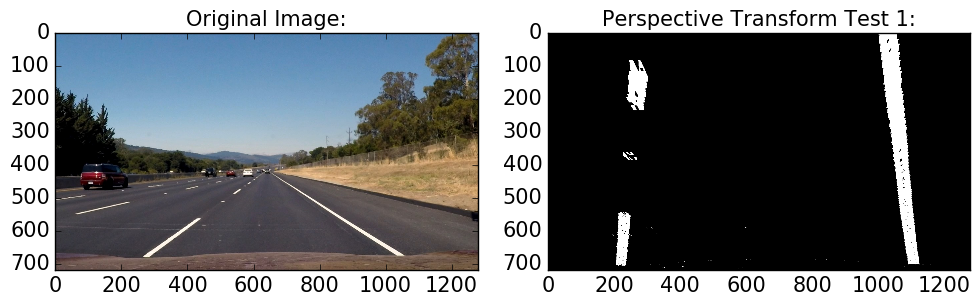

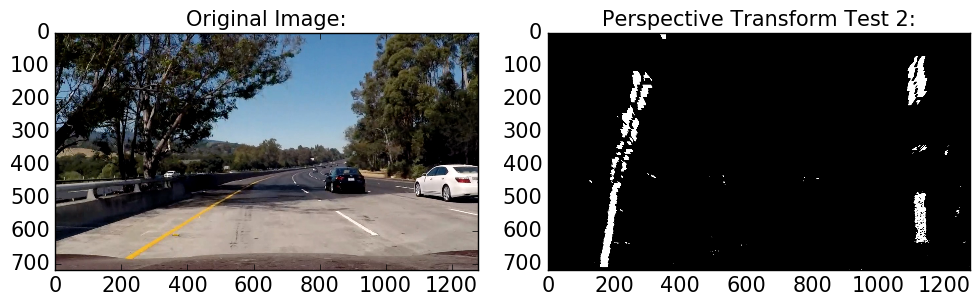

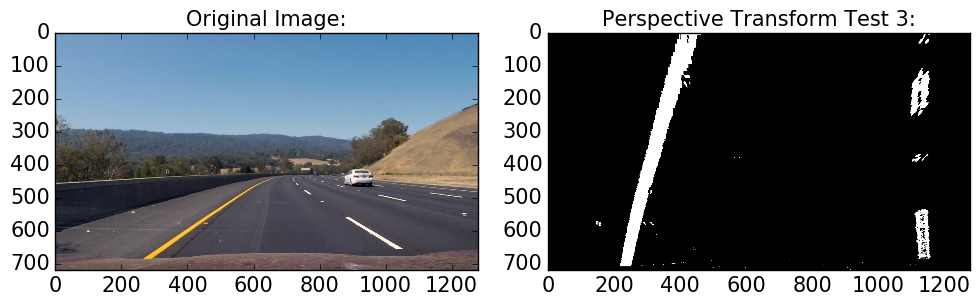

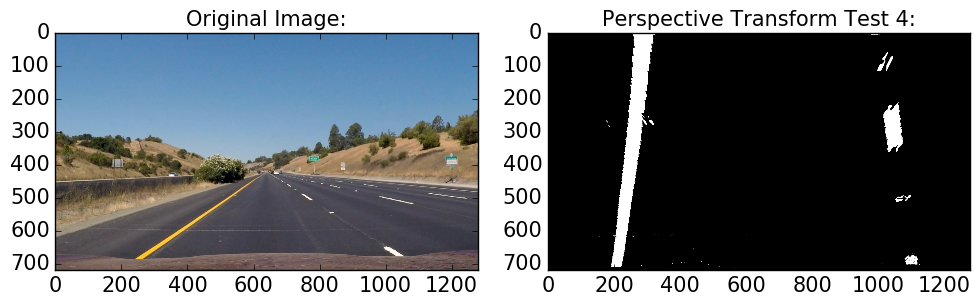

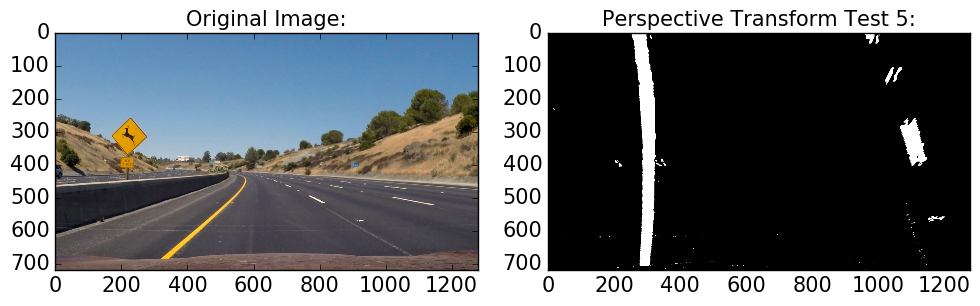

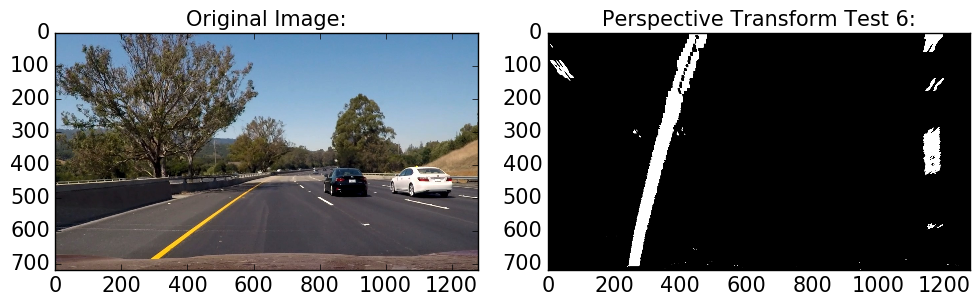

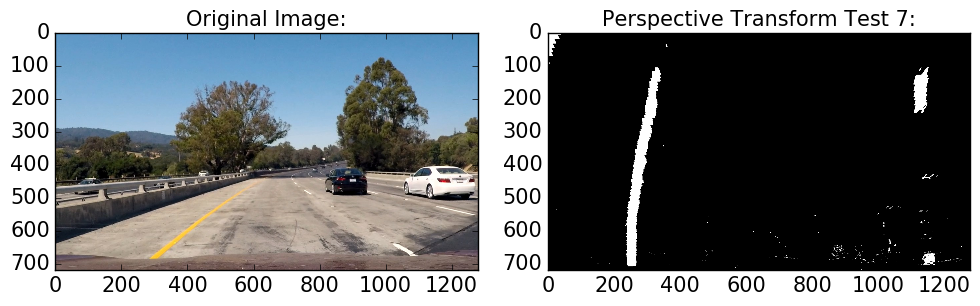

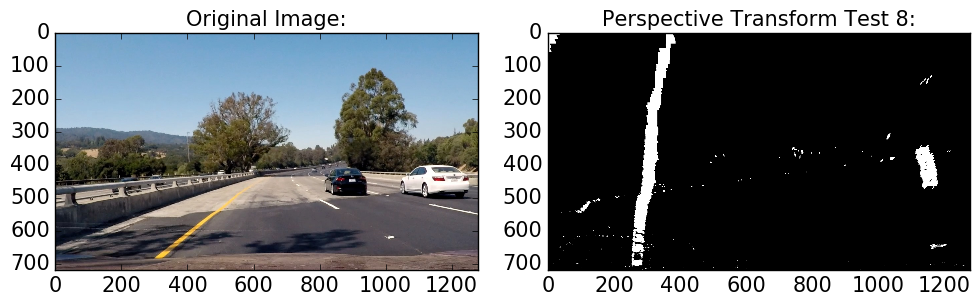

In [13]:
n=0
for img in test_img:
    img_rgb = bgr_to_rgb(img)
    new_img = undistort_image(img_rgb, obj_points, img_points, nx, ny)
    new_img2 = combined_thresholds(new_img)
    #new_img2 = region_of_interest(new_img2)
    new_img3, M, Minv = transform_perspective(new_img2)
    plotter(img_rgb, new_img3, 'Perspective Transform', n)
    n+=1

### Step 4: Detecting Lane Lines

In [14]:
def sliding_windows(binary_warped):
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    nwindows = 9
    window_height = np.int(binary_warped.shape[0]/nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 100
    minpix = 50
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    return out_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base

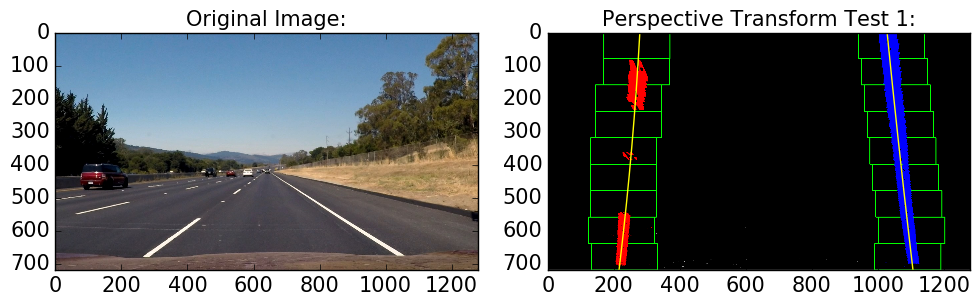

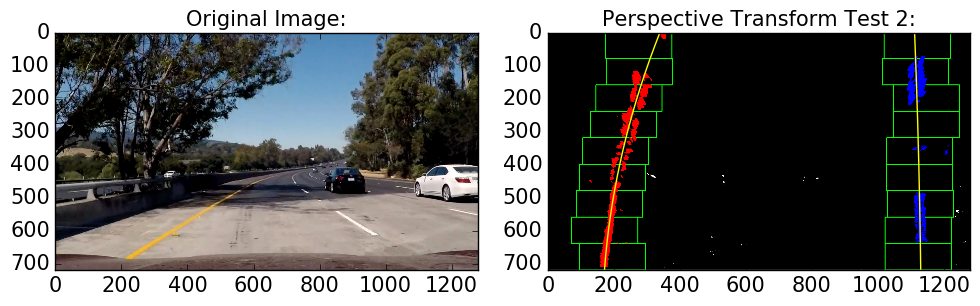

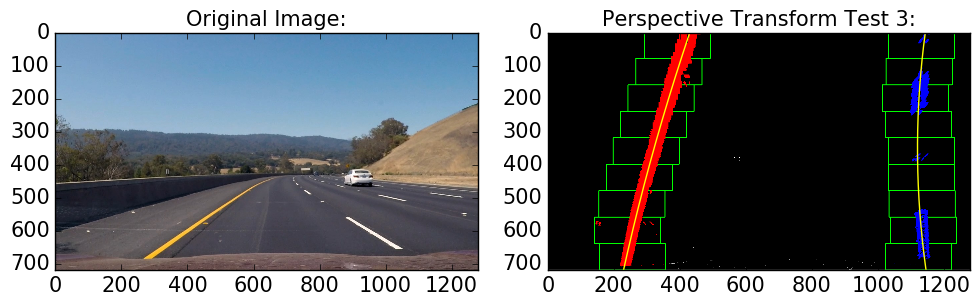

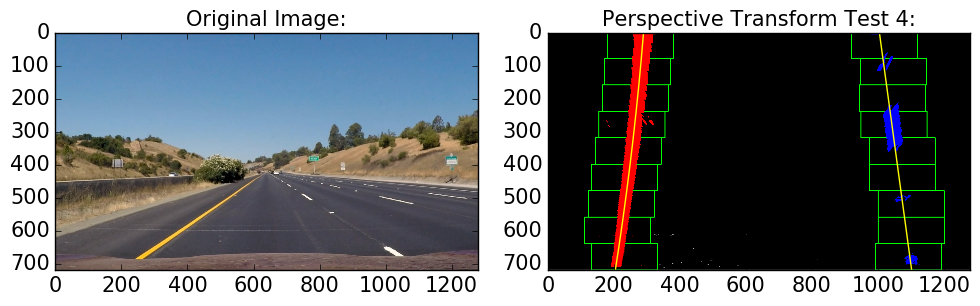

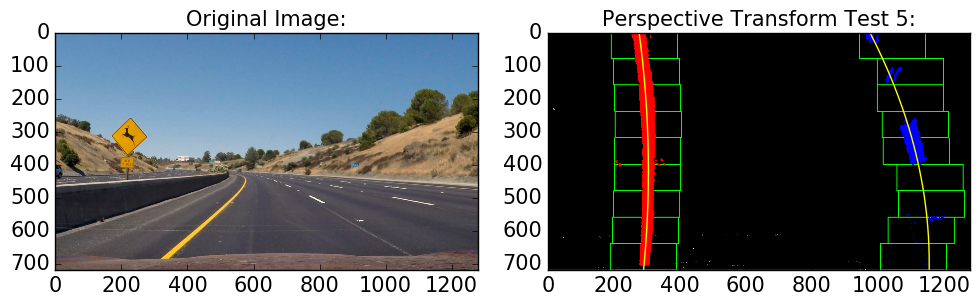

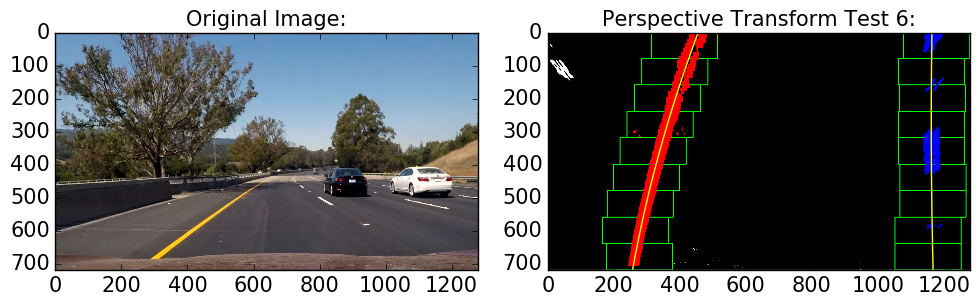

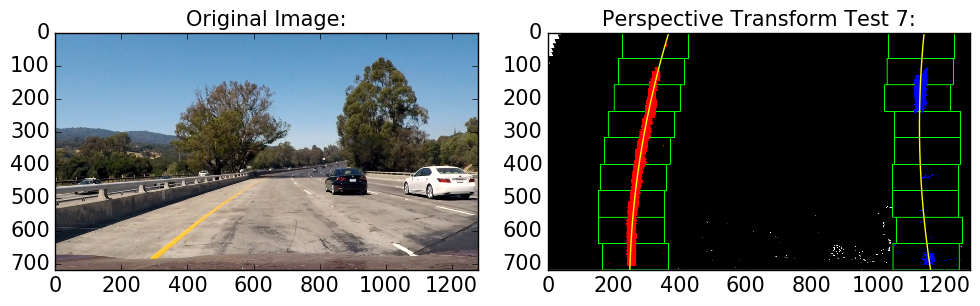

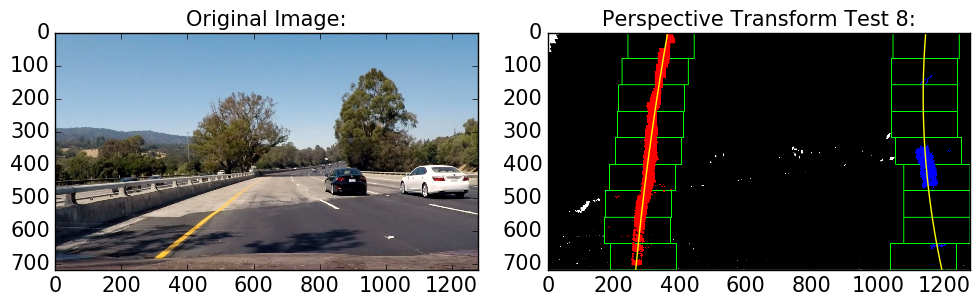

In [15]:
n=0
for img in test_img:
    img_rgb = bgr_to_rgb(img)
    new_img = undistort_image(img_rgb, obj_points, img_points, nx, ny)
    new_img2 = combined_thresholds(new_img)
    new_img3, M, Minv = transform_perspective(new_img2)
    windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(new_img3)
    plotter(img_rgb, windows_img, 'Perspective Transform', n)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    n+=1

In [16]:
def shaded_lanes(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return out_img, ploty, left_fitx, right_fitx, left_fit, right_fit

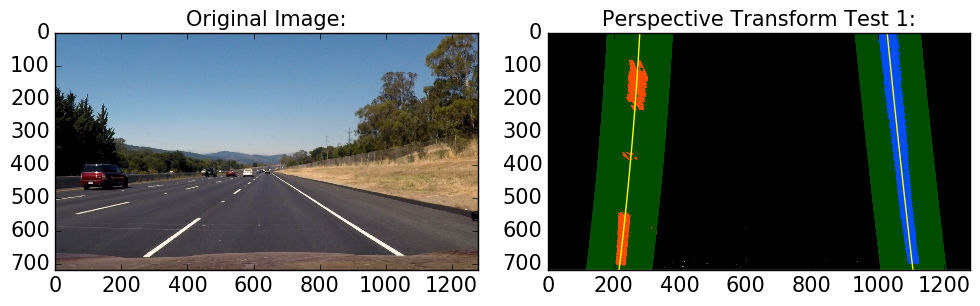

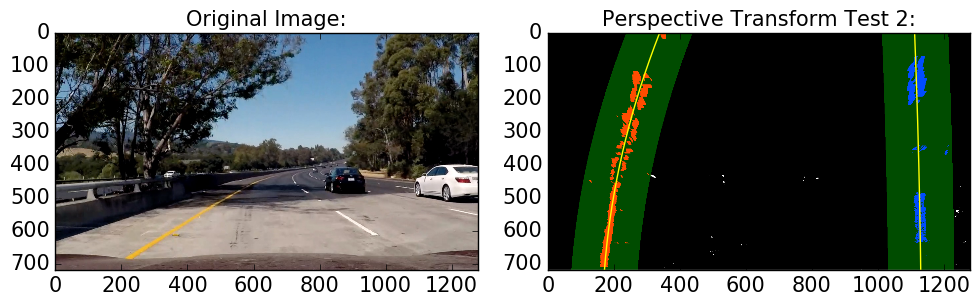

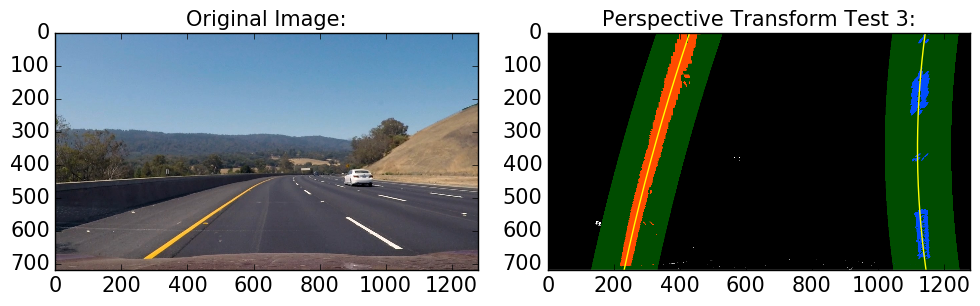

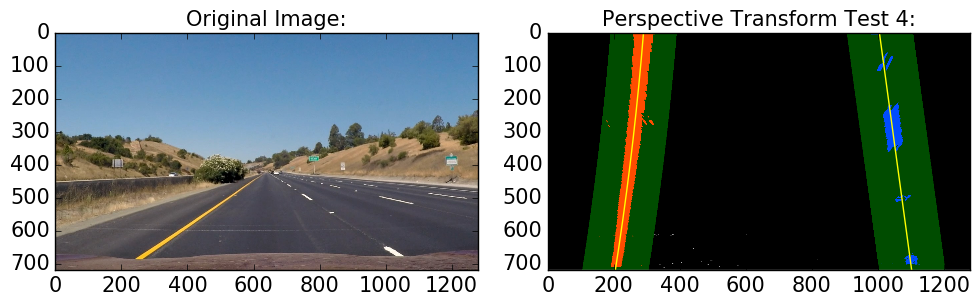

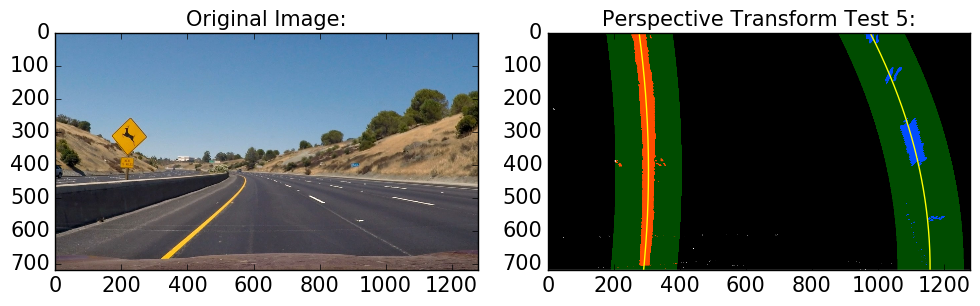

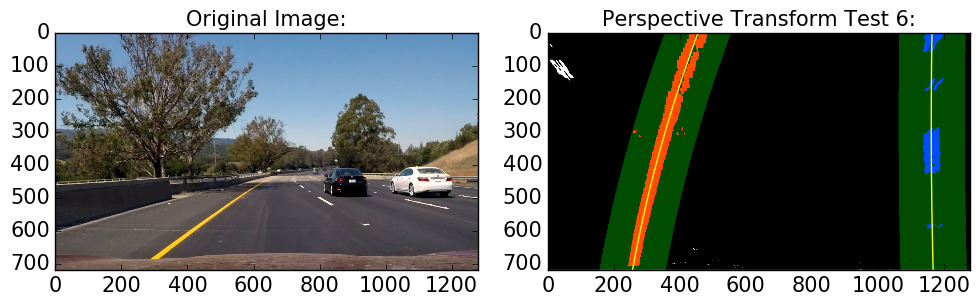

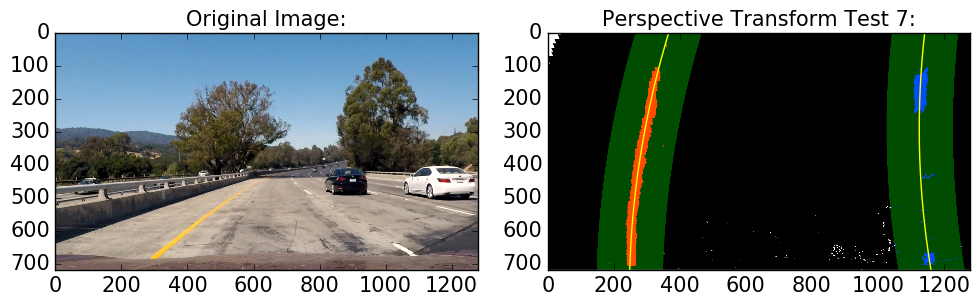

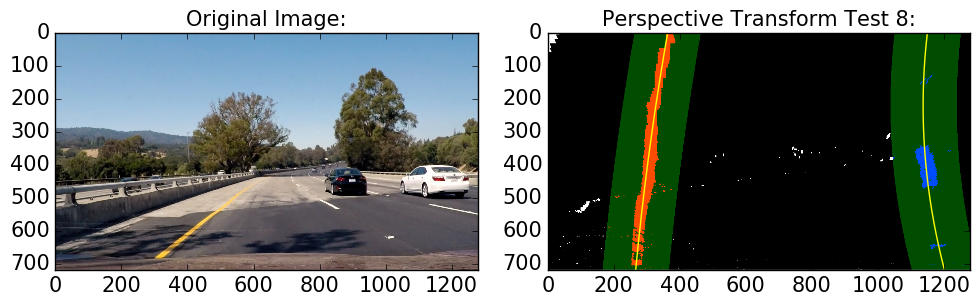

In [17]:
n=0
for img in test_img:
    img_rgb = bgr_to_rgb(img)
    new_img = undistort_image(img_rgb, obj_points, img_points, nx, ny)
    new_img2 = combined_thresholds(new_img)
    new_img3, M, Minv = transform_perspective(new_img2)
    windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(new_img3)
    shades_img, ploty, left_fitx, right_fitx, left_fit, right_fit = shaded_lanes(new_img3, left_fit, right_fit)
    plotter(img_rgb, shades_img, 'Perspective Transform', n)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    n+=1

### Step 5: Determine Lane Curvature

##### Detect the curvature of the lane and warp back to the original image

In [18]:
def roc_pixels(ploty, left_fit, right_fit, leftx, rightx, n):
    """
    Calculating the radius of curvature in pixel space.
    Using the code provided as guide
    """
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    print('Test Image {0}\nLeft Radius of Curvature: {1:2f} pixels\nRight Radius of Curvature: {2:2f} pixels\n'.format(n+1, left_curverad, right_curverad))
    return left_curverad, right_curverad

In [19]:
def roc_meters(ploty, left_fit, right_fit, leftx, rightx, n):
    """
    Converting pixel space radius of curvature values to
    real-world space.
    Using the code provided as guide
    """
    ym_per_pix = 30/550
    xm_per_pix = 3.5/1000
    y_eval = np.max(ploty)
    leftx = np.array(leftx, dtype=np.float32)
    rightx = np.array(rightx, dtype=np.float32)
    left_fit_cr = np.polyfit(leftx*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(rightx*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    print('Left Radius of Curvature: {0:2f} meters\nRight Radius of Curvature: {1:2f} meters\n'.format(left_curverad, right_curverad))
    return left_curverad, right_curverad

In [20]:
def offset(img_center, leftx_base, rightx_base, n):
    """
    Determining vehicle position with respect to center.
    Assume the camera is mounted at the center of the car, 
    such that the lane center is the midpoint at the bottom 
    of the image between the two lines you've detected. 
    The offset of the lane center from the center of the 
    image (converted from pixels to meters) is your distance 
    from the center of the lane. 
    """
    poly_center = (leftx_base + rightx_base) / 2
    diff_pix = img_center - poly_center
    xm_per_pix = 3.5/1000
    offset = diff_pix * xm_per_pix
    print('Test Image: {0}\nOffset from Lane Center: {1:2f} meters\n'.format(n+1, offset))
    return offset

In [21]:
def lane_mapping(img_shape, warped, Minv, ploty, left_fitx, right_fitx, undistorted):
    """
    Warp the detected lane boundaries back onto the original image.
    """
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0)) 
    newwarp = cv2.warpPerspective(color_warp, Minv, (img_shape[1], img_shape[0])) 
    out_img = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    return out_img

Left Radius of Curvature: 310195324.876489 meters
Right Radius of Curvature: 1373.981912 meters

Test Image: 1
Offset from Lane Center: -0.070000 meters

Left Radius of Curvature: 222788806439.704437 meters
Right Radius of Curvature: 1447.535637 meters

Test Image: 1
Offset from Lane Center: -0.063000 meters

Left Radius of Curvature: 10083411182.127611 meters
Right Radius of Curvature: 1469.011088 meters

Test Image: 1
Offset from Lane Center: -0.168000 meters

Left Radius of Curvature: 330.567254 meters
Right Radius of Curvature: 1382.172793 meters

Test Image: 1
Offset from Lane Center: -0.073500 meters

Left Radius of Curvature: 381.390857 meters
Right Radius of Curvature: 1868.689683 meters

Test Image: 1
Offset from Lane Center: -0.192500 meters

Left Radius of Curvature: 4995700822.097557 meters
Right Radius of Curvature: 1484.264588 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters

Left Radius of Curvature: 411.707661 meters
Right Radius of Curvature: 1470.278540

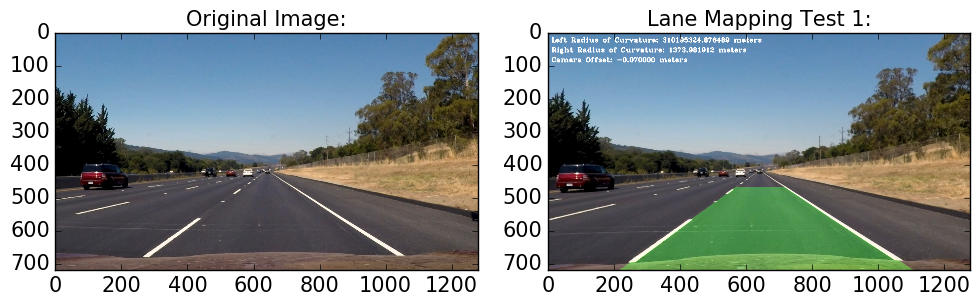

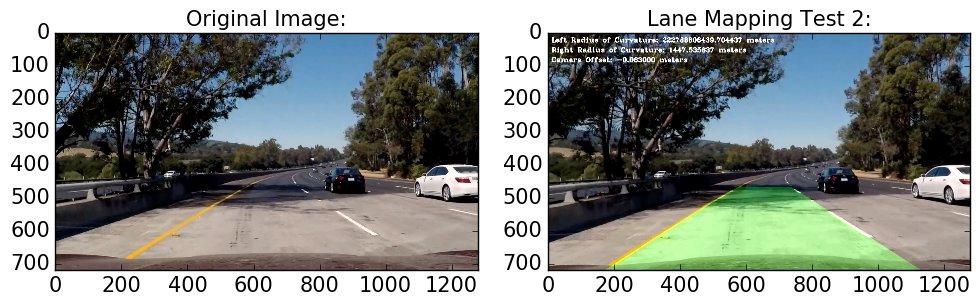

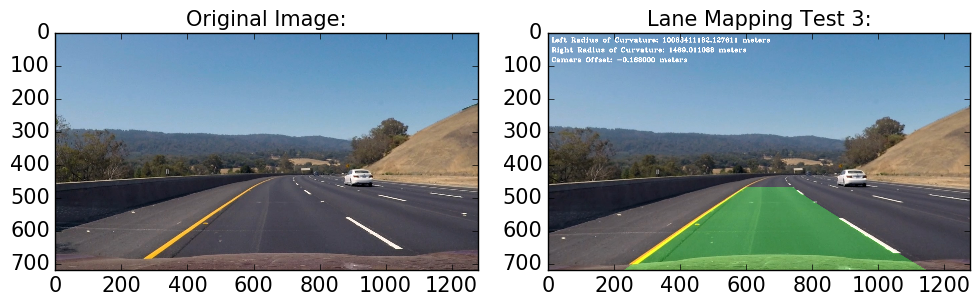

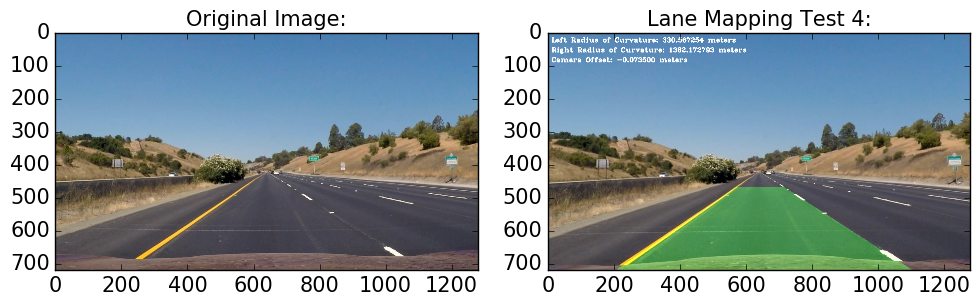

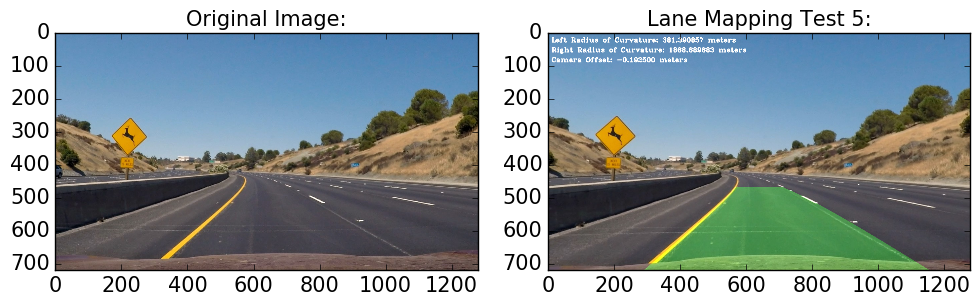

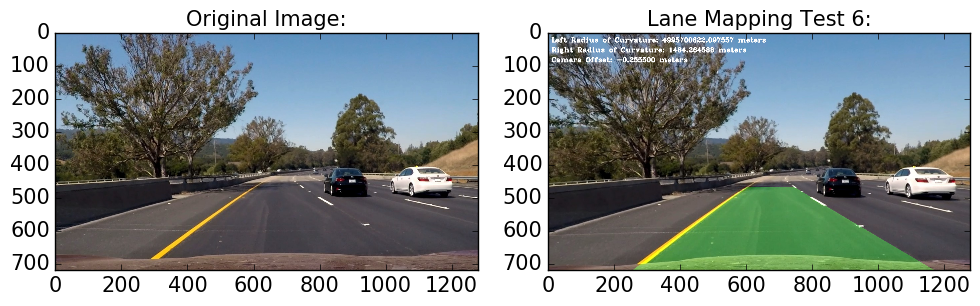

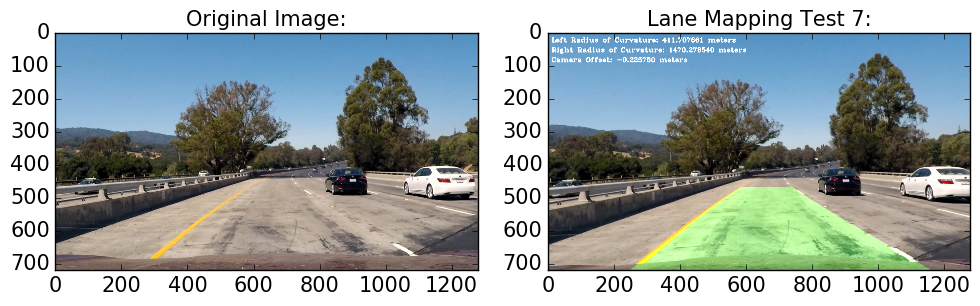

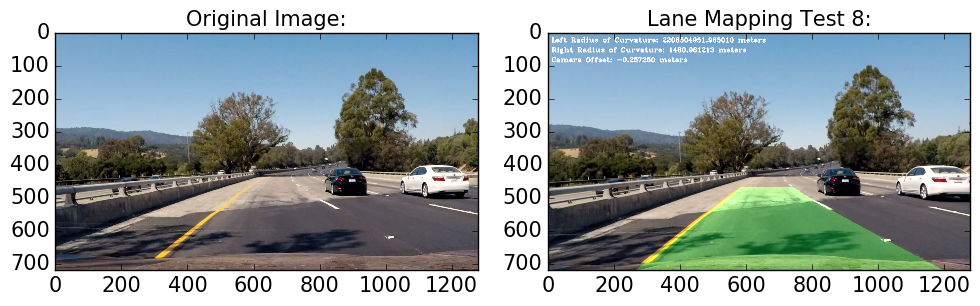

In [33]:
n=0
for img in test_img:
    img_rgb = bgr_to_rgb(img)
    undistort_img = undistort_image(img, obj_points, img_points, nx, ny)
    new_img = combined_thresholds(undistort_img)
    warped_img, M, Minv = transform_perspective(new_img)
    new_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(warped_img)
    new_img = lane_mapping(img.shape[:2], warped_img, Minv, ploty, left_fitx, right_fitx, cv2.cvtColor(undistort_img, cv2.COLOR_BGR2RGB))
    left_curverad, right_curverad = roc_meters(ploty, left_fit, right_fit, leftx, rightx, 0)
    camera = offset(img.shape[1]/2, leftx_base, rightx_base, n=0)
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    cv2.putText(new_img, 'Left Radius of Curvature: {0:6f} meters'.format(left_curverad), (10,30), font, 1, (255,255,255), 2)
    cv2.putText(new_img, 'Right Radius of Curvature: {0:6f} meters'.format(right_curverad),(10,60), font, 1, (255,255,255), 2)
    cv2.putText(new_img, 'Camera Offset: {0:6f} meters'.format(camera), (10,90), font, 1, (255,255,255), 2)
    plotter(img_rgb, new_img, 'Lane Mapping', n)
    n+=1

In [30]:
def process_video(img):
    img_rgb = bgr_to_rgb(img)
    undistort_img = undistort_image(img_rgb, obj_points, img_points, nx, ny)
    new_img = combined_thresholds(undistort_img)
    warped_img, M, Minv = transform_perspective(new_img)
    new_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(warped_img)
    new_img = lane_mapping(img.shape[:2], warped_img, Minv, ploty, left_fitx, right_fitx, cv2.cvtColor(undistort_img, cv2.COLOR_BGR2RGB))
    left_curverad, right_curverad = roc_meters(ploty, left_fit, right_fit, leftx, rightx, 0)
    camera = offset(img.shape[1]/2, leftx_base, rightx_base, n=0)
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    cv2.putText(new_img, 'Left Radius of Curvature: {0:6f} meters'.format(left_curverad), (10,30), font, 1, (255,255,255), 2)
    cv2.putText(new_img, 'Right Radius of Curvature: {0:6f} meters'.format(right_curverad),(10,60), font, 1, (255,255,255), 2)
    cv2.putText(new_img, 'Camera Offset: {0:6f} meters'.format(camera), (10,90), font, 1, (255,255,255), 2)
    return new_img

In [32]:
project_video = os.path.join(base_dir, 'project_video.mp4')
video_output = 'P4_output_video.mp4'
clip = VideoFileClip(project_video)

output_clip = clip.fl_image(process_video)
%time output_clip.write_videofile(video_output, audio=False)

Left Radius of Curvature: 375.255155 meters
Right Radius of Curvature: 1602.811973 meters

Test Image: 1
Offset from Lane Center: -0.266000 meters

[MoviePy] >>>> Building video P4_output_video.mp4
[MoviePy] Writing video P4_output_video.mp4


  0%|          | 1/1261 [00:02<53:50,  2.56s/it]

Left Radius of Curvature: 375.255155 meters
Right Radius of Curvature: 1602.811973 meters

Test Image: 1
Offset from Lane Center: -0.266000 meters



  0%|          | 2/1261 [00:05<55:04,  2.62s/it]

Left Radius of Curvature: 382.938600 meters
Right Radius of Curvature: 1615.376881 meters

Test Image: 1
Offset from Lane Center: -0.281750 meters



  0%|          | 3/1261 [00:07<54:12,  2.59s/it]

Left Radius of Curvature: 386.360174 meters
Right Radius of Curvature: 1627.812029 meters

Test Image: 1
Offset from Lane Center: -0.297500 meters



  0%|          | 4/1261 [00:10<51:50,  2.47s/it]

Left Radius of Curvature: 389.737913 meters
Right Radius of Curvature: 1783.024353 meters

Test Image: 1
Offset from Lane Center: -0.318500 meters



  0%|          | 5/1261 [00:12<52:12,  2.49s/it]

Left Radius of Curvature: 390.812024 meters
Right Radius of Curvature: 1737.520462 meters

Test Image: 1
Offset from Lane Center: -0.343000 meters



  0%|          | 6/1261 [00:15<53:25,  2.55s/it]

Left Radius of Curvature: 391.147470 meters
Right Radius of Curvature: 1780.736292 meters

Test Image: 1
Offset from Lane Center: -0.330750 meters



  1%|          | 7/1261 [00:19<1:04:39,  3.09s/it]

Left Radius of Curvature: 390.252642 meters
Right Radius of Curvature: 1777.670379 meters

Test Image: 1
Offset from Lane Center: -0.351750 meters



  1%|          | 8/1261 [00:22<1:06:18,  3.18s/it]

Left Radius of Curvature: 391.611862 meters
Right Radius of Curvature: 1928.764054 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



  1%|          | 9/1261 [00:26<1:05:57,  3.16s/it]

Left Radius of Curvature: 384.422429 meters
Right Radius of Curvature: 1892.318746 meters

Test Image: 1
Offset from Lane Center: -0.185500 meters



  1%|          | 10/1261 [00:30<1:12:48,  3.49s/it]

Left Radius of Curvature: 382.262677 meters
Right Radius of Curvature: 1775.222596 meters

Test Image: 1
Offset from Lane Center: -0.199500 meters



  1%|          | 11/1261 [00:34<1:16:38,  3.68s/it]

Left Radius of Curvature: 381.165763 meters
Right Radius of Curvature: 1752.339391 meters

Test Image: 1
Offset from Lane Center: -0.213500 meters



  1%|          | 12/1261 [00:38<1:20:36,  3.87s/it]

Left Radius of Curvature: 374.683080 meters
Right Radius of Curvature: 1712.078753 meters

Test Image: 1
Offset from Lane Center: -0.234500 meters



  1%|          | 13/1261 [00:42<1:18:04,  3.75s/it]

Left Radius of Curvature: 374.754589 meters
Right Radius of Curvature: 1613.388700 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



  1%|          | 14/1261 [00:46<1:19:35,  3.83s/it]

Left Radius of Curvature: 374.130855 meters
Right Radius of Curvature: 1569.304850 meters

Test Image: 1
Offset from Lane Center: -0.269500 meters



  1%|          | 15/1261 [00:49<1:17:02,  3.71s/it]

Left Radius of Curvature: 376.425451 meters
Right Radius of Curvature: 1615.757102 meters

Test Image: 1
Offset from Lane Center: -0.283500 meters



  1%|▏         | 16/1261 [00:53<1:17:09,  3.72s/it]

Left Radius of Curvature: 374.819785 meters
Right Radius of Curvature: 1745.108984 meters

Test Image: 1
Offset from Lane Center: -0.292250 meters



  1%|▏         | 17/1261 [00:56<1:13:21,  3.54s/it]

Left Radius of Curvature: 374.366393 meters
Right Radius of Curvature: 1687.388451 meters

Test Image: 1
Offset from Lane Center: -0.299250 meters



  1%|▏         | 18/1261 [00:59<1:08:50,  3.32s/it]

Left Radius of Curvature: 370.003396 meters
Right Radius of Curvature: 1696.827441 meters

Test Image: 1
Offset from Lane Center: -0.302750 meters



  2%|▏         | 19/1261 [01:03<1:10:55,  3.43s/it]

Left Radius of Curvature: 363.876548 meters
Right Radius of Curvature: 1634.811593 meters

Test Image: 1
Offset from Lane Center: -0.316750 meters



  2%|▏         | 20/1261 [01:05<1:05:41,  3.18s/it]

Left Radius of Curvature: 361.538364 meters
Right Radius of Curvature: 1702.022435 meters

Test Image: 1
Offset from Lane Center: -0.297500 meters



  2%|▏         | 21/1261 [01:08<1:04:49,  3.14s/it]

Left Radius of Curvature: 356.902200 meters
Right Radius of Curvature: 1815.865152 meters

Test Image: 1
Offset from Lane Center: -0.133000 meters



  2%|▏         | 22/1261 [01:12<1:05:41,  3.18s/it]

Left Radius of Curvature: 350.304879 meters
Right Radius of Curvature: 1809.941674 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



  2%|▏         | 23/1261 [01:14<1:01:58,  3.00s/it]

Left Radius of Curvature: 344.751901 meters
Right Radius of Curvature: 1715.104466 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



  2%|▏         | 24/1261 [01:18<1:04:34,  3.13s/it]

Left Radius of Curvature: 343.935781 meters
Right Radius of Curvature: 1687.615282 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



  2%|▏         | 25/1261 [01:21<1:03:38,  3.09s/it]

Left Radius of Curvature: 344.673058 meters
Right Radius of Curvature: 1676.913587 meters

Test Image: 1
Offset from Lane Center: -0.199500 meters



  2%|▏         | 26/1261 [01:23<1:00:06,  2.92s/it]

Left Radius of Curvature: 339.847759 meters
Right Radius of Curvature: 1631.858785 meters

Test Image: 1
Offset from Lane Center: -0.204750 meters



  2%|▏         | 27/1261 [01:25<56:10,  2.73s/it]  

Left Radius of Curvature: 338.312139 meters
Right Radius of Curvature: 1623.585042 meters

Test Image: 1
Offset from Lane Center: -0.232750 meters



  2%|▏         | 28/1261 [01:28<54:14,  2.64s/it]

Left Radius of Curvature: 336.149398 meters
Right Radius of Curvature: 1618.545513 meters

Test Image: 1
Offset from Lane Center: -0.238000 meters



  2%|▏         | 29/1261 [01:30<54:38,  2.66s/it]

Left Radius of Curvature: 336.258080 meters
Right Radius of Curvature: 1627.773470 meters

Test Image: 1
Offset from Lane Center: -0.259000 meters



  2%|▏         | 30/1261 [01:35<1:09:01,  3.36s/it]

Left Radius of Curvature: 347.110952 meters
Right Radius of Curvature: 1697.800130 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



  2%|▏         | 31/1261 [01:41<1:23:18,  4.06s/it]

Left Radius of Curvature: 352.003729 meters
Right Radius of Curvature: 1697.051662 meters

Test Image: 1
Offset from Lane Center: -0.260750 meters



  3%|▎         | 32/1261 [01:44<1:17:04,  3.76s/it]

Left Radius of Curvature: 357.574570 meters
Right Radius of Curvature: 1737.440030 meters

Test Image: 1
Offset from Lane Center: -0.264250 meters



  3%|▎         | 33/1261 [01:47<1:12:15,  3.53s/it]

Left Radius of Curvature: 354.036970 meters
Right Radius of Curvature: 1766.581532 meters

Test Image: 1
Offset from Lane Center: -0.194250 meters



  3%|▎         | 34/1261 [01:52<1:17:01,  3.77s/it]

Left Radius of Curvature: 357.416161 meters
Right Radius of Curvature: 1890.089928 meters

Test Image: 1
Offset from Lane Center: -0.124250 meters



  3%|▎         | 35/1261 [01:54<1:11:56,  3.52s/it]

Left Radius of Curvature: 359.753008 meters
Right Radius of Curvature: 1779.949495 meters

Test Image: 1
Offset from Lane Center: -0.141750 meters



  3%|▎         | 36/1261 [01:59<1:15:32,  3.70s/it]

Left Radius of Curvature: 363.765611 meters
Right Radius of Curvature: 1777.912438 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



  3%|▎         | 37/1261 [02:02<1:12:07,  3.54s/it]

Left Radius of Curvature: 361.605154 meters
Right Radius of Curvature: 1735.316083 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



  3%|▎         | 38/1261 [02:06<1:14:00,  3.63s/it]

Left Radius of Curvature: 367.830195 meters
Right Radius of Curvature: 1655.012185 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



  3%|▎         | 39/1261 [02:09<1:12:56,  3.58s/it]

Left Radius of Curvature: 369.324145 meters
Right Radius of Curvature: 1656.037698 meters

Test Image: 1
Offset from Lane Center: -0.227500 meters



  3%|▎         | 40/1261 [02:13<1:14:02,  3.64s/it]

Left Radius of Curvature: 370.523118 meters
Right Radius of Curvature: 1694.537892 meters

Test Image: 1
Offset from Lane Center: -0.239750 meters



  3%|▎         | 41/1261 [02:17<1:18:52,  3.88s/it]

Left Radius of Curvature: 373.497690 meters
Right Radius of Curvature: 1828.696146 meters

Test Image: 1
Offset from Lane Center: -0.257250 meters



  3%|▎         | 42/1261 [02:21<1:15:07,  3.70s/it]

Left Radius of Curvature: 377.974623 meters
Right Radius of Curvature: 1750.045006 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



  3%|▎         | 43/1261 [02:25<1:18:28,  3.87s/it]

Left Radius of Curvature: 377.889237 meters
Right Radius of Curvature: 1717.389713 meters

Test Image: 1
Offset from Lane Center: -0.283500 meters



  3%|▎         | 44/1261 [02:28<1:12:37,  3.58s/it]

Left Radius of Curvature: 375.018951 meters
Right Radius of Curvature: 1739.764518 meters

Test Image: 1
Offset from Lane Center: -0.288750 meters



  4%|▎         | 45/1261 [02:32<1:16:34,  3.78s/it]

Left Radius of Curvature: 373.536347 meters
Right Radius of Curvature: 1723.537362 meters

Test Image: 1
Offset from Lane Center: -0.304500 meters



  4%|▎         | 46/1261 [02:35<1:13:06,  3.61s/it]

Left Radius of Curvature: 372.103382 meters
Right Radius of Curvature: 1804.940508 meters

Test Image: 1
Offset from Lane Center: -0.122500 meters



  4%|▎         | 47/1261 [02:39<1:12:19,  3.57s/it]

Left Radius of Curvature: 369.532335 meters
Right Radius of Curvature: 1903.937022 meters

Test Image: 1
Offset from Lane Center: -0.141750 meters



  4%|▍         | 48/1261 [02:43<1:14:31,  3.69s/it]

Left Radius of Curvature: 368.542676 meters
Right Radius of Curvature: 1775.765778 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



  4%|▍         | 49/1261 [02:46<1:11:20,  3.53s/it]

Left Radius of Curvature: 364.877440 meters
Right Radius of Curvature: 1774.763310 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



  4%|▍         | 50/1261 [02:50<1:15:42,  3.75s/it]

Left Radius of Curvature: 365.004559 meters
Right Radius of Curvature: 1755.893176 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



  4%|▍         | 51/1261 [02:55<1:21:14,  4.03s/it]

Left Radius of Curvature: 363.011980 meters
Right Radius of Curvature: 1686.280416 meters

Test Image: 1
Offset from Lane Center: -0.227500 meters



  4%|▍         | 52/1261 [02:59<1:24:30,  4.19s/it]

Left Radius of Curvature: 363.645835 meters
Right Radius of Curvature: 1672.979969 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



  4%|▍         | 53/1261 [03:03<1:22:29,  4.10s/it]

Left Radius of Curvature: 361.299677 meters
Right Radius of Curvature: 1652.887017 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



  4%|▍         | 54/1261 [03:09<1:35:06,  4.73s/it]

Left Radius of Curvature: 358.415871 meters
Right Radius of Curvature: 1834.338139 meters

Test Image: 1
Offset from Lane Center: -0.269500 meters



  4%|▍         | 55/1261 [03:15<1:40:55,  5.02s/it]

Left Radius of Curvature: 353.987114 meters
Right Radius of Curvature: 1779.518044 meters

Test Image: 1
Offset from Lane Center: -0.281750 meters



  4%|▍         | 56/1261 [03:19<1:34:44,  4.72s/it]

Left Radius of Curvature: 350.639861 meters
Right Radius of Curvature: 1738.037960 meters

Test Image: 1
Offset from Lane Center: -0.287000 meters



  5%|▍         | 57/1261 [03:23<1:28:34,  4.41s/it]

Left Radius of Curvature: 347.500099 meters
Right Radius of Curvature: 1741.974574 meters

Test Image: 1
Offset from Lane Center: -0.280000 meters



  5%|▍         | 58/1261 [03:26<1:23:52,  4.18s/it]

Left Radius of Curvature: 344.655452 meters
Right Radius of Curvature: 1865.744653 meters

Test Image: 1
Offset from Lane Center: -0.185500 meters



  5%|▍         | 59/1261 [03:29<1:14:29,  3.72s/it]

Left Radius of Curvature: 347.842993 meters
Right Radius of Curvature: 1964.378093 meters

Test Image: 1
Offset from Lane Center: -0.108500 meters



  5%|▍         | 60/1261 [03:32<1:10:58,  3.55s/it]

Left Radius of Curvature: 347.265048 meters
Right Radius of Curvature: 1829.883935 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



  5%|▍         | 61/1261 [03:36<1:11:21,  3.57s/it]

Left Radius of Curvature: 343.897227 meters
Right Radius of Curvature: 1806.617356 meters

Test Image: 1
Offset from Lane Center: -0.126000 meters



  5%|▍         | 62/1261 [03:39<1:06:47,  3.34s/it]

Left Radius of Curvature: 345.996278 meters
Right Radius of Curvature: 1744.101127 meters

Test Image: 1
Offset from Lane Center: -0.138250 meters



  5%|▍         | 63/1261 [03:42<1:08:49,  3.45s/it]

Left Radius of Curvature: 344.209003 meters
Right Radius of Curvature: 1628.755261 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



  5%|▌         | 64/1261 [03:45<1:06:34,  3.34s/it]

Left Radius of Curvature: 345.860964 meters
Right Radius of Curvature: 1658.426631 meters

Test Image: 1
Offset from Lane Center: -0.176750 meters



  5%|▌         | 65/1261 [03:49<1:07:42,  3.40s/it]

Left Radius of Curvature: 342.367200 meters
Right Radius of Curvature: 1731.579031 meters

Test Image: 1
Offset from Lane Center: -0.187250 meters



  5%|▌         | 66/1261 [03:52<1:05:39,  3.30s/it]

Left Radius of Curvature: 340.905852 meters
Right Radius of Curvature: 1720.704446 meters

Test Image: 1
Offset from Lane Center: -0.201250 meters



  5%|▌         | 67/1261 [03:55<1:02:50,  3.16s/it]

Left Radius of Curvature: 341.288376 meters
Right Radius of Curvature: 1664.352908 meters

Test Image: 1
Offset from Lane Center: -0.217000 meters



  5%|▌         | 68/1261 [03:59<1:07:38,  3.40s/it]

Left Radius of Curvature: 347.132565 meters
Right Radius of Curvature: 1610.868793 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



  5%|▌         | 69/1261 [04:02<1:03:12,  3.18s/it]

Left Radius of Curvature: 351.701644 meters
Right Radius of Curvature: 1691.530459 meters

Test Image: 1
Offset from Lane Center: -0.220500 meters



  6%|▌         | 70/1261 [04:06<1:08:43,  3.46s/it]

Left Radius of Curvature: 347.220772 meters
Right Radius of Curvature: 12538874283.874855 meters

Test Image: 1
Offset from Lane Center: -0.217000 meters



  6%|▌         | 71/1261 [04:09<1:05:34,  3.31s/it]

Left Radius of Curvature: 348.745349 meters
Right Radius of Curvature: 1762.430519 meters

Test Image: 1
Offset from Lane Center: -0.035000 meters



  6%|▌         | 72/1261 [04:12<1:04:39,  3.26s/it]

Left Radius of Curvature: 344.529560 meters
Right Radius of Curvature: 1679.041173 meters

Test Image: 1
Offset from Lane Center: -0.052500 meters



  6%|▌         | 73/1261 [04:15<1:04:45,  3.27s/it]

Left Radius of Curvature: 339.250036 meters
Right Radius of Curvature: 1652.088538 meters

Test Image: 1
Offset from Lane Center: -0.068250 meters



  6%|▌         | 74/1261 [04:18<1:01:10,  3.09s/it]

Left Radius of Curvature: 334.863440 meters
Right Radius of Curvature: 1612.105968 meters

Test Image: 1
Offset from Lane Center: -0.099750 meters



  6%|▌         | 75/1261 [04:21<1:02:50,  3.18s/it]

Left Radius of Curvature: 329.252685 meters
Right Radius of Curvature: 1572.364640 meters

Test Image: 1
Offset from Lane Center: -0.099750 meters



  6%|▌         | 76/1261 [04:24<1:00:53,  3.08s/it]

Left Radius of Curvature: 328.324862 meters
Right Radius of Curvature: 1543.069909 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



  6%|▌         | 77/1261 [04:27<1:00:17,  3.06s/it]

Left Radius of Curvature: 319.564219 meters
Right Radius of Curvature: 1535.991743 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



  6%|▌         | 78/1261 [04:31<1:04:17,  3.26s/it]

Left Radius of Curvature: 316.771927 meters
Right Radius of Curvature: 1553.857358 meters

Test Image: 1
Offset from Lane Center: -0.159250 meters



  6%|▋         | 79/1261 [04:34<1:02:13,  3.16s/it]

Left Radius of Curvature: 307.272359 meters
Right Radius of Curvature: 1565.096049 meters

Test Image: 1
Offset from Lane Center: -0.159250 meters



  6%|▋         | 80/1261 [04:37<1:06:00,  3.35s/it]

Left Radius of Curvature: 306.217242 meters
Right Radius of Curvature: 1659.918205 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



  6%|▋         | 81/1261 [04:41<1:05:48,  3.35s/it]

Left Radius of Curvature: 313.440962 meters
Right Radius of Curvature: 1620.917674 meters

Test Image: 1
Offset from Lane Center: -0.168000 meters



  7%|▋         | 82/1261 [04:44<1:08:17,  3.48s/it]

Left Radius of Curvature: 308.782233 meters
Right Radius of Curvature: 1579.071394 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



  7%|▋         | 83/1261 [04:48<1:06:51,  3.41s/it]

Left Radius of Curvature: 307.056220 meters
Right Radius of Curvature: 1588.895072 meters

Test Image: 1
Offset from Lane Center: -0.108500 meters



  7%|▋         | 84/1261 [04:51<1:08:39,  3.50s/it]

Left Radius of Curvature: 299.397373 meters
Right Radius of Curvature: 1603.120257 meters

Test Image: 1
Offset from Lane Center: -0.112000 meters



  7%|▋         | 85/1261 [04:55<1:09:29,  3.55s/it]

Left Radius of Curvature: 300.859700 meters
Right Radius of Curvature: 1755.799543 meters

Test Image: 1
Offset from Lane Center: -0.029750 meters



  7%|▋         | 86/1261 [04:58<1:04:38,  3.30s/it]

Left Radius of Curvature: 300.118915 meters
Right Radius of Curvature: 1687.369153 meters

Test Image: 1
Offset from Lane Center: -0.042000 meters



  7%|▋         | 87/1261 [05:02<1:07:27,  3.45s/it]

Left Radius of Curvature: 304.226536 meters
Right Radius of Curvature: 1656.567303 meters

Test Image: 1
Offset from Lane Center: -0.061250 meters



  7%|▋         | 88/1261 [05:04<1:03:47,  3.26s/it]

Left Radius of Curvature: 307.146807 meters
Right Radius of Curvature: 1552.847113 meters

Test Image: 1
Offset from Lane Center: -0.085750 meters



  7%|▋         | 89/1261 [05:08<1:03:44,  3.26s/it]

Left Radius of Curvature: 309.491311 meters
Right Radius of Curvature: 1561.110885 meters

Test Image: 1
Offset from Lane Center: -0.101500 meters



  7%|▋         | 90/1261 [05:11<1:05:11,  3.34s/it]

Left Radius of Curvature: 319.091495 meters
Right Radius of Curvature: 1633.134282 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



  7%|▋         | 91/1261 [05:15<1:05:06,  3.34s/it]

Left Radius of Curvature: 321.106821 meters
Right Radius of Curvature: 1661.190512 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



  7%|▋         | 92/1261 [05:19<1:08:41,  3.53s/it]

Left Radius of Curvature: 329.854766 meters
Right Radius of Curvature: 1609.719790 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



  7%|▋         | 93/1261 [05:21<1:02:57,  3.23s/it]

Left Radius of Curvature: 338.727025 meters
Right Radius of Curvature: 1596.957288 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



  7%|▋         | 94/1261 [05:24<1:02:49,  3.23s/it]

Left Radius of Curvature: 340.203168 meters
Right Radius of Curvature: 1611.879758 meters

Test Image: 1
Offset from Lane Center: -0.180250 meters



  8%|▊         | 95/1261 [05:27<1:02:21,  3.21s/it]

Left Radius of Curvature: 340.801607 meters
Right Radius of Curvature: 1669.410794 meters

Test Image: 1
Offset from Lane Center: -0.180250 meters



  8%|▊         | 96/1261 [05:30<59:03,  3.04s/it]  

Left Radius of Curvature: 339.946837 meters
Right Radius of Curvature: 1705.222915 meters

Test Image: 1
Offset from Lane Center: -0.022750 meters



  8%|▊         | 97/1261 [05:34<1:02:02,  3.20s/it]

Left Radius of Curvature: 340.235474 meters
Right Radius of Curvature: 1655.050634 meters

Test Image: 1
Offset from Lane Center: -0.042000 meters



  8%|▊         | 98/1261 [05:36<59:20,  3.06s/it]  

Left Radius of Curvature: 333.455875 meters
Right Radius of Curvature: 1611.390281 meters

Test Image: 1
Offset from Lane Center: -0.061250 meters



  8%|▊         | 99/1261 [05:39<58:40,  3.03s/it]

Left Radius of Curvature: 335.724668 meters
Right Radius of Curvature: 1603.614685 meters

Test Image: 1
Offset from Lane Center: -0.075250 meters



  8%|▊         | 100/1261 [05:43<1:01:14,  3.17s/it]

Left Radius of Curvature: 330.530886 meters
Right Radius of Curvature: 1580.405072 meters

Test Image: 1
Offset from Lane Center: -0.106750 meters



  8%|▊         | 101/1261 [05:45<57:46,  2.99s/it]  

Left Radius of Curvature: 331.795264 meters
Right Radius of Curvature: 1560.783144 meters

Test Image: 1
Offset from Lane Center: -0.122500 meters



  8%|▊         | 102/1261 [05:49<59:26,  3.08s/it]

Left Radius of Curvature: 330.317863 meters
Right Radius of Curvature: 1583.540959 meters

Test Image: 1
Offset from Lane Center: -0.140000 meters



  8%|▊         | 103/1261 [05:52<59:36,  3.09s/it]

Left Radius of Curvature: 334.310856 meters
Right Radius of Curvature: 1585.121007 meters

Test Image: 1
Offset from Lane Center: -0.150500 meters



  8%|▊         | 104/1261 [05:55<57:28,  2.98s/it]

Left Radius of Curvature: 340.354945 meters
Right Radius of Curvature: 1695.439038 meters

Test Image: 1
Offset from Lane Center: -0.166250 meters



  8%|▊         | 105/1261 [05:58<1:01:47,  3.21s/it]

Left Radius of Curvature: 342.408219 meters
Right Radius of Curvature: 1672.380319 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



  8%|▊         | 106/1261 [06:01<58:10,  3.02s/it]  

Left Radius of Curvature: 341.733770 meters
Right Radius of Curvature: 1607.898768 meters

Test Image: 1
Offset from Lane Center: -0.187250 meters



  8%|▊         | 107/1261 [06:04<58:47,  3.06s/it]

Left Radius of Curvature: 341.049350 meters
Right Radius of Curvature: 1566.037240 meters

Test Image: 1
Offset from Lane Center: -0.190750 meters



  9%|▊         | 108/1261 [06:07<1:00:19,  3.14s/it]

Left Radius of Curvature: 346.922017 meters
Right Radius of Curvature: 1547.234290 meters

Test Image: 1
Offset from Lane Center: -0.203000 meters



  9%|▊         | 109/1261 [06:10<57:07,  2.98s/it]  

Left Radius of Curvature: 346.081726 meters
Right Radius of Curvature: 1718.429139 meters

Test Image: 1
Offset from Lane Center: -0.075250 meters



  9%|▊         | 110/1261 [06:14<1:00:18,  3.14s/it]

Left Radius of Curvature: 343.439314 meters
Right Radius of Curvature: 1732.590734 meters

Test Image: 1
Offset from Lane Center: -0.096250 meters



  9%|▉         | 111/1261 [06:16<58:36,  3.06s/it]  

Left Radius of Curvature: 347.061718 meters
Right Radius of Curvature: 1646.717616 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



  9%|▉         | 112/1261 [06:19<57:41,  3.01s/it]

Left Radius of Curvature: 341.922692 meters
Right Radius of Curvature: 1627.381476 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



  9%|▉         | 113/1261 [06:23<1:00:48,  3.18s/it]

Left Radius of Curvature: 346.991415 meters
Right Radius of Curvature: 1610.061858 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



  9%|▉         | 114/1261 [06:25<57:44,  3.02s/it]  

Left Radius of Curvature: 345.173494 meters
Right Radius of Curvature: 1529.481957 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



  9%|▉         | 115/1261 [06:29<1:00:08,  3.15s/it]

Left Radius of Curvature: 351.552608 meters
Right Radius of Curvature: 1561.008662 meters

Test Image: 1
Offset from Lane Center: -0.197750 meters



  9%|▉         | 116/1261 [06:32<59:57,  3.14s/it]  

Left Radius of Curvature: 359.371122 meters
Right Radius of Curvature: 1641.157177 meters

Test Image: 1
Offset from Lane Center: -0.213500 meters



  9%|▉         | 117/1261 [06:35<56:41,  2.97s/it]

Left Radius of Curvature: 363.583881 meters
Right Radius of Curvature: 1681.526919 meters

Test Image: 1
Offset from Lane Center: -0.232750 meters



  9%|▉         | 118/1261 [06:37<52:49,  2.77s/it]

Left Radius of Curvature: 364.404723 meters
Right Radius of Curvature: 1660.200589 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



  9%|▉         | 119/1261 [06:39<50:34,  2.66s/it]

Left Radius of Curvature: 361.307956 meters
Right Radius of Curvature: 1651.557443 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 10%|▉         | 120/1261 [06:42<50:31,  2.66s/it]

Left Radius of Curvature: 368.479923 meters
Right Radius of Curvature: 1797.954213 meters

Test Image: 1
Offset from Lane Center: -0.250250 meters



 10%|▉         | 121/1261 [06:47<1:02:12,  3.27s/it]

Left Radius of Curvature: 368.685788 meters
Right Radius of Curvature: 1853.214892 meters

Test Image: 1
Offset from Lane Center: -0.197750 meters



 10%|▉         | 122/1261 [06:49<56:15,  2.96s/it]  

Left Radius of Curvature: 369.605324 meters
Right Radius of Curvature: 1841.632258 meters

Test Image: 1
Offset from Lane Center: -0.113750 meters



 10%|▉         | 123/1261 [06:51<52:09,  2.75s/it]

Left Radius of Curvature: 374.064933 meters
Right Radius of Curvature: 1819.627608 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 10%|▉         | 124/1261 [06:54<49:51,  2.63s/it]

Left Radius of Curvature: 374.513834 meters
Right Radius of Curvature: 1753.960904 meters

Test Image: 1
Offset from Lane Center: -0.155750 meters



 10%|▉         | 125/1261 [06:57<53:56,  2.85s/it]

Left Radius of Curvature: 375.438219 meters
Right Radius of Curvature: 1756.626417 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 10%|▉         | 126/1261 [07:00<54:59,  2.91s/it]

Left Radius of Curvature: 371.793541 meters
Right Radius of Curvature: 1647.933823 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 10%|█         | 127/1261 [07:03<53:21,  2.82s/it]

Left Radius of Curvature: 372.465661 meters
Right Radius of Curvature: 1665.620588 meters

Test Image: 1
Offset from Lane Center: -0.213500 meters



 10%|█         | 128/1261 [07:06<57:46,  3.06s/it]

Left Radius of Curvature: 375.242328 meters
Right Radius of Curvature: 1685.610148 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



 10%|█         | 129/1261 [07:09<55:36,  2.95s/it]

Left Radius of Curvature: 382.301849 meters
Right Radius of Curvature: 1794.242419 meters

Test Image: 1
Offset from Lane Center: -0.257250 meters



 10%|█         | 130/1261 [07:12<55:53,  2.97s/it]

Left Radius of Curvature: 381.364435 meters
Right Radius of Curvature: 1784.356971 meters

Test Image: 1
Offset from Lane Center: -0.274750 meters



 10%|█         | 131/1261 [07:15<58:45,  3.12s/it]

Left Radius of Curvature: 381.952892 meters
Right Radius of Curvature: 1789.934168 meters

Test Image: 1
Offset from Lane Center: -0.281750 meters



 10%|█         | 132/1261 [07:18<56:30,  3.00s/it]

Left Radius of Curvature: 383.920177 meters
Right Radius of Curvature: 1900.256787 meters

Test Image: 1
Offset from Lane Center: -0.283500 meters



 11%|█         | 133/1261 [07:22<1:00:05,  3.20s/it]

Left Radius of Curvature: 378.385846 meters
Right Radius of Curvature: 4671833979.392406 meters

Test Image: 1
Offset from Lane Center: -0.290500 meters



 11%|█         | 134/1261 [07:25<58:11,  3.10s/it]  

Left Radius of Curvature: 379.562556 meters
Right Radius of Curvature: 1927.260831 meters

Test Image: 1
Offset from Lane Center: -0.133000 meters



 11%|█         | 135/1261 [07:28<57:57,  3.09s/it]

Left Radius of Curvature: 379.597495 meters
Right Radius of Curvature: 1839.367050 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



 11%|█         | 136/1261 [07:31<1:00:10,  3.21s/it]

Left Radius of Curvature: 375.504442 meters
Right Radius of Curvature: 1819.163180 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



 11%|█         | 137/1261 [07:34<57:25,  3.07s/it]  

Left Radius of Curvature: 372.115392 meters
Right Radius of Curvature: 1736.939453 meters

Test Image: 1
Offset from Lane Center: -0.201250 meters



 11%|█         | 138/1261 [07:38<1:01:35,  3.29s/it]

Left Radius of Curvature: 367.437322 meters
Right Radius of Curvature: 1708.099641 meters

Test Image: 1
Offset from Lane Center: -0.218750 meters



 11%|█         | 139/1261 [07:41<59:14,  3.17s/it]  

Left Radius of Curvature: 365.286177 meters
Right Radius of Curvature: 1631.044070 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 11%|█         | 140/1261 [07:44<58:46,  3.15s/it]

Left Radius of Curvature: 360.118400 meters
Right Radius of Curvature: 1627.947077 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 11%|█         | 141/1261 [07:47<1:01:01,  3.27s/it]

Left Radius of Curvature: 359.538558 meters
Right Radius of Curvature: 1645.671040 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 11%|█▏        | 142/1261 [07:50<57:50,  3.10s/it]  

Left Radius of Curvature: 359.019170 meters
Right Radius of Curvature: 1713.015927 meters

Test Image: 1
Offset from Lane Center: -0.290500 meters



 11%|█▏        | 143/1261 [07:54<1:01:41,  3.31s/it]

Left Radius of Curvature: 369.926554 meters
Right Radius of Curvature: 1695.122891 meters

Test Image: 1
Offset from Lane Center: -0.292250 meters



 11%|█▏        | 144/1261 [07:57<58:59,  3.17s/it]  

Left Radius of Curvature: 369.496268 meters
Right Radius of Curvature: 1657.143143 meters

Test Image: 1
Offset from Lane Center: -0.302750 meters



 11%|█▏        | 145/1261 [08:00<1:01:16,  3.29s/it]

Left Radius of Curvature: 368.517925 meters
Right Radius of Curvature: 1734.461763 meters

Test Image: 1
Offset from Lane Center: -0.288750 meters



 12%|█▏        | 146/1261 [08:03<1:01:07,  3.29s/it]

Left Radius of Curvature: 369.837494 meters
Right Radius of Curvature: 1767.664385 meters

Test Image: 1
Offset from Lane Center: -0.299250 meters



 12%|█▏        | 147/1261 [08:06<58:11,  3.13s/it]  

Left Radius of Curvature: 369.761988 meters
Right Radius of Curvature: 1764.560849 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 12%|█▏        | 148/1261 [08:10<1:01:06,  3.29s/it]

Left Radius of Curvature: 375.125998 meters
Right Radius of Curvature: 1716.382103 meters

Test Image: 1
Offset from Lane Center: -0.154000 meters



 12%|█▏        | 149/1261 [08:13<57:53,  3.12s/it]  

Left Radius of Curvature: 372.806953 meters
Right Radius of Curvature: 1671.024897 meters

Test Image: 1
Offset from Lane Center: -0.175000 meters



 12%|█▏        | 150/1261 [08:16<57:50,  3.12s/it]

Left Radius of Curvature: 368.150821 meters
Right Radius of Curvature: 1627.496478 meters

Test Image: 1
Offset from Lane Center: -0.196000 meters



 12%|█▏        | 151/1261 [08:20<1:01:31,  3.33s/it]

Left Radius of Curvature: 364.853119 meters
Right Radius of Curvature: 1555.894305 meters

Test Image: 1
Offset from Lane Center: -0.213500 meters



 12%|█▏        | 152/1261 [08:22<58:05,  3.14s/it]  

Left Radius of Curvature: 363.002300 meters
Right Radius of Curvature: 1542.730705 meters

Test Image: 1
Offset from Lane Center: -0.224000 meters



 12%|█▏        | 153/1261 [08:26<1:02:57,  3.41s/it]

Left Radius of Curvature: 359.811864 meters
Right Radius of Curvature: 1658.719385 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 12%|█▏        | 154/1261 [08:29<58:42,  3.18s/it]  

Left Radius of Curvature: 357.233903 meters
Right Radius of Curvature: 1722.315570 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 12%|█▏        | 155/1261 [08:32<58:25,  3.17s/it]

Left Radius of Curvature: 359.565466 meters
Right Radius of Curvature: 1700.770048 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 12%|█▏        | 156/1261 [08:35<58:51,  3.20s/it]

Left Radius of Curvature: 354.766268 meters
Right Radius of Curvature: 1689.137855 meters

Test Image: 1
Offset from Lane Center: -0.269500 meters



 12%|█▏        | 157/1261 [08:38<55:30,  3.02s/it]

Left Radius of Curvature: 355.390771 meters
Right Radius of Curvature: 1689.392340 meters

Test Image: 1
Offset from Lane Center: -0.267750 meters



 13%|█▎        | 158/1261 [08:41<58:00,  3.16s/it]

Left Radius of Curvature: 355.233047 meters
Right Radius of Curvature: 6520587923.848658 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 13%|█▎        | 159/1261 [08:44<55:53,  3.04s/it]

Left Radius of Curvature: 350.227899 meters
Right Radius of Curvature: 1868.044857 meters

Test Image: 1
Offset from Lane Center: -0.101500 meters



 13%|█▎        | 160/1261 [08:47<53:48,  2.93s/it]

Left Radius of Curvature: 351.421501 meters
Right Radius of Curvature: 1794.956360 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



 13%|█▎        | 161/1261 [08:51<57:40,  3.15s/it]

Left Radius of Curvature: 343.972126 meters
Right Radius of Curvature: 1744.539900 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



 13%|█▎        | 162/1261 [08:53<53:59,  2.95s/it]

Left Radius of Curvature: 342.447696 meters
Right Radius of Curvature: 1696.949188 meters

Test Image: 1
Offset from Lane Center: -0.154000 meters



 13%|█▎        | 163/1261 [08:56<54:24,  2.97s/it]

Left Radius of Curvature: 339.796381 meters
Right Radius of Curvature: 1663.000851 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 13%|█▎        | 164/1261 [08:59<55:50,  3.05s/it]

Left Radius of Curvature: 341.236053 meters
Right Radius of Curvature: 1577.521177 meters

Test Image: 1
Offset from Lane Center: -0.182000 meters



 13%|█▎        | 165/1261 [09:02<53:05,  2.91s/it]

Left Radius of Curvature: 345.629279 meters
Right Radius of Curvature: 1574.729268 meters

Test Image: 1
Offset from Lane Center: -0.192500 meters



 13%|█▎        | 166/1261 [09:05<55:28,  3.04s/it]

Left Radius of Curvature: 339.891132 meters
Right Radius of Curvature: 1617.574026 meters

Test Image: 1
Offset from Lane Center: -0.199500 meters



 13%|█▎        | 167/1261 [09:08<55:02,  3.02s/it]

Left Radius of Curvature: 347.142340 meters
Right Radius of Curvature: 1662.647224 meters

Test Image: 1
Offset from Lane Center: -0.218750 meters



 13%|█▎        | 168/1261 [09:11<52:43,  2.89s/it]

Left Radius of Curvature: 344.494426 meters
Right Radius of Curvature: 1623.702475 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 13%|█▎        | 169/1261 [09:13<49:20,  2.71s/it]

Left Radius of Curvature: 342.050448 meters
Right Radius of Curvature: 1589.643861 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 13%|█▎        | 170/1261 [09:15<47:49,  2.63s/it]

Left Radius of Curvature: 335.170911 meters
Right Radius of Curvature: 1580.783386 meters

Test Image: 1
Offset from Lane Center: -0.239750 meters



 14%|█▎        | 171/1261 [09:18<47:13,  2.60s/it]

Left Radius of Curvature: 331.614557 meters
Right Radius of Curvature: 1612.183570 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 14%|█▎        | 172/1261 [09:22<54:54,  3.03s/it]

Left Radius of Curvature: 329.877217 meters
Right Radius of Curvature: 1775.704699 meters

Test Image: 1
Offset from Lane Center: -0.063000 meters



 14%|█▎        | 173/1261 [09:26<58:28,  3.22s/it]

Left Radius of Curvature: 326.281764 meters
Right Radius of Curvature: 1710.834616 meters

Test Image: 1
Offset from Lane Center: -0.080500 meters



 14%|█▍        | 174/1261 [09:29<56:14,  3.10s/it]

Left Radius of Curvature: 327.638925 meters
Right Radius of Curvature: 1703.455053 meters

Test Image: 1
Offset from Lane Center: -0.099750 meters



 14%|█▍        | 175/1261 [09:31<52:59,  2.93s/it]

Left Radius of Curvature: 326.863799 meters
Right Radius of Curvature: 1687.819545 meters

Test Image: 1
Offset from Lane Center: -0.113750 meters



 14%|█▍        | 176/1261 [09:33<49:40,  2.75s/it]

Left Radius of Curvature: 325.160351 meters
Right Radius of Curvature: 1665.497325 meters

Test Image: 1
Offset from Lane Center: -0.127750 meters



 14%|█▍        | 177/1261 [09:36<48:28,  2.68s/it]

Left Radius of Curvature: 321.567713 meters
Right Radius of Curvature: 1673.411933 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 14%|█▍        | 178/1261 [09:38<47:28,  2.63s/it]

Left Radius of Curvature: 314.980859 meters
Right Radius of Curvature: 1750.220623 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 14%|█▍        | 179/1261 [09:43<56:51,  3.15s/it]

Left Radius of Curvature: 315.368943 meters
Right Radius of Curvature: 1842.309001 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



 14%|█▍        | 180/1261 [09:46<59:26,  3.30s/it]

Left Radius of Curvature: 321.220291 meters
Right Radius of Curvature: 1823.878363 meters

Test Image: 1
Offset from Lane Center: -0.201250 meters



 14%|█▍        | 181/1261 [09:50<58:16,  3.24s/it]

Left Radius of Curvature: 324.767226 meters
Right Radius of Curvature: 1849.473759 meters

Test Image: 1
Offset from Lane Center: -0.204750 meters



 14%|█▍        | 182/1261 [09:53<59:15,  3.30s/it]

Left Radius of Curvature: 323.389933 meters
Right Radius of Curvature: 1858.589400 meters

Test Image: 1
Offset from Lane Center: -0.196000 meters



 15%|█▍        | 183/1261 [09:56<58:32,  3.26s/it]

Left Radius of Curvature: 325.275560 meters
Right Radius of Curvature: 7459051740.839604 meters

Test Image: 1
Offset from Lane Center: -0.201250 meters



 15%|█▍        | 184/1261 [09:59<54:59,  3.06s/it]

Left Radius of Curvature: 329.076719 meters
Right Radius of Curvature: 1991.775368 meters

Test Image: 1
Offset from Lane Center: -0.064750 meters



 15%|█▍        | 185/1261 [10:01<50:21,  2.81s/it]

Left Radius of Curvature: 330.900814 meters
Right Radius of Curvature: 1967.870486 meters

Test Image: 1
Offset from Lane Center: -0.091000 meters



 15%|█▍        | 186/1261 [10:03<47:55,  2.67s/it]

Left Radius of Curvature: 342.585167 meters
Right Radius of Curvature: 1894.904752 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



 15%|█▍        | 187/1261 [10:06<46:57,  2.62s/it]

Left Radius of Curvature: 343.637933 meters
Right Radius of Curvature: 1904.126237 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 15%|█▍        | 188/1261 [10:10<54:07,  3.03s/it]

Left Radius of Curvature: 350.586782 meters
Right Radius of Curvature: 1871.508690 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 15%|█▍        | 189/1261 [10:14<58:35,  3.28s/it]

Left Radius of Curvature: 351.943449 meters
Right Radius of Curvature: 1933.136426 meters

Test Image: 1
Offset from Lane Center: -0.189000 meters



 15%|█▌        | 190/1261 [10:16<55:57,  3.13s/it]

Left Radius of Curvature: 362.810611 meters
Right Radius of Curvature: 1876.596827 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



 15%|█▌        | 191/1261 [10:19<52:38,  2.95s/it]

Left Radius of Curvature: 371.506200 meters
Right Radius of Curvature: 1886.677585 meters

Test Image: 1
Offset from Lane Center: -0.232750 meters



 15%|█▌        | 192/1261 [10:21<48:57,  2.75s/it]

Left Radius of Curvature: 370.853286 meters
Right Radius of Curvature: 1873.344143 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 15%|█▌        | 193/1261 [10:24<47:28,  2.67s/it]

Left Radius of Curvature: 373.616894 meters
Right Radius of Curvature: 2518208753087.327637 meters

Test Image: 1
Offset from Lane Center: -0.262500 meters



 15%|█▌        | 194/1261 [10:26<47:40,  2.68s/it]

Left Radius of Curvature: 371.772181 meters
Right Radius of Curvature: 6912242904.343438 meters

Test Image: 1
Offset from Lane Center: -0.267750 meters



 15%|█▌        | 195/1261 [10:31<56:27,  3.18s/it]

Left Radius of Curvature: 369.320437 meters
Right Radius of Curvature: 13644202467.680410 meters

Test Image: 1
Offset from Lane Center: -0.262500 meters



 16%|█▌        | 196/1261 [10:33<51:02,  2.88s/it]

Left Radius of Curvature: 359.284578 meters
Right Radius of Curvature: 1879.820691 meters

Test Image: 1
Offset from Lane Center: -0.091000 meters



 16%|█▌        | 197/1261 [10:35<48:29,  2.73s/it]

Left Radius of Curvature: 345.505713 meters
Right Radius of Curvature: 1820.876457 meters

Test Image: 1
Offset from Lane Center: -0.112000 meters



 16%|█▌        | 198/1261 [10:38<46:12,  2.61s/it]

Left Radius of Curvature: 334.057020 meters
Right Radius of Curvature: 1755.954551 meters

Test Image: 1
Offset from Lane Center: -0.129500 meters



 16%|█▌        | 199/1261 [10:41<48:55,  2.76s/it]

Left Radius of Curvature: 328.194123 meters
Right Radius of Curvature: 1713.257570 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 16%|█▌        | 200/1261 [10:44<51:02,  2.89s/it]

Left Radius of Curvature: 326.324649 meters
Right Radius of Curvature: 1692.766655 meters

Test Image: 1
Offset from Lane Center: -0.159250 meters



 16%|█▌        | 201/1261 [10:47<49:42,  2.81s/it]

Left Radius of Curvature: 321.340688 meters
Right Radius of Curvature: 1638.449659 meters

Test Image: 1
Offset from Lane Center: -0.176750 meters



 16%|█▌        | 202/1261 [10:49<46:44,  2.65s/it]

Left Radius of Curvature: 322.267938 meters
Right Radius of Curvature: 1603.217680 meters

Test Image: 1
Offset from Lane Center: -0.189000 meters



 16%|█▌        | 203/1261 [10:51<44:58,  2.55s/it]

Left Radius of Curvature: 319.168231 meters
Right Radius of Curvature: 1617.419935 meters

Test Image: 1
Offset from Lane Center: -0.197750 meters



 16%|█▌        | 204/1261 [10:54<45:17,  2.57s/it]

Left Radius of Curvature: 320.994091 meters
Right Radius of Curvature: 1689.342651 meters

Test Image: 1
Offset from Lane Center: -0.213500 meters



 16%|█▋        | 205/1261 [10:58<53:11,  3.02s/it]

Left Radius of Curvature: 325.520162 meters
Right Radius of Curvature: 1746.565333 meters

Test Image: 1
Offset from Lane Center: -0.215250 meters



 16%|█▋        | 206/1261 [11:01<51:16,  2.92s/it]

Left Radius of Curvature: 327.126450 meters
Right Radius of Curvature: 1724.485811 meters

Test Image: 1
Offset from Lane Center: -0.217000 meters



 16%|█▋        | 207/1261 [11:03<47:38,  2.71s/it]

Left Radius of Curvature: 335.244186 meters
Right Radius of Curvature: 3216874973.895858 meters

Test Image: 1
Offset from Lane Center: -0.220500 meters



 16%|█▋        | 208/1261 [11:05<46:16,  2.64s/it]

Left Radius of Curvature: 337.844293 meters
Right Radius of Curvature: 1983.047172 meters

Test Image: 1
Offset from Lane Center: -0.040250 meters



 17%|█▋        | 209/1261 [11:08<48:11,  2.75s/it]

Left Radius of Curvature: 333.065215 meters
Right Radius of Curvature: 1889.607948 meters

Test Image: 1
Offset from Lane Center: -0.066500 meters



 17%|█▋        | 210/1261 [11:12<51:15,  2.93s/it]

Left Radius of Curvature: 330.736488 meters
Right Radius of Curvature: 1783.809705 meters

Test Image: 1
Offset from Lane Center: -0.092750 meters



 17%|█▋        | 211/1261 [11:15<51:45,  2.96s/it]

Left Radius of Curvature: 324.017395 meters
Right Radius of Curvature: 1782.108687 meters

Test Image: 1
Offset from Lane Center: -0.110250 meters



 17%|█▋        | 212/1261 [11:17<48:43,  2.79s/it]

Left Radius of Curvature: 326.460900 meters
Right Radius of Curvature: 1770.645573 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 17%|█▋        | 213/1261 [11:20<47:01,  2.69s/it]

Left Radius of Curvature: 325.678546 meters
Right Radius of Curvature: 1649.740907 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 17%|█▋        | 214/1261 [11:22<46:51,  2.69s/it]

Left Radius of Curvature: 329.592072 meters
Right Radius of Curvature: 1693.972181 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



 17%|█▋        | 215/1261 [11:27<55:37,  3.19s/it]

Left Radius of Curvature: 328.519006 meters
Right Radius of Curvature: 1672.633519 meters

Test Image: 1
Offset from Lane Center: -0.176750 meters



 17%|█▋        | 216/1261 [11:30<58:05,  3.34s/it]

Left Radius of Curvature: 331.997454 meters
Right Radius of Curvature: 1780.900109 meters

Test Image: 1
Offset from Lane Center: -0.192500 meters



 17%|█▋        | 217/1261 [11:33<55:05,  3.17s/it]

Left Radius of Curvature: 336.918369 meters
Right Radius of Curvature: 1731.814993 meters

Test Image: 1
Offset from Lane Center: -0.201250 meters



 17%|█▋        | 218/1261 [11:36<51:40,  2.97s/it]

Left Radius of Curvature: 331.724619 meters
Right Radius of Curvature: 1662.218410 meters

Test Image: 1
Offset from Lane Center: -0.192500 meters



 17%|█▋        | 219/1261 [11:38<48:16,  2.78s/it]

Left Radius of Curvature: 333.999896 meters
Right Radius of Curvature: 1752.502449 meters

Test Image: 1
Offset from Lane Center: -0.192500 meters



 17%|█▋        | 220/1261 [11:40<47:19,  2.73s/it]

Left Radius of Curvature: 325.622151 meters
Right Radius of Curvature: 1755.615793 meters

Test Image: 1
Offset from Lane Center: -0.199500 meters



 18%|█▊        | 221/1261 [11:43<47:15,  2.73s/it]

Left Radius of Curvature: 323.786931 meters
Right Radius of Curvature: 1817.920003 meters

Test Image: 1
Offset from Lane Center: -0.024500 meters



 18%|█▊        | 222/1261 [11:45<45:05,  2.60s/it]

Left Radius of Curvature: 321.532813 meters
Right Radius of Curvature: 1736.795355 meters

Test Image: 1
Offset from Lane Center: -0.045500 meters



 18%|█▊        | 223/1261 [11:48<45:51,  2.65s/it]

Left Radius of Curvature: 319.248038 meters
Right Radius of Curvature: 1680.127221 meters

Test Image: 1
Offset from Lane Center: -0.068250 meters



 18%|█▊        | 224/1261 [11:51<47:38,  2.76s/it]

Left Radius of Curvature: 322.803190 meters
Right Radius of Curvature: 1646.029261 meters

Test Image: 1
Offset from Lane Center: -0.068250 meters



 18%|█▊        | 225/1261 [11:54<46:05,  2.67s/it]

Left Radius of Curvature: 319.759795 meters
Right Radius of Curvature: 1546.056554 meters

Test Image: 1
Offset from Lane Center: -0.089250 meters



 18%|█▊        | 226/1261 [11:56<46:20,  2.69s/it]

Left Radius of Curvature: 322.365632 meters
Right Radius of Curvature: 1557.412726 meters

Test Image: 1
Offset from Lane Center: -0.099750 meters



 18%|█▊        | 227/1261 [12:00<49:20,  2.86s/it]

Left Radius of Curvature: 315.396322 meters
Right Radius of Curvature: 1528.923599 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



 18%|█▊        | 228/1261 [12:04<56:39,  3.29s/it]

Left Radius of Curvature: 312.596851 meters
Right Radius of Curvature: 1575.684241 meters

Test Image: 1
Offset from Lane Center: -0.133000 meters



 18%|█▊        | 229/1261 [12:07<57:31,  3.34s/it]

Left Radius of Curvature: 312.717558 meters
Right Radius of Curvature: 1593.645965 meters

Test Image: 1
Offset from Lane Center: -0.152250 meters



 18%|█▊        | 230/1261 [12:10<53:30,  3.11s/it]

Left Radius of Curvature: 304.918775 meters
Right Radius of Curvature: 1584.672807 meters

Test Image: 1
Offset from Lane Center: -0.154000 meters



 18%|█▊        | 231/1261 [12:14<55:12,  3.22s/it]

Left Radius of Curvature: 305.682011 meters
Right Radius of Curvature: 1575.663415 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 18%|█▊        | 232/1261 [12:16<53:56,  3.15s/it]

Left Radius of Curvature: 296.921459 meters
Right Radius of Curvature: 1549.678046 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



 18%|█▊        | 233/1261 [12:19<51:30,  3.01s/it]

Left Radius of Curvature: 295.575873 meters
Right Radius of Curvature: 1738.159830 meters

Test Image: 1
Offset from Lane Center: 0.038500 meters



 19%|█▊        | 234/1261 [12:21<47:57,  2.80s/it]

Left Radius of Curvature: 291.712531 meters
Right Radius of Curvature: 1699.446459 meters

Test Image: 1
Offset from Lane Center: 0.021000 meters



 19%|█▊        | 235/1261 [12:24<46:21,  2.71s/it]

Left Radius of Curvature: 288.397768 meters
Right Radius of Curvature: 1647.333496 meters

Test Image: 1
Offset from Lane Center: 0.012250 meters



 19%|█▊        | 236/1261 [12:27<45:17,  2.65s/it]

Left Radius of Curvature: 291.170000 meters
Right Radius of Curvature: 1649.629538 meters

Test Image: 1
Offset from Lane Center: -0.008750 meters



 19%|█▉        | 237/1261 [12:31<54:18,  3.18s/it]

Left Radius of Curvature: 288.773375 meters
Right Radius of Curvature: 1600.342639 meters

Test Image: 1
Offset from Lane Center: -0.019250 meters



 19%|█▉        | 238/1261 [12:35<56:56,  3.34s/it]

Left Radius of Curvature: 291.237185 meters
Right Radius of Curvature: 1605.424029 meters

Test Image: 1
Offset from Lane Center: -0.036750 meters



 19%|█▉        | 239/1261 [12:37<53:44,  3.15s/it]

Left Radius of Curvature: 284.715918 meters
Right Radius of Curvature: 1721.967498 meters

Test Image: 1
Offset from Lane Center: -0.045500 meters



 19%|█▉        | 240/1261 [12:41<54:58,  3.23s/it]

Left Radius of Curvature: 284.631533 meters
Right Radius of Curvature: 1730.234648 meters

Test Image: 1
Offset from Lane Center: -0.063000 meters



 19%|█▉        | 241/1261 [12:44<57:16,  3.37s/it]

Left Radius of Curvature: 289.101076 meters
Right Radius of Curvature: 1685.802431 meters

Test Image: 1
Offset from Lane Center: -0.082250 meters



 19%|█▉        | 242/1261 [12:47<53:09,  3.13s/it]

Left Radius of Curvature: 283.038706 meters
Right Radius of Curvature: 1665.547395 meters

Test Image: 1
Offset from Lane Center: -0.092750 meters



 19%|█▉        | 243/1261 [12:49<49:33,  2.92s/it]

Left Radius of Curvature: 287.041828 meters
Right Radius of Curvature: 1796.754062 meters

Test Image: 1
Offset from Lane Center: -0.087500 meters



 19%|█▉        | 244/1261 [12:52<47:45,  2.82s/it]

Left Radius of Curvature: 288.686187 meters
Right Radius of Curvature: 11639793687.162943 meters

Test Image: 1
Offset from Lane Center: -0.087500 meters



 19%|█▉        | 245/1261 [12:55<46:50,  2.77s/it]

Left Radius of Curvature: 287.265762 meters
Right Radius of Curvature: 1816.224581 meters

Test Image: 1
Offset from Lane Center: 0.080500 meters



 20%|█▉        | 246/1261 [12:59<54:42,  3.23s/it]

Left Radius of Curvature: 289.241381 meters
Right Radius of Curvature: 1792.927659 meters

Test Image: 1
Offset from Lane Center: 0.061250 meters



 20%|█▉        | 247/1261 [13:01<49:44,  2.94s/it]

Left Radius of Curvature: 286.180794 meters
Right Radius of Curvature: 1733.049133 meters

Test Image: 1
Offset from Lane Center: 0.043750 meters



 20%|█▉        | 248/1261 [13:04<46:08,  2.73s/it]

Left Radius of Curvature: 290.135206 meters
Right Radius of Curvature: 1690.986668 meters

Test Image: 1
Offset from Lane Center: 0.024500 meters



 20%|█▉        | 249/1261 [13:06<44:19,  2.63s/it]

Left Radius of Curvature: 285.763419 meters
Right Radius of Curvature: 1623.439011 meters

Test Image: 1
Offset from Lane Center: 0.001750 meters



 20%|█▉        | 250/1261 [13:09<47:16,  2.81s/it]

Left Radius of Curvature: 288.029567 meters
Right Radius of Curvature: 1643.897164 meters

Test Image: 1
Offset from Lane Center: -0.010500 meters



 20%|█▉        | 251/1261 [13:12<48:22,  2.87s/it]

Left Radius of Curvature: 286.318269 meters
Right Radius of Curvature: 1699.804875 meters

Test Image: 1
Offset from Lane Center: -0.031500 meters



 20%|█▉        | 252/1261 [13:15<46:59,  2.79s/it]

Left Radius of Curvature: 288.761129 meters
Right Radius of Curvature: 1712.753634 meters

Test Image: 1
Offset from Lane Center: -0.050750 meters



 20%|██        | 253/1261 [13:19<51:42,  3.08s/it]

Left Radius of Curvature: 289.050938 meters
Right Radius of Curvature: 1652.848939 meters

Test Image: 1
Offset from Lane Center: -0.064750 meters



 20%|██        | 254/1261 [13:21<49:10,  2.93s/it]

Left Radius of Curvature: 284.943812 meters
Right Radius of Curvature: 1627.104923 meters

Test Image: 1
Offset from Lane Center: -0.071750 meters



 20%|██        | 255/1261 [13:24<49:59,  2.98s/it]

Left Radius of Curvature: 290.580663 meters
Right Radius of Curvature: 1644.653969 meters

Test Image: 1
Offset from Lane Center: -0.096250 meters



 20%|██        | 256/1261 [13:28<51:41,  3.09s/it]

Left Radius of Curvature: 292.381634 meters
Right Radius of Curvature: 8633384853.686445 meters

Test Image: 1
Offset from Lane Center: -0.082250 meters



 20%|██        | 257/1261 [13:30<50:06,  2.99s/it]

Left Radius of Curvature: 290.713731 meters
Right Radius of Curvature: 1702.938208 meters

Test Image: 1
Offset from Lane Center: 0.028000 meters



 20%|██        | 258/1261 [13:34<53:40,  3.21s/it]

Left Radius of Curvature: 289.828965 meters
Right Radius of Curvature: 1635.599582 meters

Test Image: 1
Offset from Lane Center: 0.010500 meters



 21%|██        | 259/1261 [13:37<52:03,  3.12s/it]

Left Radius of Curvature: 291.027293 meters
Right Radius of Curvature: 1636.486017 meters

Test Image: 1
Offset from Lane Center: -0.005250 meters



 21%|██        | 260/1261 [13:40<49:32,  2.97s/it]

Left Radius of Curvature: 293.852666 meters
Right Radius of Curvature: 1599.818758 meters

Test Image: 1
Offset from Lane Center: -0.008750 meters



 21%|██        | 261/1261 [13:42<46:36,  2.80s/it]

Left Radius of Curvature: 288.497902 meters
Right Radius of Curvature: 1568.697864 meters

Test Image: 1
Offset from Lane Center: -0.003500 meters



 21%|██        | 262/1261 [13:44<45:24,  2.73s/it]

Left Radius of Curvature: 291.017383 meters
Right Radius of Curvature: 1615.040838 meters

Test Image: 1
Offset from Lane Center: -0.038500 meters



 21%|██        | 263/1261 [13:47<45:29,  2.74s/it]

Left Radius of Curvature: 294.966594 meters
Right Radius of Curvature: 1584.737480 meters

Test Image: 1
Offset from Lane Center: -0.057750 meters



 21%|██        | 264/1261 [13:50<43:24,  2.61s/it]

Left Radius of Curvature: 302.696326 meters
Right Radius of Curvature: 1656.970481 meters

Test Image: 1
Offset from Lane Center: -0.077000 meters



 21%|██        | 265/1261 [13:52<43:32,  2.62s/it]

Left Radius of Curvature: 305.189074 meters
Right Radius of Curvature: 1624.279563 meters

Test Image: 1
Offset from Lane Center: -0.092750 meters



 21%|██        | 266/1261 [13:55<44:39,  2.69s/it]

Left Radius of Curvature: 299.642942 meters
Right Radius of Curvature: 1593.219399 meters

Test Image: 1
Offset from Lane Center: -0.099750 meters



 21%|██        | 267/1261 [13:59<52:00,  3.14s/it]

Left Radius of Curvature: 302.618252 meters
Right Radius of Curvature: 1641.205462 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



 21%|██▏       | 268/1261 [14:02<48:07,  2.91s/it]

Left Radius of Curvature: 302.847340 meters
Right Radius of Curvature: 1675.699619 meters

Test Image: 1
Offset from Lane Center: -0.127750 meters



 21%|██▏       | 269/1261 [14:04<45:09,  2.73s/it]

Left Radius of Curvature: 296.425574 meters
Right Radius of Curvature: 1717.865948 meters

Test Image: 1
Offset from Lane Center: -0.112000 meters



 21%|██▏       | 270/1261 [14:06<43:15,  2.62s/it]

Left Radius of Curvature: 292.942405 meters
Right Radius of Curvature: 1698.187955 meters

Test Image: 1
Offset from Lane Center: 0.005250 meters



 21%|██▏       | 271/1261 [14:10<50:00,  3.03s/it]

Left Radius of Curvature: 296.731363 meters
Right Radius of Curvature: 1656.897733 meters

Test Image: 1
Offset from Lane Center: -0.021000 meters



 22%|██▏       | 272/1261 [14:13<48:45,  2.96s/it]

Left Radius of Curvature: 302.046612 meters
Right Radius of Curvature: 1614.997108 meters

Test Image: 1
Offset from Lane Center: -0.047250 meters



 22%|██▏       | 273/1261 [14:16<49:31,  3.01s/it]

Left Radius of Curvature: 303.437908 meters
Right Radius of Curvature: 1590.192593 meters

Test Image: 1
Offset from Lane Center: -0.056000 meters



 22%|██▏       | 274/1261 [14:20<51:07,  3.11s/it]

Left Radius of Curvature: 5371578306.347162 meters
Right Radius of Curvature: 1512.651666 meters

Test Image: 1
Offset from Lane Center: -0.080500 meters



 22%|██▏       | 275/1261 [14:22<49:06,  2.99s/it]

Left Radius of Curvature: 313.154696 meters
Right Radius of Curvature: 1561.352821 meters

Test Image: 1
Offset from Lane Center: -0.101500 meters



 22%|██▏       | 276/1261 [14:26<51:38,  3.15s/it]

Left Radius of Curvature: 319.395583 meters
Right Radius of Curvature: 1672.253588 meters

Test Image: 1
Offset from Lane Center: -0.126000 meters



 22%|██▏       | 277/1261 [14:29<50:35,  3.08s/it]

Left Radius of Curvature: 315.413129 meters
Right Radius of Curvature: 1623.001763 meters

Test Image: 1
Offset from Lane Center: -0.141750 meters



 22%|██▏       | 278/1261 [14:31<47:48,  2.92s/it]

Left Radius of Curvature: 317.199722 meters
Right Radius of Curvature: 1574.564479 meters

Test Image: 1
Offset from Lane Center: -0.150500 meters



 22%|██▏       | 279/1261 [14:34<44:54,  2.74s/it]

Left Radius of Curvature: 321.537133 meters
Right Radius of Curvature: 1596.789904 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 22%|██▏       | 280/1261 [14:36<42:59,  2.63s/it]

Left Radius of Curvature: 323.503107 meters
Right Radius of Curvature: 1714.845923 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



 22%|██▏       | 281/1261 [14:39<42:35,  2.61s/it]

Left Radius of Curvature: 322.334227 meters
Right Radius of Curvature: 1718.059954 meters

Test Image: 1
Offset from Lane Center: -0.029750 meters



 22%|██▏       | 282/1261 [14:43<50:42,  3.11s/it]

Left Radius of Curvature: 321.445968 meters
Right Radius of Curvature: 1655.410241 meters

Test Image: 1
Offset from Lane Center: -0.094500 meters



 22%|██▏       | 283/1261 [14:46<53:36,  3.29s/it]

Left Radius of Curvature: 323.622031 meters
Right Radius of Curvature: 1606.531780 meters

Test Image: 1
Offset from Lane Center: -0.070000 meters



 23%|██▎       | 284/1261 [14:49<50:21,  3.09s/it]

Left Radius of Curvature: 324.261571 meters
Right Radius of Curvature: 1581.902575 meters

Test Image: 1
Offset from Lane Center: -0.098000 meters



 23%|██▎       | 285/1261 [14:52<47:25,  2.92s/it]

Left Radius of Curvature: 324.100107 meters
Right Radius of Curvature: 1551.643950 meters

Test Image: 1
Offset from Lane Center: -0.126000 meters



 23%|██▎       | 286/1261 [14:54<44:32,  2.74s/it]

Left Radius of Curvature: 321.221252 meters
Right Radius of Curvature: 1499.306834 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 23%|██▎       | 287/1261 [14:56<42:54,  2.64s/it]

Left Radius of Curvature: 327.626291 meters
Right Radius of Curvature: 1494.644524 meters

Test Image: 1
Offset from Lane Center: -0.159250 meters



 23%|██▎       | 288/1261 [14:59<42:33,  2.62s/it]

Left Radius of Curvature: 336.938524 meters
Right Radius of Curvature: 1498.277844 meters

Test Image: 1
Offset from Lane Center: -0.187250 meters



 23%|██▎       | 289/1261 [15:01<41:23,  2.56s/it]

Left Radius of Curvature: 343.827811 meters
Right Radius of Curvature: 1558.357328 meters

Test Image: 1
Offset from Lane Center: -0.204750 meters



 23%|██▎       | 290/1261 [15:04<40:59,  2.53s/it]

Left Radius of Curvature: 343.019252 meters
Right Radius of Curvature: 1539.207007 meters

Test Image: 1
Offset from Lane Center: -0.215250 meters



 23%|██▎       | 291/1261 [15:07<41:47,  2.59s/it]

Left Radius of Curvature: 349.029351 meters
Right Radius of Curvature: 1540.318870 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 23%|██▎       | 292/1261 [15:11<50:36,  3.13s/it]

Left Radius of Curvature: 352.739521 meters
Right Radius of Curvature: 1680.245720 meters

Test Image: 1
Offset from Lane Center: -0.225750 meters



 23%|██▎       | 293/1261 [15:15<54:24,  3.37s/it]

Left Radius of Curvature: 349.681846 meters
Right Radius of Curvature: 1669.679241 meters

Test Image: 1
Offset from Lane Center: -0.092750 meters



 23%|██▎       | 294/1261 [15:18<50:57,  3.16s/it]

Left Radius of Curvature: 351.390495 meters
Right Radius of Curvature: 1606.792245 meters

Test Image: 1
Offset from Lane Center: -0.112000 meters



 23%|██▎       | 295/1261 [15:21<51:56,  3.23s/it]

Left Radius of Curvature: 346.734045 meters
Right Radius of Curvature: 1583.063880 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 23%|██▎       | 296/1261 [15:24<51:22,  3.19s/it]

Left Radius of Curvature: 349.405515 meters
Right Radius of Curvature: 1552.149235 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 24%|██▎       | 297/1261 [15:27<48:39,  3.03s/it]

Left Radius of Curvature: 345.573894 meters
Right Radius of Curvature: 1540.824489 meters

Test Image: 1
Offset from Lane Center: -0.159250 meters



 24%|██▎       | 298/1261 [15:30<51:51,  3.23s/it]

Left Radius of Curvature: 342.344855 meters
Right Radius of Curvature: 1507.673660 meters

Test Image: 1
Offset from Lane Center: -0.173250 meters



 24%|██▎       | 299/1261 [15:33<49:22,  3.08s/it]

Left Radius of Curvature: 345.276011 meters
Right Radius of Curvature: 1495.666222 meters

Test Image: 1
Offset from Lane Center: -0.187250 meters



 24%|██▍       | 300/1261 [15:36<50:15,  3.14s/it]

Left Radius of Curvature: 350.105723 meters
Right Radius of Curvature: 1529.080998 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 24%|██▍       | 301/1261 [15:40<52:46,  3.30s/it]

Left Radius of Curvature: 350.885297 meters
Right Radius of Curvature: 1579.496784 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 24%|██▍       | 302/1261 [15:43<49:51,  3.12s/it]

Left Radius of Curvature: 345.223319 meters
Right Radius of Curvature: 1571.683969 meters

Test Image: 1
Offset from Lane Center: -0.224000 meters



 24%|██▍       | 303/1261 [15:45<46:09,  2.89s/it]

Left Radius of Curvature: 345.479815 meters
Right Radius of Curvature: 1553.015506 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 24%|██▍       | 304/1261 [15:47<43:33,  2.73s/it]

Left Radius of Curvature: 344.133378 meters
Right Radius of Curvature: 1597.917219 meters

Test Image: 1
Offset from Lane Center: -0.220500 meters



 24%|██▍       | 305/1261 [15:50<43:23,  2.72s/it]

Left Radius of Curvature: 341.447685 meters
Right Radius of Curvature: 1666.772513 meters

Test Image: 1
Offset from Lane Center: -0.089250 meters



 24%|██▍       | 306/1261 [15:54<49:32,  3.11s/it]

Left Radius of Curvature: 346.110613 meters
Right Radius of Curvature: 1599.089550 meters

Test Image: 1
Offset from Lane Center: -0.106750 meters



 24%|██▍       | 307/1261 [15:57<46:45,  2.94s/it]

Left Radius of Curvature: 342.957424 meters
Right Radius of Curvature: 1569.326509 meters

Test Image: 1
Offset from Lane Center: -0.122500 meters



 24%|██▍       | 308/1261 [15:59<43:20,  2.73s/it]

Left Radius of Curvature: 349.928313 meters
Right Radius of Curvature: 1550.020827 meters

Test Image: 1
Offset from Lane Center: -0.152250 meters



 25%|██▍       | 309/1261 [16:01<41:45,  2.63s/it]

Left Radius of Curvature: 351.812509 meters
Right Radius of Curvature: 1523.802939 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 25%|██▍       | 310/1261 [16:04<43:30,  2.75s/it]

Left Radius of Curvature: 355.081342 meters
Right Radius of Curvature: 1460.050334 meters

Test Image: 1
Offset from Lane Center: -0.187250 meters



 25%|██▍       | 311/1261 [16:08<46:14,  2.92s/it]

Left Radius of Curvature: 364.155685 meters
Right Radius of Curvature: 1497.528285 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 25%|██▍       | 312/1261 [16:10<42:58,  2.72s/it]

Left Radius of Curvature: 372.212253 meters
Right Radius of Curvature: 1510.108341 meters

Test Image: 1
Offset from Lane Center: -0.218750 meters



 25%|██▍       | 313/1261 [16:12<41:01,  2.60s/it]

Left Radius of Curvature: 381.074660 meters
Right Radius of Curvature: 1477.581901 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 25%|██▍       | 314/1261 [16:15<39:53,  2.53s/it]

Left Radius of Curvature: 381.458810 meters
Right Radius of Curvature: 1491.871735 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 25%|██▍       | 315/1261 [16:18<45:15,  2.87s/it]

Left Radius of Curvature: 382.243770 meters
Right Radius of Curvature: 1533.742757 meters

Test Image: 1
Offset from Lane Center: -0.274750 meters



 25%|██▌       | 316/1261 [16:21<44:50,  2.85s/it]

Left Radius of Curvature: 379.580446 meters
Right Radius of Curvature: 1545.677720 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 25%|██▌       | 317/1261 [16:24<43:28,  2.76s/it]

Left Radius of Curvature: 377.404700 meters
Right Radius of Curvature: 1521.749894 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



 25%|██▌       | 318/1261 [16:26<41:31,  2.64s/it]

Left Radius of Curvature: 384.649599 meters
Right Radius of Curvature: 1479.594722 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 25%|██▌       | 319/1261 [16:29<40:57,  2.61s/it]

Left Radius of Curvature: 381.071934 meters
Right Radius of Curvature: 1479.324387 meters

Test Image: 1
Offset from Lane Center: -0.152250 meters



 25%|██▌       | 320/1261 [16:31<41:25,  2.64s/it]

Left Radius of Curvature: 386.561338 meters
Right Radius of Curvature: 1458.493406 meters

Test Image: 1
Offset from Lane Center: -0.180250 meters



 25%|██▌       | 321/1261 [16:34<40:05,  2.56s/it]

Left Radius of Curvature: 385.674019 meters
Right Radius of Curvature: 1454.907332 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



 26%|██▌       | 322/1261 [16:36<39:43,  2.54s/it]

Left Radius of Curvature: 385.429253 meters
Right Radius of Curvature: 1439.158393 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 26%|██▌       | 323/1261 [16:39<40:18,  2.58s/it]

Left Radius of Curvature: 391.024937 meters
Right Radius of Curvature: 1476.382571 meters

Test Image: 1
Offset from Lane Center: -0.225750 meters



 26%|██▌       | 324/1261 [16:41<39:15,  2.51s/it]

Left Radius of Curvature: 393.649851 meters
Right Radius of Curvature: 1488.492760 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 26%|██▌       | 325/1261 [16:44<39:25,  2.53s/it]

Left Radius of Curvature: 397.000608 meters
Right Radius of Curvature: 1475.433315 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 26%|██▌       | 326/1261 [16:46<40:08,  2.58s/it]

Left Radius of Curvature: 397.917431 meters
Right Radius of Curvature: 1476.710421 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 26%|██▌       | 327/1261 [16:51<48:32,  3.12s/it]

Left Radius of Curvature: 393.021083 meters
Right Radius of Curvature: 1480.498762 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 26%|██▌       | 328/1261 [16:53<44:40,  2.87s/it]

Left Radius of Curvature: 390.328885 meters
Right Radius of Curvature: 1572.458541 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 26%|██▌       | 329/1261 [16:55<41:49,  2.69s/it]

Left Radius of Curvature: 380.702244 meters
Right Radius of Curvature: 1530.345667 meters

Test Image: 1
Offset from Lane Center: -0.218750 meters



 26%|██▌       | 330/1261 [16:58<40:25,  2.60s/it]

Left Radius of Curvature: 386.669053 meters
Right Radius of Curvature: 1523.857175 meters

Test Image: 1
Offset from Lane Center: -0.213500 meters



 26%|██▌       | 331/1261 [17:01<45:17,  2.92s/it]

Left Radius of Curvature: 388.815275 meters
Right Radius of Curvature: 1509.290540 meters

Test Image: 1
Offset from Lane Center: -0.168000 meters



 26%|██▋       | 332/1261 [17:05<46:54,  3.03s/it]

Left Radius of Curvature: 398.712264 meters
Right Radius of Curvature: 1497.345238 meters

Test Image: 1
Offset from Lane Center: -0.196000 meters



 26%|██▋       | 333/1261 [17:07<45:27,  2.94s/it]

Left Radius of Curvature: 1723914361.600164 meters
Right Radius of Curvature: 1505.303895 meters

Test Image: 1
Offset from Lane Center: -0.199500 meters



 26%|██▋       | 334/1261 [17:10<42:58,  2.78s/it]

Left Radius of Curvature: 2804819256.607959 meters
Right Radius of Curvature: 1509.363666 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 27%|██▋       | 335/1261 [17:12<41:49,  2.71s/it]

Left Radius of Curvature: 2088089455.210792 meters
Right Radius of Curvature: 1496.789828 meters

Test Image: 1
Offset from Lane Center: -0.229250 meters



 27%|██▋       | 336/1261 [17:15<41:42,  2.71s/it]

Left Radius of Curvature: 396.159229 meters
Right Radius of Curvature: 1500.814578 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 27%|██▋       | 337/1261 [17:18<40:25,  2.63s/it]

Left Radius of Curvature: 395.479337 meters
Right Radius of Curvature: 1489.336143 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 27%|██▋       | 338/1261 [17:20<40:10,  2.61s/it]

Left Radius of Curvature: 393.579512 meters
Right Radius of Curvature: 1480.661883 meters

Test Image: 1
Offset from Lane Center: -0.267750 meters



 27%|██▋       | 339/1261 [17:23<41:07,  2.68s/it]

Left Radius of Curvature: 395.001719 meters
Right Radius of Curvature: 1478.140740 meters

Test Image: 1
Offset from Lane Center: -0.267750 meters



 27%|██▋       | 340/1261 [17:27<48:39,  3.17s/it]

Left Radius of Curvature: 398.524130 meters
Right Radius of Curvature: 1546.056121 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 27%|██▋       | 341/1261 [17:30<44:39,  2.91s/it]

Left Radius of Curvature: 398.014370 meters
Right Radius of Curvature: 1510.961671 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 27%|██▋       | 342/1261 [17:32<43:32,  2.84s/it]

Left Radius of Curvature: 405.903671 meters
Right Radius of Curvature: 1477.519178 meters

Test Image: 1
Offset from Lane Center: -0.166250 meters



 27%|██▋       | 343/1261 [17:35<42:35,  2.78s/it]

Left Radius of Curvature: 400.775748 meters
Right Radius of Curvature: 1457.884823 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



 27%|██▋       | 344/1261 [17:39<48:32,  3.18s/it]

Left Radius of Curvature: 397.003985 meters
Right Radius of Curvature: 1454.007053 meters

Test Image: 1
Offset from Lane Center: -0.189000 meters



 27%|██▋       | 345/1261 [17:42<46:48,  3.07s/it]

Left Radius of Curvature: 394.837917 meters
Right Radius of Curvature: 1435.700383 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 27%|██▋       | 346/1261 [17:45<48:54,  3.21s/it]

Left Radius of Curvature: 389.066936 meters
Right Radius of Curvature: 1413.643892 meters

Test Image: 1
Offset from Lane Center: -0.224000 meters



 28%|██▊       | 347/1261 [17:49<49:15,  3.23s/it]

Left Radius of Curvature: 395.658590 meters
Right Radius of Curvature: 1437.071842 meters

Test Image: 1
Offset from Lane Center: -0.232750 meters



 28%|██▊       | 348/1261 [17:51<47:04,  3.09s/it]

Left Radius of Curvature: 400.877259 meters
Right Radius of Curvature: 1446.921610 meters

Test Image: 1
Offset from Lane Center: -0.250250 meters



 28%|██▊       | 349/1261 [17:54<44:03,  2.90s/it]

Left Radius of Curvature: 406.669007 meters
Right Radius of Curvature: 1465.469458 meters

Test Image: 1
Offset from Lane Center: -0.262500 meters



 28%|██▊       | 350/1261 [17:56<42:35,  2.80s/it]

Left Radius of Curvature: 403.879798 meters
Right Radius of Curvature: 1469.213122 meters

Test Image: 1
Offset from Lane Center: -0.271250 meters



 28%|██▊       | 351/1261 [17:59<42:26,  2.80s/it]

Left Radius of Curvature: 406.070810 meters
Right Radius of Curvature: 1458.095744 meters

Test Image: 1
Offset from Lane Center: -0.271250 meters



 28%|██▊       | 352/1261 [18:02<40:41,  2.69s/it]

Left Radius of Curvature: 402.925240 meters
Right Radius of Curvature: 1473.863743 meters

Test Image: 1
Offset from Lane Center: -0.267750 meters



 28%|██▊       | 353/1261 [18:04<39:52,  2.64s/it]

Left Radius of Curvature: 395.645463 meters
Right Radius of Curvature: 1484.055860 meters

Test Image: 1
Offset from Lane Center: -0.280000 meters



 28%|██▊       | 354/1261 [18:07<40:04,  2.65s/it]

Left Radius of Curvature: 393.650782 meters
Right Radius of Curvature: 1525.535655 meters

Test Image: 1
Offset from Lane Center: -0.166250 meters



 28%|██▊       | 355/1261 [18:11<48:10,  3.19s/it]

Left Radius of Curvature: 386.737986 meters
Right Radius of Curvature: 1470.406816 meters

Test Image: 1
Offset from Lane Center: -0.176750 meters



 28%|██▊       | 356/1261 [18:14<44:50,  2.97s/it]

Left Radius of Curvature: 385.174896 meters
Right Radius of Curvature: 1462.567687 meters

Test Image: 1
Offset from Lane Center: -0.192500 meters



 28%|██▊       | 357/1261 [18:16<42:41,  2.83s/it]

Left Radius of Curvature: 387.320374 meters
Right Radius of Curvature: 1450.107113 meters

Test Image: 1
Offset from Lane Center: -0.204750 meters



 28%|██▊       | 358/1261 [18:19<41:42,  2.77s/it]

Left Radius of Curvature: 381.704765 meters
Right Radius of Curvature: 1436.555147 meters

Test Image: 1
Offset from Lane Center: -0.213500 meters



 28%|██▊       | 359/1261 [18:23<48:26,  3.22s/it]

Left Radius of Curvature: 385.593517 meters
Right Radius of Curvature: 1436.304303 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 29%|██▊       | 360/1261 [18:26<47:10,  3.14s/it]

Left Radius of Curvature: 391.049459 meters
Right Radius of Curvature: 1471.384322 meters

Test Image: 1
Offset from Lane Center: -0.257250 meters



 29%|██▊       | 361/1261 [18:30<51:34,  3.44s/it]

Left Radius of Curvature: 390.506146 meters
Right Radius of Curvature: 1484.058101 meters

Test Image: 1
Offset from Lane Center: -0.269500 meters



 29%|██▊       | 362/1261 [18:34<50:38,  3.38s/it]

Left Radius of Curvature: 395.266005 meters
Right Radius of Curvature: 1480.895376 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



 29%|██▉       | 363/1261 [18:37<52:30,  3.51s/it]

Left Radius of Curvature: 396.845816 meters
Right Radius of Curvature: 1477.326257 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



 29%|██▉       | 364/1261 [18:41<52:28,  3.51s/it]

Left Radius of Curvature: 406.310437 meters
Right Radius of Curvature: 1542.724297 meters

Test Image: 1
Offset from Lane Center: -0.283500 meters



 29%|██▉       | 365/1261 [18:44<51:21,  3.44s/it]

Left Radius of Curvature: 404.140436 meters
Right Radius of Curvature: 1508.110585 meters

Test Image: 1
Offset from Lane Center: -0.218750 meters



 29%|██▉       | 366/1261 [18:48<52:22,  3.51s/it]

Left Radius of Curvature: 409.453264 meters
Right Radius of Curvature: 1497.278907 meters

Test Image: 1
Offset from Lane Center: -0.239750 meters



 29%|██▉       | 367/1261 [18:51<49:25,  3.32s/it]

Left Radius of Curvature: 408.794213 meters
Right Radius of Curvature: 1479.047111 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 29%|██▉       | 368/1261 [18:55<53:59,  3.63s/it]

Left Radius of Curvature: 407.688298 meters
Right Radius of Curvature: 1465.230855 meters

Test Image: 1
Offset from Lane Center: -0.201250 meters



 29%|██▉       | 369/1261 [18:58<50:10,  3.37s/it]

Left Radius of Curvature: 418.393061 meters
Right Radius of Curvature: 1462.561319 meters

Test Image: 1
Offset from Lane Center: -0.218750 meters



 29%|██▉       | 370/1261 [19:01<50:49,  3.42s/it]

Left Radius of Curvature: 414.574907 meters
Right Radius of Curvature: 1449.264961 meters

Test Image: 1
Offset from Lane Center: -0.239750 meters



 29%|██▉       | 371/1261 [19:05<51:22,  3.46s/it]

Left Radius of Curvature: 418.686281 meters
Right Radius of Curvature: 1452.438930 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 30%|██▉       | 372/1261 [19:08<50:39,  3.42s/it]

Left Radius of Curvature: 417.462129 meters
Right Radius of Curvature: 1482.400422 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 30%|██▉       | 373/1261 [19:12<51:46,  3.50s/it]

Left Radius of Curvature: 418.871657 meters
Right Radius of Curvature: 1473.984410 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 30%|██▉       | 374/1261 [19:15<48:42,  3.29s/it]

Left Radius of Curvature: 422.037151 meters
Right Radius of Curvature: 1459.389957 meters

Test Image: 1
Offset from Lane Center: -0.259000 meters



 30%|██▉       | 375/1261 [19:19<52:58,  3.59s/it]

Left Radius of Curvature: 421.439803 meters
Right Radius of Curvature: 1498.902910 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 30%|██▉       | 376/1261 [19:22<49:42,  3.37s/it]

Left Radius of Curvature: 428.816000 meters
Right Radius of Curvature: 1513.527574 meters

Test Image: 1
Offset from Lane Center: -0.257250 meters



 30%|██▉       | 377/1261 [19:25<50:38,  3.44s/it]

Left Radius of Curvature: 420.581210 meters
Right Radius of Curvature: 1475.495648 meters

Test Image: 1
Offset from Lane Center: -0.129500 meters



 30%|██▉       | 378/1261 [19:29<51:18,  3.49s/it]

Left Radius of Curvature: 419.034723 meters
Right Radius of Curvature: 1461.134539 meters

Test Image: 1
Offset from Lane Center: -0.136500 meters



 30%|███       | 379/1261 [19:33<54:32,  3.71s/it]

Left Radius of Curvature: 412.019264 meters
Right Radius of Curvature: 1455.689839 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 30%|███       | 380/1261 [19:37<54:24,  3.71s/it]

Left Radius of Curvature: 405.904781 meters
Right Radius of Curvature: 1441.657890 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 30%|███       | 381/1261 [19:42<59:04,  4.03s/it]

Left Radius of Curvature: 401.172035 meters
Right Radius of Curvature: 1439.506895 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



 30%|███       | 382/1261 [19:46<59:22,  4.05s/it]

Left Radius of Curvature: 2683314329.415913 meters
Right Radius of Curvature: 1416.979450 meters

Test Image: 1
Offset from Lane Center: -0.190750 meters



 30%|███       | 383/1261 [19:50<1:00:12,  4.11s/it]

Left Radius of Curvature: 4788543750.939634 meters
Right Radius of Curvature: 1429.459985 meters

Test Image: 1
Offset from Lane Center: -0.215250 meters



 30%|███       | 384/1261 [19:54<58:45,  4.02s/it]  

Left Radius of Curvature: 400.326287 meters
Right Radius of Curvature: 1452.613502 meters

Test Image: 1
Offset from Lane Center: -0.234500 meters



 31%|███       | 385/1261 [19:58<1:00:30,  4.14s/it]

Left Radius of Curvature: 399.571239 meters
Right Radius of Curvature: 1458.062769 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 31%|███       | 386/1261 [20:02<56:20,  3.86s/it]  

Left Radius of Curvature: 395.835817 meters
Right Radius of Curvature: 1452.419000 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 31%|███       | 387/1261 [20:05<54:36,  3.75s/it]

Left Radius of Curvature: 390.315324 meters
Right Radius of Curvature: 1447.460389 meters

Test Image: 1
Offset from Lane Center: -0.260750 meters



 31%|███       | 388/1261 [20:08<52:42,  3.62s/it]

Left Radius of Curvature: 392.320339 meters
Right Radius of Curvature: 1463.537412 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 31%|███       | 389/1261 [20:11<48:57,  3.37s/it]

Left Radius of Curvature: 388.043945 meters
Right Radius of Curvature: 1491.621316 meters

Test Image: 1
Offset from Lane Center: -0.267750 meters



 31%|███       | 390/1261 [20:15<51:09,  3.52s/it]

Left Radius of Curvature: 383.075253 meters
Right Radius of Curvature: 1494.184755 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



 31%|███       | 391/1261 [20:18<48:55,  3.37s/it]

Left Radius of Curvature: 380.548370 meters
Right Radius of Curvature: 1478.415420 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



 31%|███       | 392/1261 [20:22<50:30,  3.49s/it]

Left Radius of Curvature: 378.255207 meters
Right Radius of Curvature: 1463.679722 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 31%|███       | 393/1261 [20:25<49:25,  3.42s/it]

Left Radius of Curvature: 381.990541 meters
Right Radius of Curvature: 1450.251733 meters

Test Image: 1
Offset from Lane Center: -0.194250 meters



 31%|███       | 394/1261 [20:28<48:20,  3.35s/it]

Left Radius of Curvature: 375.794559 meters
Right Radius of Curvature: 1413.710789 meters

Test Image: 1
Offset from Lane Center: -0.206500 meters



 31%|███▏      | 395/1261 [20:32<49:28,  3.43s/it]

Left Radius of Curvature: 376.628747 meters
Right Radius of Curvature: 1417.766171 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



 31%|███▏      | 396/1261 [20:35<46:58,  3.26s/it]

Left Radius of Curvature: 373.337250 meters
Right Radius of Curvature: 1421.660627 meters

Test Image: 1
Offset from Lane Center: -0.217000 meters



 31%|███▏      | 397/1261 [20:39<49:50,  3.46s/it]

Left Radius of Curvature: 369.088511 meters
Right Radius of Curvature: 1440.002791 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



 32%|███▏      | 398/1261 [20:41<47:00,  3.27s/it]

Left Radius of Curvature: 372.707813 meters
Right Radius of Curvature: 1457.986409 meters

Test Image: 1
Offset from Lane Center: -0.234500 meters



 32%|███▏      | 399/1261 [20:45<47:03,  3.28s/it]

Left Radius of Curvature: 367.572023 meters
Right Radius of Curvature: 1442.464182 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 32%|███▏      | 400/1261 [20:48<47:51,  3.33s/it]

Left Radius of Curvature: 366.180041 meters
Right Radius of Curvature: 1441.957139 meters

Test Image: 1
Offset from Lane Center: -0.229250 meters



 32%|███▏      | 401/1261 [20:51<45:02,  3.14s/it]

Left Radius of Curvature: 361.051552 meters
Right Radius of Curvature: 1428.203527 meters

Test Image: 1
Offset from Lane Center: -0.227500 meters



 32%|███▏      | 402/1261 [20:55<48:36,  3.40s/it]

Left Radius of Curvature: 358.896411 meters
Right Radius of Curvature: 1472.081388 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 32%|███▏      | 403/1261 [20:58<46:36,  3.26s/it]

Left Radius of Curvature: 357.649756 meters
Right Radius of Curvature: 1451.470863 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



 32%|███▏      | 404/1261 [21:01<47:22,  3.32s/it]

Left Radius of Curvature: 352.775714 meters
Right Radius of Curvature: 1439.544912 meters

Test Image: 1
Offset from Lane Center: -0.136500 meters



 32%|███▏      | 405/1261 [21:05<46:58,  3.29s/it]

Left Radius of Curvature: 355.157225 meters
Right Radius of Curvature: 1424.944607 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 32%|███▏      | 406/1261 [21:07<45:07,  3.17s/it]

Left Radius of Curvature: 350.508623 meters
Right Radius of Curvature: 1406.364532 meters

Test Image: 1
Offset from Lane Center: -0.189000 meters



 32%|███▏      | 407/1261 [21:10<42:13,  2.97s/it]

Left Radius of Curvature: 346.132350 meters
Right Radius of Curvature: 1407.626144 meters

Test Image: 1
Offset from Lane Center: -0.196000 meters



 32%|███▏      | 408/1261 [21:13<41:01,  2.89s/it]

Left Radius of Curvature: 351.451743 meters
Right Radius of Curvature: 1402.363029 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 32%|███▏      | 409/1261 [21:16<42:24,  2.99s/it]

Left Radius of Curvature: 352.730872 meters
Right Radius of Curvature: 1406.385048 meters

Test Image: 1
Offset from Lane Center: -0.197750 meters



 33%|███▎      | 410/1261 [21:21<50:29,  3.56s/it]

Left Radius of Curvature: 360.291827 meters
Right Radius of Curvature: 1442.332125 meters

Test Image: 1
Offset from Lane Center: -0.203000 meters



 33%|███▎      | 411/1261 [21:24<50:15,  3.55s/it]

Left Radius of Curvature: 358.143054 meters
Right Radius of Curvature: 1429.976049 meters

Test Image: 1
Offset from Lane Center: -0.173250 meters



 33%|███▎      | 412/1261 [21:27<46:30,  3.29s/it]

Left Radius of Curvature: 358.762596 meters
Right Radius of Curvature: 1432.980896 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 33%|███▎      | 413/1261 [21:31<48:44,  3.45s/it]

Left Radius of Curvature: 356.380486 meters
Right Radius of Curvature: 1407.380777 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



 33%|███▎      | 414/1261 [21:34<46:27,  3.29s/it]

Left Radius of Curvature: 354.947849 meters
Right Radius of Curvature: 1485.754546 meters

Test Image: 1
Offset from Lane Center: -0.129500 meters



 33%|███▎      | 415/1261 [21:37<47:42,  3.38s/it]

Left Radius of Curvature: 357.525308 meters
Right Radius of Curvature: 1448.608604 meters

Test Image: 1
Offset from Lane Center: -0.143500 meters



 33%|███▎      | 416/1261 [21:41<48:03,  3.41s/it]

Left Radius of Curvature: 349.214223 meters
Right Radius of Curvature: 1433.569062 meters

Test Image: 1
Offset from Lane Center: -0.143500 meters



 33%|███▎      | 417/1261 [21:44<47:25,  3.37s/it]

Left Radius of Curvature: 349.986297 meters
Right Radius of Curvature: 1431.098281 meters

Test Image: 1
Offset from Lane Center: -0.105000 meters



 33%|███▎      | 418/1261 [21:48<49:23,  3.52s/it]

Left Radius of Curvature: 4254897918.249591 meters
Right Radius of Curvature: 1389.391158 meters

Test Image: 1
Offset from Lane Center: -0.113750 meters



 33%|███▎      | 419/1261 [21:51<46:18,  3.30s/it]

Left Radius of Curvature: 2344708658.974911 meters
Right Radius of Curvature: 1390.459692 meters

Test Image: 1
Offset from Lane Center: -0.155750 meters



 33%|███▎      | 420/1261 [21:55<49:12,  3.51s/it]

Left Radius of Curvature: 349.943532 meters
Right Radius of Curvature: 1395.103363 meters

Test Image: 1
Offset from Lane Center: -0.155750 meters



 33%|███▎      | 421/1261 [21:59<52:42,  3.76s/it]

Left Radius of Curvature: 352.476983 meters
Right Radius of Curvature: 1403.485814 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



 33%|███▎      | 422/1261 [22:03<55:04,  3.94s/it]

Left Radius of Curvature: 355.782087 meters
Right Radius of Curvature: 1415.479046 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



 34%|███▎      | 423/1261 [22:06<51:31,  3.69s/it]

Left Radius of Curvature: 349.872189 meters
Right Radius of Curvature: 1413.085591 meters

Test Image: 1
Offset from Lane Center: -0.150500 meters



 34%|███▎      | 424/1261 [22:10<51:39,  3.70s/it]

Left Radius of Curvature: 346.938406 meters
Right Radius of Curvature: 1417.304998 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 34%|███▎      | 425/1261 [22:13<49:07,  3.53s/it]

Left Radius of Curvature: 344.460827 meters
Right Radius of Curvature: 1419.806520 meters

Test Image: 1
Offset from Lane Center: -0.105000 meters



 34%|███▍      | 426/1261 [22:17<48:36,  3.49s/it]

Left Radius of Curvature: 333.805535 meters
Right Radius of Curvature: 1432.650040 meters

Test Image: 1
Offset from Lane Center: -0.098000 meters



 34%|███▍      | 427/1261 [22:20<48:23,  3.48s/it]

Left Radius of Curvature: 334.243318 meters
Right Radius of Curvature: 1424.754161 meters

Test Image: 1
Offset from Lane Center: -0.106750 meters



 34%|███▍      | 428/1261 [22:23<45:37,  3.29s/it]

Left Radius of Curvature: 332.026850 meters
Right Radius of Curvature: 1405.698532 meters

Test Image: 1
Offset from Lane Center: -0.059500 meters



 34%|███▍      | 429/1261 [22:27<47:31,  3.43s/it]

Left Radius of Curvature: 333.040483 meters
Right Radius of Curvature: 1402.463968 meters

Test Image: 1
Offset from Lane Center: -0.103250 meters



 34%|███▍      | 430/1261 [22:30<45:13,  3.27s/it]

Left Radius of Curvature: 1880707064.526291 meters
Right Radius of Curvature: 1376.737807 meters

Test Image: 1
Offset from Lane Center: -0.073500 meters



 34%|███▍      | 431/1261 [22:33<45:32,  3.29s/it]

Left Radius of Curvature: 1262205261.921245 meters
Right Radius of Curvature: 1376.695737 meters

Test Image: 1
Offset from Lane Center: -0.082250 meters



 34%|███▍      | 432/1261 [22:36<45:47,  3.31s/it]

Left Radius of Curvature: 325.188118 meters
Right Radius of Curvature: 1386.864628 meters

Test Image: 1
Offset from Lane Center: -0.112000 meters



 34%|███▍      | 433/1261 [22:39<43:30,  3.15s/it]

Left Radius of Curvature: 321.076528 meters
Right Radius of Curvature: 1400.020060 meters

Test Image: 1
Offset from Lane Center: -0.112000 meters



 34%|███▍      | 434/1261 [22:43<46:50,  3.40s/it]

Left Radius of Curvature: 326.132693 meters
Right Radius of Curvature: 1408.795468 meters

Test Image: 1
Offset from Lane Center: -0.106750 meters



 34%|███▍      | 435/1261 [22:46<44:14,  3.21s/it]

Left Radius of Curvature: 324.644435 meters
Right Radius of Curvature: 1405.552699 meters

Test Image: 1
Offset from Lane Center: -0.105000 meters



 35%|███▍      | 436/1261 [22:49<44:52,  3.26s/it]

Left Radius of Curvature: 327.101996 meters
Right Radius of Curvature: 1403.419008 meters

Test Image: 1
Offset from Lane Center: -0.103250 meters



 35%|███▍      | 437/1261 [22:53<45:19,  3.30s/it]

Left Radius of Curvature: 334.613416 meters
Right Radius of Curvature: 1434.777023 meters

Test Image: 1
Offset from Lane Center: -0.052500 meters



 35%|███▍      | 438/1261 [22:56<43:27,  3.17s/it]

Left Radius of Curvature: 328.433329 meters
Right Radius of Curvature: 1441.665094 meters

Test Image: 1
Offset from Lane Center: -0.063000 meters



 35%|███▍      | 439/1261 [22:59<46:18,  3.38s/it]

Left Radius of Curvature: 335.272870 meters
Right Radius of Curvature: 1418.288117 meters

Test Image: 1
Offset from Lane Center: -0.080500 meters



 35%|███▍      | 440/1261 [23:02<44:17,  3.24s/it]

Left Radius of Curvature: 14404363947.698154 meters
Right Radius of Curvature: 1397.758349 meters

Test Image: 1
Offset from Lane Center: -0.036750 meters



 35%|███▍      | 441/1261 [23:06<45:03,  3.30s/it]

Left Radius of Curvature: 1833379569.186482 meters
Right Radius of Curvature: 1393.196918 meters

Test Image: 1
Offset from Lane Center: -0.052500 meters



 35%|███▌      | 442/1261 [23:09<44:30,  3.26s/it]

Left Radius of Curvature: 3782484314.648277 meters
Right Radius of Curvature: 1376.613982 meters

Test Image: 1
Offset from Lane Center: -0.084000 meters



 35%|███▌      | 443/1261 [23:12<44:26,  3.26s/it]

Left Radius of Curvature: 66001008426.672531 meters
Right Radius of Curvature: 1378.716143 meters

Test Image: 1
Offset from Lane Center: -0.082250 meters



 35%|███▌      | 444/1261 [23:16<46:08,  3.39s/it]

Left Radius of Curvature: 9067761747.849871 meters
Right Radius of Curvature: 1388.272301 meters

Test Image: 1
Offset from Lane Center: -0.073500 meters



 35%|███▌      | 445/1261 [23:19<43:24,  3.19s/it]

Left Radius of Curvature: 325.893282 meters
Right Radius of Curvature: 1399.225278 meters

Test Image: 1
Offset from Lane Center: -0.080500 meters



 35%|███▌      | 446/1261 [23:22<46:03,  3.39s/it]

Left Radius of Curvature: 333.025086 meters
Right Radius of Curvature: 1417.079816 meters

Test Image: 1
Offset from Lane Center: -0.085750 meters



 35%|███▌      | 447/1261 [23:26<45:47,  3.38s/it]

Left Radius of Curvature: 341.388239 meters
Right Radius of Curvature: 1403.514534 meters

Test Image: 1
Offset from Lane Center: -0.087500 meters



 36%|███▌      | 448/1261 [23:29<45:27,  3.36s/it]

Left Radius of Curvature: 337.956451 meters
Right Radius of Curvature: 1407.189464 meters

Test Image: 1
Offset from Lane Center: -0.085750 meters



 36%|███▌      | 449/1261 [23:33<46:09,  3.41s/it]

Left Radius of Curvature: 3425278552.433768 meters
Right Radius of Curvature: 1445.528015 meters

Test Image: 1
Offset from Lane Center: -0.035000 meters



 36%|███▌      | 450/1261 [23:36<44:30,  3.29s/it]

Left Radius of Curvature: 4816451450.464450 meters
Right Radius of Curvature: 1438.790878 meters

Test Image: 1
Offset from Lane Center: -0.054250 meters



 36%|███▌      | 451/1261 [23:40<48:11,  3.57s/it]

Left Radius of Curvature: 19966722383.363132 meters
Right Radius of Curvature: 1418.013211 meters

Test Image: 1
Offset from Lane Center: -0.059500 meters



 36%|███▌      | 452/1261 [23:43<45:24,  3.37s/it]

Left Radius of Curvature: 5613704469.130128 meters
Right Radius of Curvature: 1406.578865 meters

Test Image: 1
Offset from Lane Center: -0.024500 meters



 36%|███▌      | 453/1261 [23:47<46:56,  3.49s/it]

Left Radius of Curvature: 23263262333.623112 meters
Right Radius of Curvature: 1399.438488 meters

Test Image: 1
Offset from Lane Center: -0.057750 meters



 36%|███▌      | 454/1261 [23:50<44:56,  3.34s/it]

Left Radius of Curvature: 3065705025.985074 meters
Right Radius of Curvature: 1380.221155 meters

Test Image: 1
Offset from Lane Center: -0.066500 meters



 36%|███▌      | 455/1261 [23:53<43:32,  3.24s/it]

Left Radius of Curvature: 4228715710.706797 meters
Right Radius of Curvature: 1387.167867 meters

Test Image: 1
Offset from Lane Center: -0.089250 meters



 36%|███▌      | 456/1261 [23:56<44:35,  3.32s/it]

Left Radius of Curvature: 2697642531.796642 meters
Right Radius of Curvature: 1394.874074 meters

Test Image: 1
Offset from Lane Center: -0.080500 meters



 36%|███▌      | 457/1261 [23:59<41:57,  3.13s/it]

Left Radius of Curvature: 2145248229.463281 meters
Right Radius of Curvature: 1420.009187 meters

Test Image: 1
Offset from Lane Center: -0.105000 meters



 36%|███▋      | 458/1261 [24:02<43:34,  3.26s/it]

Left Radius of Curvature: 2083839533.545918 meters
Right Radius of Curvature: 1425.926478 meters

Test Image: 1
Offset from Lane Center: -0.112000 meters



 36%|███▋      | 459/1261 [24:05<42:05,  3.15s/it]

Left Radius of Curvature: 1608883220.652092 meters
Right Radius of Curvature: 1420.698796 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



 36%|███▋      | 460/1261 [24:08<41:46,  3.13s/it]

Left Radius of Curvature: 1250342282.854995 meters
Right Radius of Curvature: 1440.949786 meters

Test Image: 1
Offset from Lane Center: -0.124250 meters



 37%|███▋      | 461/1261 [24:12<43:40,  3.28s/it]

Left Radius of Curvature: 1579419730.172438 meters
Right Radius of Curvature: 1464.054140 meters

Test Image: 1
Offset from Lane Center: -0.071750 meters



 37%|███▋      | 462/1261 [24:15<41:18,  3.10s/it]

Left Radius of Curvature: 1883420070.228306 meters
Right Radius of Curvature: 1443.663004 meters

Test Image: 1
Offset from Lane Center: -0.073500 meters



 37%|███▋      | 463/1261 [24:18<43:08,  3.24s/it]

Left Radius of Curvature: 1909487964.493931 meters
Right Radius of Curvature: 1421.670559 meters

Test Image: 1
Offset from Lane Center: -0.091000 meters



 37%|███▋      | 464/1261 [24:21<42:11,  3.18s/it]

Left Radius of Curvature: 2085834206.893155 meters
Right Radius of Curvature: 1403.740002 meters

Test Image: 1
Offset from Lane Center: -0.045500 meters



 37%|███▋      | 465/1261 [24:24<41:39,  3.14s/it]

Left Radius of Curvature: 3756629709.971692 meters
Right Radius of Curvature: 1392.569518 meters

Test Image: 1
Offset from Lane Center: -0.080500 meters



 37%|███▋      | 466/1261 [24:28<43:31,  3.28s/it]

Left Radius of Curvature: 2099797074.349630 meters
Right Radius of Curvature: 1370.544170 meters

Test Image: 1
Offset from Lane Center: -0.087500 meters



 37%|███▋      | 467/1261 [24:31<41:17,  3.12s/it]

Left Radius of Curvature: 1882389623.422010 meters
Right Radius of Curvature: 1374.893000 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



 37%|███▋      | 468/1261 [24:34<43:45,  3.31s/it]

Left Radius of Curvature: 1278556809.554823 meters
Right Radius of Curvature: 1382.990370 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



 37%|███▋      | 469/1261 [24:37<42:28,  3.22s/it]

Left Radius of Curvature: 354.576604 meters
Right Radius of Curvature: 1402.700048 meters

Test Image: 1
Offset from Lane Center: -0.127750 meters



 37%|███▋      | 470/1261 [24:41<42:20,  3.21s/it]

Left Radius of Curvature: 344.869677 meters
Right Radius of Curvature: 1400.560654 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



 37%|███▋      | 471/1261 [24:44<43:28,  3.30s/it]

Left Radius of Curvature: 348.350783 meters
Right Radius of Curvature: 1389.044502 meters

Test Image: 1
Offset from Lane Center: -0.124250 meters



 37%|███▋      | 472/1261 [24:47<41:13,  3.14s/it]

Left Radius of Curvature: 345.020017 meters
Right Radius of Curvature: 1394.706343 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



 38%|███▊      | 473/1261 [24:51<43:20,  3.30s/it]

Left Radius of Curvature: 344.595922 meters
Right Radius of Curvature: 1393.690278 meters

Test Image: 1
Offset from Lane Center: -0.080500 meters



 38%|███▊      | 474/1261 [24:53<41:39,  3.18s/it]

Left Radius of Curvature: 345.602966 meters
Right Radius of Curvature: 1393.604770 meters

Test Image: 1
Offset from Lane Center: -0.082250 meters



 38%|███▊      | 475/1261 [24:56<41:05,  3.14s/it]

Left Radius of Curvature: 3025954789.039199 meters
Right Radius of Curvature: 1383.577362 meters

Test Image: 1
Offset from Lane Center: -0.103250 meters



 38%|███▊      | 476/1261 [25:00<42:57,  3.28s/it]

Left Radius of Curvature: 11493870227.029633 meters
Right Radius of Curvature: 1378.559369 meters

Test Image: 1
Offset from Lane Center: -0.063000 meters



 38%|███▊      | 477/1261 [25:03<40:43,  3.12s/it]

Left Radius of Curvature: 1834271954.731640 meters
Right Radius of Curvature: 1379.861674 meters

Test Image: 1
Offset from Lane Center: -0.103250 meters



 38%|███▊      | 478/1261 [25:07<43:05,  3.30s/it]

Left Radius of Curvature: 3176347255.290009 meters
Right Radius of Curvature: 1376.721340 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



 38%|███▊      | 479/1261 [25:10<42:05,  3.23s/it]

Left Radius of Curvature: 2068310349.436704 meters
Right Radius of Curvature: 1380.130733 meters

Test Image: 1
Offset from Lane Center: -0.124250 meters



 38%|███▊      | 480/1261 [25:13<41:49,  3.21s/it]

Left Radius of Curvature: 334.630940 meters
Right Radius of Curvature: 1390.484472 meters

Test Image: 1
Offset from Lane Center: -0.117250 meters



 38%|███▊      | 481/1261 [25:17<44:11,  3.40s/it]

Left Radius of Curvature: 342.069394 meters
Right Radius of Curvature: 1392.556488 meters

Test Image: 1
Offset from Lane Center: -0.120750 meters



 38%|███▊      | 482/1261 [25:19<42:05,  3.24s/it]

Left Radius of Curvature: 336.544205 meters
Right Radius of Curvature: 1410.932545 meters

Test Image: 1
Offset from Lane Center: -0.106750 meters



 38%|███▊      | 483/1261 [25:23<44:36,  3.44s/it]

Left Radius of Curvature: 334.544113 meters
Right Radius of Curvature: 1416.296202 meters

Test Image: 1
Offset from Lane Center: -0.127750 meters



 38%|███▊      | 484/1261 [25:26<42:16,  3.26s/it]

Left Radius of Curvature: 338.197866 meters
Right Radius of Curvature: 1406.082626 meters

Test Image: 1
Offset from Lane Center: -0.136500 meters



 38%|███▊      | 485/1261 [25:30<42:40,  3.30s/it]

Left Radius of Curvature: 337.515834 meters
Right Radius of Curvature: 1409.971782 meters

Test Image: 1
Offset from Lane Center: -0.096250 meters



 39%|███▊      | 486/1261 [25:33<42:44,  3.31s/it]

Left Radius of Curvature: 343.872622 meters
Right Radius of Curvature: 1447.998834 meters

Test Image: 1
Offset from Lane Center: -0.105000 meters



 39%|███▊      | 487/1261 [25:36<40:06,  3.11s/it]

Left Radius of Curvature: 1994325686.663353 meters
Right Radius of Curvature: 1424.436342 meters

Test Image: 1
Offset from Lane Center: -0.110250 meters



 39%|███▊      | 488/1261 [25:38<37:41,  2.93s/it]

Left Radius of Curvature: 9360649861.274145 meters
Right Radius of Curvature: 1406.807171 meters

Test Image: 1
Offset from Lane Center: -0.117250 meters



 39%|███▉      | 489/1261 [25:41<36:00,  2.80s/it]

Left Radius of Curvature: 5448447369.370979 meters
Right Radius of Curvature: 1388.890113 meters

Test Image: 1
Offset from Lane Center: -0.091000 meters



 39%|███▉      | 490/1261 [25:43<35:51,  2.79s/it]

Left Radius of Curvature: 5280905418.730087 meters
Right Radius of Curvature: 1384.577317 meters

Test Image: 1
Offset from Lane Center: -0.117250 meters



 39%|███▉      | 491/1261 [25:48<42:01,  3.28s/it]

Left Radius of Curvature: 4031914716.495282 meters
Right Radius of Curvature: 1384.026790 meters

Test Image: 1
Offset from Lane Center: -0.119000 meters



 39%|███▉      | 492/1261 [25:50<38:31,  3.01s/it]

Left Radius of Curvature: 353.923921 meters
Right Radius of Curvature: 1397.004795 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



 39%|███▉      | 493/1261 [25:53<36:49,  2.88s/it]

Left Radius of Curvature: 354.034227 meters
Right Radius of Curvature: 1417.758960 meters

Test Image: 1
Offset from Lane Center: -0.150500 meters



 39%|███▉      | 494/1261 [25:55<34:47,  2.72s/it]

Left Radius of Curvature: 347.082918 meters
Right Radius of Curvature: 1409.315946 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 39%|███▉      | 495/1261 [25:59<38:21,  3.00s/it]

Left Radius of Curvature: 344.032404 meters
Right Radius of Curvature: 1410.369127 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 39%|███▉      | 496/1261 [26:02<38:28,  3.02s/it]

Left Radius of Curvature: 345.189888 meters
Right Radius of Curvature: 1405.822938 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 39%|███▉      | 497/1261 [26:05<39:24,  3.10s/it]

Left Radius of Curvature: 344.855108 meters
Right Radius of Curvature: 1438.721414 meters

Test Image: 1
Offset from Lane Center: -0.103250 meters



 39%|███▉      | 498/1261 [26:09<41:09,  3.24s/it]

Left Radius of Curvature: 348.044133 meters
Right Radius of Curvature: 1468.279205 meters

Test Image: 1
Offset from Lane Center: -0.113750 meters



 40%|███▉      | 499/1261 [26:11<39:11,  3.09s/it]

Left Radius of Curvature: 2208481149.148211 meters
Right Radius of Curvature: 1448.162887 meters

Test Image: 1
Offset from Lane Center: -0.117250 meters



 40%|███▉      | 500/1261 [26:15<42:20,  3.34s/it]

Left Radius of Curvature: 38997189529.099030 meters
Right Radius of Curvature: 1439.272761 meters

Test Image: 1
Offset from Lane Center: -0.127750 meters



 40%|███▉      | 501/1261 [26:18<40:39,  3.21s/it]

Left Radius of Curvature: 3642392889.603910 meters
Right Radius of Curvature: 1424.228228 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



 40%|███▉      | 502/1261 [26:22<41:28,  3.28s/it]

Left Radius of Curvature: 4115859313.157614 meters
Right Radius of Curvature: 1429.844294 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 40%|███▉      | 503/1261 [26:25<41:38,  3.30s/it]

Left Radius of Curvature: 3294100907.547923 meters
Right Radius of Curvature: 1407.862811 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 40%|███▉      | 504/1261 [26:28<39:55,  3.16s/it]

Left Radius of Curvature: 336.147353 meters
Right Radius of Curvature: 1412.247469 meters

Test Image: 1
Offset from Lane Center: -0.159250 meters



 40%|████      | 505/1261 [26:30<37:19,  2.96s/it]

Left Radius of Curvature: 336.242974 meters
Right Radius of Curvature: 1423.882248 meters

Test Image: 1
Offset from Lane Center: -0.138250 meters



 40%|████      | 506/1261 [26:33<36:53,  2.93s/it]

Left Radius of Curvature: 337.503001 meters
Right Radius of Curvature: 1427.008398 meters

Test Image: 1
Offset from Lane Center: -0.150500 meters



 40%|████      | 507/1261 [26:36<36:09,  2.88s/it]

Left Radius of Curvature: 332.156788 meters
Right Radius of Curvature: 1444.945466 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 40%|████      | 508/1261 [26:39<34:59,  2.79s/it]

Left Radius of Curvature: 332.822819 meters
Right Radius of Curvature: 1418.780700 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 40%|████      | 509/1261 [26:41<34:33,  2.76s/it]

Left Radius of Curvature: 325.619755 meters
Right Radius of Curvature: 1406.078871 meters

Test Image: 1
Offset from Lane Center: -0.094500 meters



 40%|████      | 510/1261 [26:44<34:33,  2.76s/it]

Left Radius of Curvature: 325.014119 meters
Right Radius of Curvature: 1414.804863 meters

Test Image: 1
Offset from Lane Center: -0.106750 meters



 41%|████      | 511/1261 [26:47<35:05,  2.81s/it]

Left Radius of Curvature: 321.850420 meters
Right Radius of Curvature: 1442.923409 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



 41%|████      | 512/1261 [26:50<36:24,  2.92s/it]

Left Radius of Curvature: 4637381380.188833 meters
Right Radius of Curvature: 1424.588449 meters

Test Image: 1
Offset from Lane Center: -0.073500 meters



 41%|████      | 513/1261 [26:54<41:09,  3.30s/it]

Left Radius of Curvature: 2957477714.789328 meters
Right Radius of Curvature: 1413.015640 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



 41%|████      | 514/1261 [26:59<45:54,  3.69s/it]

Left Radius of Curvature: 11262019064.843830 meters
Right Radius of Curvature: 1407.500465 meters

Test Image: 1
Offset from Lane Center: -0.103250 meters



 41%|████      | 515/1261 [27:02<44:12,  3.56s/it]

Left Radius of Curvature: 3699712260.677032 meters
Right Radius of Curvature: 1394.715830 meters

Test Image: 1
Offset from Lane Center: -0.120750 meters



 41%|████      | 516/1261 [27:06<44:52,  3.61s/it]

Left Radius of Curvature: 331.727316 meters
Right Radius of Curvature: 1402.604903 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



 41%|████      | 517/1261 [27:09<44:10,  3.56s/it]

Left Radius of Curvature: 328.327864 meters
Right Radius of Curvature: 1409.771737 meters

Test Image: 1
Offset from Lane Center: -0.120750 meters



 41%|████      | 518/1261 [27:12<41:46,  3.37s/it]

Left Radius of Curvature: 327.998642 meters
Right Radius of Curvature: 1422.994542 meters

Test Image: 1
Offset from Lane Center: -0.117250 meters



 41%|████      | 519/1261 [27:15<38:56,  3.15s/it]

Left Radius of Curvature: 322.440150 meters
Right Radius of Curvature: 1434.263255 meters

Test Image: 1
Offset from Lane Center: -0.122500 meters



 41%|████      | 520/1261 [27:18<38:19,  3.10s/it]

Left Radius of Curvature: 328.955370 meters
Right Radius of Curvature: 1413.834623 meters

Test Image: 1
Offset from Lane Center: -0.138250 meters



 41%|████▏     | 521/1261 [27:22<41:40,  3.38s/it]

Left Radius of Curvature: 335.622942 meters
Right Radius of Curvature: 1393.106956 meters

Test Image: 1
Offset from Lane Center: -0.091000 meters



 41%|████▏     | 522/1261 [27:26<45:56,  3.73s/it]

Left Radius of Curvature: 335.009740 meters
Right Radius of Curvature: 1430.442728 meters

Test Image: 1
Offset from Lane Center: -0.110250 meters



 41%|████▏     | 523/1261 [27:30<44:16,  3.60s/it]

Left Radius of Curvature: 1595533340.092314 meters
Right Radius of Curvature: 1453.680886 meters

Test Image: 1
Offset from Lane Center: -0.126000 meters



 42%|████▏     | 524/1261 [27:33<43:33,  3.55s/it]

Left Radius of Curvature: 11759671469.543282 meters
Right Radius of Curvature: 1429.805998 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



 42%|████▏     | 525/1261 [27:37<43:46,  3.57s/it]

Left Radius of Curvature: 78265625479.663498 meters
Right Radius of Curvature: 1416.938627 meters

Test Image: 1
Offset from Lane Center: -0.126000 meters



 42%|████▏     | 526/1261 [27:40<41:11,  3.36s/it]

Left Radius of Curvature: 2903626755.940938 meters
Right Radius of Curvature: 1414.907865 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



 42%|████▏     | 527/1261 [27:42<38:47,  3.17s/it]

Left Radius of Curvature: 6894416987.389112 meters
Right Radius of Curvature: 1412.720173 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 42%|████▏     | 528/1261 [27:45<36:51,  3.02s/it]

Left Radius of Curvature: 334.808631 meters
Right Radius of Curvature: 1412.591997 meters

Test Image: 1
Offset from Lane Center: -0.120750 meters



 42%|████▏     | 529/1261 [27:48<36:28,  2.99s/it]

Left Radius of Curvature: 336.765367 meters
Right Radius of Curvature: 1413.526930 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 42%|████▏     | 530/1261 [27:50<34:39,  2.84s/it]

Left Radius of Curvature: 345.043441 meters
Right Radius of Curvature: 1406.417853 meters

Test Image: 1
Offset from Lane Center: -0.152250 meters



 42%|████▏     | 531/1261 [27:53<34:02,  2.80s/it]

Left Radius of Curvature: 348.703003 meters
Right Radius of Curvature: 1450.357461 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 42%|████▏     | 532/1261 [27:56<34:13,  2.82s/it]

Left Radius of Curvature: 1497057876.161846 meters
Right Radius of Curvature: 1430.521152 meters

Test Image: 1
Offset from Lane Center: -0.141750 meters



 42%|████▏     | 533/1261 [27:59<33:15,  2.74s/it]

Left Radius of Curvature: 1051210023.359470 meters
Right Radius of Curvature: 1432.280446 meters

Test Image: 1
Offset from Lane Center: -0.096250 meters



 42%|████▏     | 534/1261 [28:01<33:07,  2.73s/it]

Left Radius of Curvature: 937051324.851987 meters
Right Radius of Curvature: 1446.526135 meters

Test Image: 1
Offset from Lane Center: -0.124250 meters



 42%|████▏     | 535/1261 [28:04<33:06,  2.74s/it]

Left Radius of Curvature: 1152652304.973954 meters
Right Radius of Curvature: 1413.631045 meters

Test Image: 1
Offset from Lane Center: -0.124250 meters



 43%|████▎     | 536/1261 [28:07<32:57,  2.73s/it]

Left Radius of Curvature: 29234864387.017155 meters
Right Radius of Curvature: 1440.871410 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 43%|████▎     | 537/1261 [28:10<33:04,  2.74s/it]

Left Radius of Curvature: 2556264785.722189 meters
Right Radius of Curvature: 1415.440407 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



 43%|████▎     | 538/1261 [28:12<32:49,  2.72s/it]

Left Radius of Curvature: 13377500740.705685 meters
Right Radius of Curvature: 1403.779109 meters

Test Image: 1
Offset from Lane Center: -0.122500 meters



 43%|████▎     | 539/1261 [28:15<31:30,  2.62s/it]

Left Radius of Curvature: 3326687068.864366 meters
Right Radius of Curvature: 1398.613017 meters

Test Image: 1
Offset from Lane Center: -0.154000 meters



 43%|████▎     | 540/1261 [28:17<31:44,  2.64s/it]

Left Radius of Curvature: 1918557595.248584 meters
Right Radius of Curvature: 1406.182341 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 43%|████▎     | 541/1261 [28:20<31:55,  2.66s/it]

Left Radius of Curvature: 120687864194.846512 meters
Right Radius of Curvature: 1409.520212 meters

Test Image: 1
Offset from Lane Center: -0.159250 meters



 43%|████▎     | 542/1261 [28:22<31:02,  2.59s/it]

Left Radius of Curvature: 7204134105.205822 meters
Right Radius of Curvature: 1448.689249 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 43%|████▎     | 543/1261 [28:25<31:21,  2.62s/it]

Left Radius of Curvature: 10237431351.017317 meters
Right Radius of Curvature: 1443.752146 meters

Test Image: 1
Offset from Lane Center: -0.154000 meters



 43%|████▎     | 544/1261 [28:28<31:50,  2.66s/it]

Left Radius of Curvature: 3441637363.026602 meters
Right Radius of Curvature: 1433.688821 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 43%|████▎     | 545/1261 [28:30<30:58,  2.60s/it]

Left Radius of Curvature: 1335653487.042163 meters
Right Radius of Curvature: 1421.870001 meters

Test Image: 1
Offset from Lane Center: -0.133000 meters



 43%|████▎     | 546/1261 [28:33<31:07,  2.61s/it]

Left Radius of Curvature: 1611815350.039565 meters
Right Radius of Curvature: 1417.905313 meters

Test Image: 1
Offset from Lane Center: -0.101500 meters



 43%|████▎     | 547/1261 [28:36<31:48,  2.67s/it]

Left Radius of Curvature: 1140462367.057210 meters
Right Radius of Curvature: 1410.386998 meters

Test Image: 1
Offset from Lane Center: -0.117250 meters



 43%|████▎     | 548/1261 [28:40<37:41,  3.17s/it]

Left Radius of Curvature: 1271403956.960006 meters
Right Radius of Curvature: 1416.065423 meters

Test Image: 1
Offset from Lane Center: -0.136500 meters



 44%|████▎     | 549/1261 [28:42<34:36,  2.92s/it]

Left Radius of Curvature: 4504095695.932543 meters
Right Radius of Curvature: 1425.048546 meters

Test Image: 1
Offset from Lane Center: -0.152250 meters



 44%|████▎     | 550/1261 [28:45<33:08,  2.80s/it]

Left Radius of Curvature: 1209690590.175635 meters
Right Radius of Curvature: 1435.813886 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 44%|████▎     | 551/1261 [28:47<31:55,  2.70s/it]

Left Radius of Curvature: 5983745460.810022 meters
Right Radius of Curvature: 1444.348661 meters

Test Image: 1
Offset from Lane Center: -0.152250 meters



 44%|████▍     | 552/1261 [28:51<36:13,  3.07s/it]

Left Radius of Curvature: 4538259674.332945 meters
Right Radius of Curvature: 1451.640998 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



 44%|████▍     | 553/1261 [28:54<35:17,  2.99s/it]

Left Radius of Curvature: 3406573233.464695 meters
Right Radius of Curvature: 1466.614167 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 44%|████▍     | 554/1261 [28:58<36:38,  3.11s/it]

Left Radius of Curvature: 2888069860.521987 meters
Right Radius of Curvature: 1451.014082 meters

Test Image: 1
Offset from Lane Center: -0.154000 meters



 44%|████▍     | 555/1261 [29:01<37:37,  3.20s/it]

Left Radius of Curvature: 2437227717.829659 meters
Right Radius of Curvature: 1461.377433 meters

Test Image: 1
Offset from Lane Center: -0.166250 meters



 44%|████▍     | 556/1261 [29:04<36:11,  3.08s/it]

Left Radius of Curvature: 3517045455.530882 meters
Right Radius of Curvature: 1431.078909 meters

Test Image: 1
Offset from Lane Center: -0.126000 meters



 44%|████▍     | 557/1261 [29:06<34:19,  2.92s/it]

Left Radius of Curvature: 327.911587 meters
Right Radius of Curvature: 1432.374599 meters

Test Image: 1
Offset from Lane Center: -0.129500 meters



 44%|████▍     | 558/1261 [29:09<33:07,  2.83s/it]

Left Radius of Curvature: 330.985124 meters
Right Radius of Curvature: 1467.445243 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 44%|████▍     | 559/1261 [29:12<32:54,  2.81s/it]

Left Radius of Curvature: 662149407.646607 meters
Right Radius of Curvature: 1450.319336 meters

Test Image: 1
Offset from Lane Center: -0.143500 meters



 44%|████▍     | 560/1261 [29:14<31:53,  2.73s/it]

Left Radius of Curvature: 272.656871 meters
Right Radius of Curvature: 1481.677528 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 44%|████▍     | 561/1261 [29:17<31:54,  2.73s/it]

Left Radius of Curvature: 262.929423 meters
Right Radius of Curvature: 1495.410800 meters

Test Image: 1
Offset from Lane Center: -0.166250 meters



 45%|████▍     | 562/1261 [29:20<32:04,  2.75s/it]

Left Radius of Curvature: 253.501939 meters
Right Radius of Curvature: 1509.986859 meters

Test Image: 1
Offset from Lane Center: -0.141750 meters



 45%|████▍     | 563/1261 [29:22<31:15,  2.69s/it]

Left Radius of Curvature: 274.136033 meters
Right Radius of Curvature: 1492.253057 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 45%|████▍     | 564/1261 [29:25<30:50,  2.66s/it]

Left Radius of Curvature: 643897940.960256 meters
Right Radius of Curvature: 1481.108017 meters

Test Image: 1
Offset from Lane Center: -0.150500 meters



 45%|████▍     | 565/1261 [29:28<31:19,  2.70s/it]

Left Radius of Curvature: 2051495782.253413 meters
Right Radius of Curvature: 1617.362329 meters

Test Image: 1
Offset from Lane Center: -0.330750 meters



 45%|████▍     | 566/1261 [29:32<38:24,  3.32s/it]

Left Radius of Curvature: 336876100.851721 meters
Right Radius of Curvature: 1465.463847 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 45%|████▍     | 567/1261 [29:36<39:56,  3.45s/it]

Left Radius of Curvature: 600723119.375327 meters
Right Radius of Curvature: 1427.461025 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 45%|████▌     | 568/1261 [29:39<37:48,  3.27s/it]

Left Radius of Curvature: 1001162447.108804 meters
Right Radius of Curvature: 1447.803987 meters

Test Image: 1
Offset from Lane Center: -0.096250 meters



 45%|████▌     | 569/1261 [29:43<39:12,  3.40s/it]

Left Radius of Curvature: 376213261.060975 meters
Right Radius of Curvature: 1421.772366 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 45%|████▌     | 570/1261 [29:46<37:39,  3.27s/it]

Left Radius of Curvature: 852184497.102742 meters
Right Radius of Curvature: 1441.592246 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 45%|████▌     | 571/1261 [29:49<38:33,  3.35s/it]

Left Radius of Curvature: 631323448.116682 meters
Right Radius of Curvature: 1458.641250 meters

Test Image: 1
Offset from Lane Center: -0.141750 meters



 45%|████▌     | 572/1261 [29:53<39:18,  3.42s/it]

Left Radius of Curvature: 2127386745.691735 meters
Right Radius of Curvature: 1453.315887 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 45%|████▌     | 573/1261 [29:56<37:41,  3.29s/it]

Left Radius of Curvature: 1430580449.532270 meters
Right Radius of Curvature: 1520.089489 meters

Test Image: 1
Offset from Lane Center: -0.155750 meters



 46%|████▌     | 574/1261 [29:58<35:05,  3.06s/it]

Left Radius of Curvature: 3383269816.032480 meters
Right Radius of Curvature: 1566.314863 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 46%|████▌     | 575/1261 [30:01<33:58,  2.97s/it]

Left Radius of Curvature: 1325440396.491018 meters
Right Radius of Curvature: 1743.102006 meters

Test Image: 1
Offset from Lane Center: -0.215250 meters



 46%|████▌     | 576/1261 [30:04<33:26,  2.93s/it]

Left Radius of Curvature: 678518363.845977 meters
Right Radius of Curvature: 1702.260832 meters

Test Image: 1
Offset from Lane Center: -0.234500 meters



 46%|████▌     | 577/1261 [30:06<31:35,  2.77s/it]

Left Radius of Curvature: 642810377.835958 meters
Right Radius of Curvature: 1625.997646 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 46%|████▌     | 578/1261 [30:09<31:17,  2.75s/it]

Left Radius of Curvature: 42775984639.448639 meters
Right Radius of Curvature: 1534.323051 meters

Test Image: 1
Offset from Lane Center: -0.129500 meters



 46%|████▌     | 579/1261 [30:12<31:23,  2.76s/it]

Left Radius of Curvature: 3191924478.666271 meters
Right Radius of Curvature: 1511.619530 meters

Test Image: 1
Offset from Lane Center: -0.133000 meters



 46%|████▌     | 580/1261 [30:16<36:38,  3.23s/it]

Left Radius of Curvature: 325379624.087726 meters
Right Radius of Curvature: 1503.110019 meters

Test Image: 1
Offset from Lane Center: -0.129500 meters



 46%|████▌     | 581/1261 [30:19<33:40,  2.97s/it]

Left Radius of Curvature: 118415707.614765 meters
Right Radius of Curvature: 1465.921192 meters

Test Image: 1
Offset from Lane Center: -0.138250 meters



 46%|████▌     | 582/1261 [30:21<31:30,  2.78s/it]

Left Radius of Curvature: 321.010921 meters
Right Radius of Curvature: 1485.579117 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 46%|████▌     | 583/1261 [30:23<30:17,  2.68s/it]

Left Radius of Curvature: 220894876.964510 meters
Right Radius of Curvature: 1435.441873 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 46%|████▋     | 584/1261 [30:27<33:53,  3.00s/it]

Left Radius of Curvature: 253928889.965775 meters
Right Radius of Curvature: 1577.165834 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 46%|████▋     | 585/1261 [30:30<33:28,  2.97s/it]

Left Radius of Curvature: 127001348.850920 meters
Right Radius of Curvature: 1520.466015 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



 46%|████▋     | 586/1261 [30:32<31:49,  2.83s/it]

Left Radius of Curvature: 5898299165.837629 meters
Right Radius of Curvature: 1649.945620 meters

Test Image: 1
Offset from Lane Center: -0.166250 meters



 47%|████▋     | 587/1261 [30:35<30:11,  2.69s/it]

Left Radius of Curvature: 228229911.814053 meters
Right Radius of Curvature: 1487.434166 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 47%|████▋     | 588/1261 [30:37<29:42,  2.65s/it]

Left Radius of Curvature: 809128701.420502 meters
Right Radius of Curvature: 1476.601655 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 47%|████▋     | 589/1261 [30:40<29:51,  2.67s/it]

Left Radius of Curvature: 11278379807.701351 meters
Right Radius of Curvature: 1439.522567 meters

Test Image: 1
Offset from Lane Center: -0.066500 meters



 47%|████▋     | 590/1261 [30:43<29:07,  2.60s/it]

Left Radius of Curvature: 2119225575.949212 meters
Right Radius of Curvature: 1444.955541 meters

Test Image: 1
Offset from Lane Center: -0.082250 meters



 47%|████▋     | 591/1261 [30:45<29:29,  2.64s/it]

Left Radius of Curvature: 201762656.999039 meters
Right Radius of Curvature: 1432.595248 meters

Test Image: 1
Offset from Lane Center: -0.087500 meters



 47%|████▋     | 592/1261 [30:48<30:01,  2.69s/it]

Left Radius of Curvature: 310533742.330520 meters
Right Radius of Curvature: 1419.969007 meters

Test Image: 1
Offset from Lane Center: -0.087500 meters



 47%|████▋     | 593/1261 [30:50<28:51,  2.59s/it]

Left Radius of Curvature: 297355574.973429 meters
Right Radius of Curvature: 1405.567410 meters

Test Image: 1
Offset from Lane Center: -0.082250 meters



 47%|████▋     | 594/1261 [30:53<28:39,  2.58s/it]

Left Radius of Curvature: 100801793.357646 meters
Right Radius of Curvature: 1422.659799 meters

Test Image: 1
Offset from Lane Center: -0.133000 meters



 47%|████▋     | 595/1261 [30:56<28:44,  2.59s/it]

Left Radius of Curvature: 283.794239 meters
Right Radius of Curvature: 1415.840241 meters

Test Image: 1
Offset from Lane Center: -0.091000 meters



 47%|████▋     | 596/1261 [31:00<34:38,  3.13s/it]

Left Radius of Curvature: 1133910184.261968 meters
Right Radius of Curvature: 1431.698210 meters

Test Image: 1
Offset from Lane Center: -0.120750 meters



 47%|████▋     | 597/1261 [31:02<32:14,  2.91s/it]

Left Radius of Curvature: 460121476.370501 meters
Right Radius of Curvature: 1431.804981 meters

Test Image: 1
Offset from Lane Center: -0.112000 meters



 47%|████▋     | 598/1261 [31:05<30:38,  2.77s/it]

Left Radius of Curvature: 860965504.990507 meters
Right Radius of Curvature: 1499.705070 meters

Test Image: 1
Offset from Lane Center: -0.110250 meters



 48%|████▊     | 599/1261 [31:07<29:25,  2.67s/it]

Left Radius of Curvature: 1561395146.488706 meters
Right Radius of Curvature: 1455.868962 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



 48%|████▊     | 600/1261 [31:11<32:07,  2.92s/it]

Left Radius of Curvature: 1321524253.235373 meters
Right Radius of Curvature: 1470.995436 meters

Test Image: 1
Offset from Lane Center: -0.110250 meters



 48%|████▊     | 601/1261 [31:14<32:48,  2.98s/it]

Left Radius of Curvature: 872475517.394568 meters
Right Radius of Curvature: 1499.614133 meters

Test Image: 1
Offset from Lane Center: -0.061250 meters



 48%|████▊     | 602/1261 [31:17<33:55,  3.09s/it]

Left Radius of Curvature: 1981599994.805140 meters
Right Radius of Curvature: 1506.583804 meters

Test Image: 1
Offset from Lane Center: -0.071750 meters



 48%|████▊     | 603/1261 [31:21<34:55,  3.18s/it]

Left Radius of Curvature: 258.919709 meters
Right Radius of Curvature: 1508.237419 meters

Test Image: 1
Offset from Lane Center: -0.068250 meters



 48%|████▊     | 604/1261 [31:23<32:51,  3.00s/it]

Left Radius of Curvature: 13970826051.963568 meters
Right Radius of Curvature: 1465.437613 meters

Test Image: 1
Offset from Lane Center: -0.071750 meters



 48%|████▊     | 605/1261 [31:27<34:37,  3.17s/it]

Left Radius of Curvature: 4337434088.589233 meters
Right Radius of Curvature: 1510.822158 meters

Test Image: 1
Offset from Lane Center: -0.059500 meters



 48%|████▊     | 606/1261 [31:30<33:56,  3.11s/it]

Left Radius of Curvature: 11655239506.522823 meters
Right Radius of Curvature: 1574.273037 meters

Test Image: 1
Offset from Lane Center: -0.047250 meters



 48%|████▊     | 607/1261 [31:32<32:11,  2.95s/it]

Left Radius of Curvature: 1824008356.838786 meters
Right Radius of Curvature: 1502.751748 meters

Test Image: 1
Offset from Lane Center: -0.042000 meters



 48%|████▊     | 608/1261 [31:35<30:34,  2.81s/it]

Left Radius of Curvature: 7925403132.569900 meters
Right Radius of Curvature: 1462.681273 meters

Test Image: 1
Offset from Lane Center: -0.040250 meters



 48%|████▊     | 609/1261 [31:37<29:50,  2.75s/it]

Left Radius of Curvature: 11390077633.849787 meters
Right Radius of Curvature: 1425.061707 meters

Test Image: 1
Offset from Lane Center: -0.047250 meters



 48%|████▊     | 610/1261 [31:40<29:41,  2.74s/it]

Left Radius of Curvature: 2954217558.546453 meters
Right Radius of Curvature: 1413.924766 meters

Test Image: 1
Offset from Lane Center: -0.047250 meters



 48%|████▊     | 611/1261 [31:42<28:20,  2.62s/it]

Left Radius of Curvature: 9815817286.783627 meters
Right Radius of Curvature: 1409.923373 meters

Test Image: 1
Offset from Lane Center: -0.049000 meters



 49%|████▊     | 612/1261 [31:45<27:58,  2.59s/it]

Left Radius of Curvature: 39890424024.678589 meters
Right Radius of Curvature: 1417.391707 meters

Test Image: 1
Offset from Lane Center: -0.049000 meters



 49%|████▊     | 613/1261 [31:48<28:39,  2.65s/it]

Left Radius of Curvature: 21022368239.047688 meters
Right Radius of Curvature: 1488.520007 meters

Test Image: 1
Offset from Lane Center: -0.015750 meters



 49%|████▊     | 614/1261 [31:52<34:03,  3.16s/it]

Left Radius of Curvature: 25489369715.497120 meters
Right Radius of Curvature: 1550.124126 meters

Test Image: 1
Offset from Lane Center: -0.141750 meters



 49%|████▉     | 615/1261 [31:54<31:32,  2.93s/it]

Left Radius of Curvature: 85964686571.173828 meters
Right Radius of Curvature: 1471.901263 meters

Test Image: 1
Offset from Lane Center: 0.014000 meters



 49%|████▉     | 616/1261 [31:57<30:16,  2.82s/it]

Left Radius of Curvature: 12144389693.208750 meters
Right Radius of Curvature: 1387.764275 meters

Test Image: 1
Offset from Lane Center: 0.026250 meters



 49%|████▉     | 617/1261 [32:00<29:39,  2.76s/it]

Left Radius of Curvature: 11916057265.568081 meters
Right Radius of Curvature: 1356.444758 meters

Test Image: 1
Offset from Lane Center: 0.031500 meters



 49%|████▉     | 618/1261 [32:04<33:23,  3.12s/it]

Left Radius of Curvature: 12800615003.648298 meters
Right Radius of Curvature: 1374.459862 meters

Test Image: 1
Offset from Lane Center: 0.077000 meters



 49%|████▉     | 619/1261 [32:06<32:15,  3.01s/it]

Left Radius of Curvature: 8162679087.985986 meters
Right Radius of Curvature: 1376.871783 meters

Test Image: 1
Offset from Lane Center: 0.078750 meters



 49%|████▉     | 620/1261 [32:10<33:21,  3.12s/it]

Left Radius of Curvature: 8607941373.799875 meters
Right Radius of Curvature: 1392.087120 meters

Test Image: 1
Offset from Lane Center: 0.012250 meters



 49%|████▉     | 621/1261 [32:13<34:43,  3.26s/it]

Left Radius of Curvature: 7780059899.270103 meters
Right Radius of Curvature: 1396.600204 meters

Test Image: 1
Offset from Lane Center: 0.036750 meters



 49%|████▉     | 622/1261 [32:16<33:06,  3.11s/it]

Left Radius of Curvature: 6491661801.743893 meters
Right Radius of Curvature: 1424.627878 meters

Test Image: 1
Offset from Lane Center: 0.038500 meters



 49%|████▉     | 623/1261 [32:19<31:24,  2.95s/it]

Left Radius of Curvature: 5161653353.201801 meters
Right Radius of Curvature: 1442.459466 meters

Test Image: 1
Offset from Lane Center: -0.043750 meters



 49%|████▉     | 624/1261 [32:22<30:58,  2.92s/it]

Left Radius of Curvature: 6006499000.727994 meters
Right Radius of Curvature: 1435.999947 meters

Test Image: 1
Offset from Lane Center: -0.057750 meters



 50%|████▉     | 625/1261 [32:24<30:37,  2.89s/it]

Left Radius of Curvature: 55140853476.387085 meters
Right Radius of Curvature: 1404.831447 meters

Test Image: 1
Offset from Lane Center: -0.070000 meters



 50%|████▉     | 626/1261 [32:27<29:49,  2.82s/it]

Left Radius of Curvature: 17275144835.511101 meters
Right Radius of Curvature: 1405.595499 meters

Test Image: 1
Offset from Lane Center: -0.059500 meters



 50%|████▉     | 627/1261 [32:30<29:26,  2.79s/it]

Left Radius of Curvature: 38141656830.942856 meters
Right Radius of Curvature: 1403.167757 meters

Test Image: 1
Offset from Lane Center: -0.054250 meters



 50%|████▉     | 628/1261 [32:32<28:59,  2.75s/it]

Left Radius of Curvature: 18954508744.574455 meters
Right Radius of Curvature: 1399.672511 meters

Test Image: 1
Offset from Lane Center: -0.054250 meters



 50%|████▉     | 629/1261 [32:35<28:10,  2.67s/it]

Left Radius of Curvature: 13902309324.362295 meters
Right Radius of Curvature: 1413.169996 meters

Test Image: 1
Offset from Lane Center: -0.075250 meters



 50%|████▉     | 630/1261 [32:38<28:27,  2.71s/it]

Left Radius of Curvature: 107839848228.232285 meters
Right Radius of Curvature: 1432.324282 meters

Test Image: 1
Offset from Lane Center: -0.075250 meters



 50%|█████     | 631/1261 [32:42<32:28,  3.09s/it]

Left Radius of Curvature: 6482203015.752946 meters
Right Radius of Curvature: 1450.542640 meters

Test Image: 1
Offset from Lane Center: -0.068250 meters



 50%|█████     | 632/1261 [32:46<37:44,  3.60s/it]

Left Radius of Curvature: 6012968093.002586 meters
Right Radius of Curvature: 1461.266224 meters

Test Image: 1
Offset from Lane Center: -0.068250 meters



 50%|█████     | 633/1261 [32:50<37:04,  3.54s/it]

Left Radius of Curvature: 7478948743.044856 meters
Right Radius of Curvature: 1473.104147 meters

Test Image: 1
Offset from Lane Center: -0.071750 meters



 50%|█████     | 634/1261 [32:53<36:44,  3.52s/it]

Left Radius of Curvature: 11592250221.826292 meters
Right Radius of Curvature: 1479.837046 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



 50%|█████     | 635/1261 [32:57<37:03,  3.55s/it]

Left Radius of Curvature: 29996505122.309216 meters
Right Radius of Curvature: 1469.587303 meters

Test Image: 1
Offset from Lane Center: -0.152250 meters



 50%|█████     | 636/1261 [33:00<35:00,  3.36s/it]

Left Radius of Curvature: 156177529914.487823 meters
Right Radius of Curvature: 1429.497267 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



 51%|█████     | 637/1261 [33:02<32:32,  3.13s/it]

Left Radius of Curvature: 58571707510.858284 meters
Right Radius of Curvature: 1407.685382 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 51%|█████     | 638/1261 [33:05<31:07,  3.00s/it]

Left Radius of Curvature: 17779428413.031456 meters
Right Radius of Curvature: 1411.284260 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



 51%|█████     | 639/1261 [33:08<30:37,  2.95s/it]

Left Radius of Curvature: 14113127259.885496 meters
Right Radius of Curvature: 1414.680332 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 51%|█████     | 640/1261 [33:11<29:32,  2.85s/it]

Left Radius of Curvature: 11041380516.916046 meters
Right Radius of Curvature: 1449.800502 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 51%|█████     | 641/1261 [33:13<28:50,  2.79s/it]

Left Radius of Curvature: 12266162660.244015 meters
Right Radius of Curvature: 1506.579294 meters

Test Image: 1
Offset from Lane Center: -0.126000 meters



 51%|█████     | 642/1261 [33:16<28:44,  2.79s/it]

Left Radius of Curvature: 309216788011.857361 meters
Right Radius of Curvature: 1487.571267 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 51%|█████     | 643/1261 [33:18<27:36,  2.68s/it]

Left Radius of Curvature: 24762750672.705853 meters
Right Radius of Curvature: 1453.108787 meters

Test Image: 1
Offset from Lane Center: -0.138250 meters



 51%|█████     | 644/1261 [33:21<27:51,  2.71s/it]

Left Radius of Curvature: 12608032691.433954 meters
Right Radius of Curvature: 1456.705727 meters

Test Image: 1
Offset from Lane Center: -0.138250 meters



 51%|█████     | 645/1261 [33:24<28:03,  2.73s/it]

Left Radius of Curvature: 5782231785.357522 meters
Right Radius of Curvature: 1461.711992 meters

Test Image: 1
Offset from Lane Center: -0.231000 meters



 51%|█████     | 646/1261 [33:26<26:59,  2.63s/it]

Left Radius of Curvature: 6416995781.431070 meters
Right Radius of Curvature: 1468.177759 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 51%|█████▏    | 647/1261 [33:29<26:30,  2.59s/it]

Left Radius of Curvature: 7823565221.278173 meters
Right Radius of Curvature: 1475.653443 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 51%|█████▏    | 648/1261 [33:32<26:57,  2.64s/it]

Left Radius of Curvature: 5003474055.864432 meters
Right Radius of Curvature: 1479.596147 meters

Test Image: 1
Offset from Lane Center: -0.201250 meters



 51%|█████▏    | 649/1261 [33:36<32:29,  3.19s/it]

Left Radius of Curvature: 6942820146.612581 meters
Right Radius of Curvature: 1466.123915 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



 52%|█████▏    | 650/1261 [33:38<29:46,  2.92s/it]

Left Radius of Curvature: 10417381858.842966 meters
Right Radius of Curvature: 1475.186644 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 52%|█████▏    | 651/1261 [33:41<28:04,  2.76s/it]

Left Radius of Curvature: 8774433125.060583 meters
Right Radius of Curvature: 1480.342017 meters

Test Image: 1
Offset from Lane Center: -0.215250 meters



 52%|█████▏    | 652/1261 [33:43<26:58,  2.66s/it]

Left Radius of Curvature: 6551053957.299194 meters
Right Radius of Curvature: 1491.555976 meters

Test Image: 1
Offset from Lane Center: -0.290500 meters



 52%|█████▏    | 653/1261 [33:47<29:14,  2.89s/it]

Left Radius of Curvature: 5464886076.803803 meters
Right Radius of Curvature: 1464.838721 meters

Test Image: 1
Offset from Lane Center: -0.238000 meters



 52%|█████▏    | 654/1261 [33:50<29:38,  2.93s/it]

Left Radius of Curvature: 4132473440.455028 meters
Right Radius of Curvature: 1439.832023 meters

Test Image: 1
Offset from Lane Center: -0.213500 meters



 52%|█████▏    | 655/1261 [33:52<28:44,  2.85s/it]

Left Radius of Curvature: 3799431604.089015 meters
Right Radius of Curvature: 1436.269613 meters

Test Image: 1
Offset from Lane Center: -0.166250 meters



 52%|█████▏    | 656/1261 [33:55<27:35,  2.74s/it]

Left Radius of Curvature: 4730174651.065857 meters
Right Radius of Curvature: 1446.701841 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 52%|█████▏    | 657/1261 [33:57<27:01,  2.68s/it]

Left Radius of Curvature: 3841355822.943767 meters
Right Radius of Curvature: 1453.643477 meters

Test Image: 1
Offset from Lane Center: -0.197750 meters



 52%|█████▏    | 658/1261 [34:00<26:46,  2.66s/it]

Left Radius of Curvature: 4280348806.959690 meters
Right Radius of Curvature: 1453.718721 meters

Test Image: 1
Offset from Lane Center: -0.264250 meters



 52%|█████▏    | 659/1261 [34:02<25:47,  2.57s/it]

Left Radius of Curvature: 4887247659.892006 meters
Right Radius of Curvature: 1467.424046 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 52%|█████▏    | 660/1261 [34:05<25:50,  2.58s/it]

Left Radius of Curvature: 8285733451.294098 meters
Right Radius of Curvature: 1453.758324 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 52%|█████▏    | 661/1261 [34:08<26:31,  2.65s/it]

Left Radius of Curvature: 4404627442.100212 meters
Right Radius of Curvature: 1454.732530 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 52%|█████▏    | 662/1261 [34:12<31:47,  3.18s/it]

Left Radius of Curvature: 9068885224.352509 meters
Right Radius of Curvature: 1449.509329 meters

Test Image: 1
Offset from Lane Center: -0.224000 meters



 53%|█████▎    | 663/1261 [34:15<29:21,  2.95s/it]

Left Radius of Curvature: 13049621647.102757 meters
Right Radius of Curvature: 1452.829283 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 53%|█████▎    | 664/1261 [34:17<27:58,  2.81s/it]

Left Radius of Curvature: 5572766697.513539 meters
Right Radius of Curvature: 1456.167843 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 53%|█████▎    | 665/1261 [34:19<26:42,  2.69s/it]

Left Radius of Curvature: 4583734458.489155 meters
Right Radius of Curvature: 1446.987868 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



 53%|█████▎    | 666/1261 [34:23<29:38,  2.99s/it]

Left Radius of Curvature: 4898512092.351721 meters
Right Radius of Curvature: 1435.511020 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 53%|█████▎    | 667/1261 [34:26<29:17,  2.96s/it]

Left Radius of Curvature: 4672423422.239882 meters
Right Radius of Curvature: 1434.352644 meters

Test Image: 1
Offset from Lane Center: -0.231000 meters



 53%|█████▎    | 668/1261 [34:29<28:19,  2.87s/it]

Left Radius of Curvature: 3362120320.428903 meters
Right Radius of Curvature: 1440.214347 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 53%|█████▎    | 669/1261 [34:31<26:40,  2.70s/it]

Left Radius of Curvature: 5242798944.097891 meters
Right Radius of Curvature: 1447.039358 meters

Test Image: 1
Offset from Lane Center: -0.227500 meters



 53%|█████▎    | 670/1261 [34:34<26:24,  2.68s/it]

Left Radius of Curvature: 4482029889.731314 meters
Right Radius of Curvature: 1449.886967 meters

Test Image: 1
Offset from Lane Center: -0.225750 meters



 53%|█████▎    | 671/1261 [34:36<26:05,  2.65s/it]

Left Radius of Curvature: 7656279988.323010 meters
Right Radius of Curvature: 1454.719817 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 53%|█████▎    | 672/1261 [34:39<25:24,  2.59s/it]

Left Radius of Curvature: 3610778697.311361 meters
Right Radius of Curvature: 1461.247942 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 53%|█████▎    | 673/1261 [34:41<25:16,  2.58s/it]

Left Radius of Curvature: 5693734797.011301 meters
Right Radius of Curvature: 1462.432322 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 53%|█████▎    | 674/1261 [34:44<26:04,  2.67s/it]

Left Radius of Curvature: 4478198671.185162 meters
Right Radius of Curvature: 1446.532970 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 54%|█████▎    | 675/1261 [34:48<30:49,  3.16s/it]

Left Radius of Curvature: 3818731870.365890 meters
Right Radius of Curvature: 1449.675121 meters

Test Image: 1
Offset from Lane Center: -0.217000 meters



 54%|█████▎    | 676/1261 [34:51<28:29,  2.92s/it]

Left Radius of Curvature: 4840451137.804623 meters
Right Radius of Curvature: 1450.779857 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 54%|█████▎    | 677/1261 [34:53<27:06,  2.79s/it]

Left Radius of Curvature: 3325344554.953060 meters
Right Radius of Curvature: 1454.266810 meters

Test Image: 1
Offset from Lane Center: -0.285250 meters



 54%|█████▍    | 678/1261 [34:56<25:53,  2.67s/it]

Left Radius of Curvature: 2712997179.211112 meters
Right Radius of Curvature: 1446.309572 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



 54%|█████▍    | 679/1261 [34:59<28:45,  2.96s/it]

Left Radius of Curvature: 3050195452.503923 meters
Right Radius of Curvature: 1433.014815 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



 54%|█████▍    | 680/1261 [35:02<28:46,  2.97s/it]

Left Radius of Curvature: 2638819312.348056 meters
Right Radius of Curvature: 1435.642016 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 54%|█████▍    | 681/1261 [35:06<29:28,  3.05s/it]

Left Radius of Curvature: 2386098584.143995 meters
Right Radius of Curvature: 1435.930262 meters

Test Image: 1
Offset from Lane Center: -0.231000 meters



 54%|█████▍    | 682/1261 [35:09<30:55,  3.20s/it]

Left Radius of Curvature: 2555022585.985034 meters
Right Radius of Curvature: 1439.257055 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 54%|█████▍    | 683/1261 [35:12<29:38,  3.08s/it]

Left Radius of Curvature: 3278145745.788036 meters
Right Radius of Curvature: 1443.415070 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 54%|█████▍    | 684/1261 [35:16<31:47,  3.31s/it]

Left Radius of Curvature: 3727131270.201843 meters
Right Radius of Curvature: 1462.905425 meters

Test Image: 1
Offset from Lane Center: -0.227500 meters



 54%|█████▍    | 685/1261 [35:19<30:40,  3.20s/it]

Left Radius of Curvature: 3026905726.478592 meters
Right Radius of Curvature: 1460.195900 meters

Test Image: 1
Offset from Lane Center: -0.238000 meters



 54%|█████▍    | 686/1261 [35:22<31:42,  3.31s/it]

Left Radius of Curvature: 3658810529.530483 meters
Right Radius of Curvature: 1447.813454 meters

Test Image: 1
Offset from Lane Center: -0.311500 meters



 54%|█████▍    | 687/1261 [35:25<31:29,  3.29s/it]

Left Radius of Curvature: 5347901475.724727 meters
Right Radius of Curvature: 1448.862520 meters

Test Image: 1
Offset from Lane Center: -0.266000 meters



 55%|█████▍    | 688/1261 [35:28<29:47,  3.12s/it]

Left Radius of Curvature: 4401792591.924216 meters
Right Radius of Curvature: 1449.388806 meters

Test Image: 1
Offset from Lane Center: -0.266000 meters



 55%|█████▍    | 689/1261 [35:31<27:36,  2.90s/it]

Left Radius of Curvature: 3949925294.028451 meters
Right Radius of Curvature: 1458.489504 meters

Test Image: 1
Offset from Lane Center: -0.287000 meters



 55%|█████▍    | 690/1261 [35:33<26:33,  2.79s/it]

Left Radius of Curvature: 3102642727.259872 meters
Right Radius of Curvature: 1466.874841 meters

Test Image: 1
Offset from Lane Center: -0.299250 meters



 55%|█████▍    | 691/1261 [35:36<26:58,  2.84s/it]

Left Radius of Curvature: 3091505628.563199 meters
Right Radius of Curvature: 1437.968211 meters

Test Image: 1
Offset from Lane Center: -0.288750 meters



 55%|█████▍    | 692/1261 [35:39<25:58,  2.74s/it]

Left Radius of Curvature: 4646957138.778813 meters
Right Radius of Curvature: 1430.203575 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 55%|█████▍    | 693/1261 [35:41<25:43,  2.72s/it]

Left Radius of Curvature: 3713162831.865892 meters
Right Radius of Curvature: 1429.255385 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 55%|█████▌    | 694/1261 [35:44<25:27,  2.69s/it]

Left Radius of Curvature: 2714670202.838173 meters
Right Radius of Curvature: 1432.834271 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 55%|█████▌    | 695/1261 [35:48<30:13,  3.20s/it]

Left Radius of Curvature: 4794507934.013612 meters
Right Radius of Curvature: 1435.656603 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 55%|█████▌    | 696/1261 [35:51<27:44,  2.95s/it]

Left Radius of Curvature: 3128324537.779428 meters
Right Radius of Curvature: 1429.871408 meters

Test Image: 1
Offset from Lane Center: -0.238000 meters



 55%|█████▌    | 697/1261 [35:53<26:01,  2.77s/it]

Left Radius of Curvature: 5564555717.282648 meters
Right Radius of Curvature: 1432.297621 meters

Test Image: 1
Offset from Lane Center: -0.292250 meters



 55%|█████▌    | 698/1261 [35:56<25:18,  2.70s/it]

Left Radius of Curvature: 4732084106.884096 meters
Right Radius of Curvature: 1428.887924 meters

Test Image: 1
Offset from Lane Center: -0.287000 meters



 55%|█████▌    | 699/1261 [35:59<27:22,  2.92s/it]

Left Radius of Curvature: 4073162835.225636 meters
Right Radius of Curvature: 1430.369844 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 56%|█████▌    | 700/1261 [36:02<27:38,  2.96s/it]

Left Radius of Curvature: 4920505308.540830 meters
Right Radius of Curvature: 1433.426344 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 56%|█████▌    | 701/1261 [36:05<26:40,  2.86s/it]

Left Radius of Curvature: 4123878991.406629 meters
Right Radius of Curvature: 1429.850905 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 56%|█████▌    | 702/1261 [36:07<25:35,  2.75s/it]

Left Radius of Curvature: 5047828910.450849 meters
Right Radius of Curvature: 1429.863168 meters

Test Image: 1
Offset from Lane Center: -0.238000 meters



 56%|█████▌    | 703/1261 [36:10<25:05,  2.70s/it]

Left Radius of Curvature: 4596293312.039522 meters
Right Radius of Curvature: 1425.059826 meters

Test Image: 1
Offset from Lane Center: -0.232750 meters



 56%|█████▌    | 704/1261 [36:12<24:54,  2.68s/it]

Left Radius of Curvature: 5595964276.907619 meters
Right Radius of Curvature: 1421.730062 meters

Test Image: 1
Offset from Lane Center: -0.227500 meters



 56%|█████▌    | 705/1261 [36:15<24:33,  2.65s/it]

Left Radius of Curvature: 3817484986.475785 meters
Right Radius of Curvature: 1420.509575 meters

Test Image: 1
Offset from Lane Center: -0.224000 meters



 56%|█████▌    | 706/1261 [36:18<24:51,  2.69s/it]

Left Radius of Curvature: 4374803649.882027 meters
Right Radius of Curvature: 1425.328131 meters

Test Image: 1
Offset from Lane Center: -0.220500 meters



 56%|█████▌    | 707/1261 [36:20<24:56,  2.70s/it]

Left Radius of Curvature: 2997416044.467139 meters
Right Radius of Curvature: 1430.298222 meters

Test Image: 1
Offset from Lane Center: -0.224000 meters



 56%|█████▌    | 708/1261 [36:23<24:15,  2.63s/it]

Left Radius of Curvature: 4391553655.467860 meters
Right Radius of Curvature: 1444.470866 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



 56%|█████▌    | 709/1261 [36:25<24:05,  2.62s/it]

Left Radius of Curvature: 5338522847.494191 meters
Right Radius of Curvature: 1437.321903 meters

Test Image: 1
Offset from Lane Center: -0.224000 meters



 56%|█████▋    | 710/1261 [36:28<24:33,  2.67s/it]

Left Radius of Curvature: 7171030199.144789 meters
Right Radius of Curvature: 1434.132810 meters

Test Image: 1
Offset from Lane Center: -0.217000 meters



 56%|█████▋    | 711/1261 [36:31<23:55,  2.61s/it]

Left Radius of Curvature: 7665860906.138937 meters
Right Radius of Curvature: 1442.981534 meters

Test Image: 1
Offset from Lane Center: -0.227500 meters



 56%|█████▋    | 712/1261 [36:34<24:26,  2.67s/it]

Left Radius of Curvature: 6818406738.428139 meters
Right Radius of Curvature: 1450.914632 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 57%|█████▋    | 713/1261 [36:36<24:55,  2.73s/it]

Left Radius of Curvature: 6191242253.012151 meters
Right Radius of Curvature: 1443.294653 meters

Test Image: 1
Offset from Lane Center: -0.271250 meters



 57%|█████▋    | 714/1261 [36:39<24:22,  2.67s/it]

Left Radius of Curvature: 3871086350.383539 meters
Right Radius of Curvature: 1439.983896 meters

Test Image: 1
Offset from Lane Center: -0.257250 meters



 57%|█████▋    | 715/1261 [36:42<24:35,  2.70s/it]

Left Radius of Curvature: 3914418895.460453 meters
Right Radius of Curvature: 1421.386982 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



 57%|█████▋    | 716/1261 [36:44<24:17,  2.67s/it]

Left Radius of Curvature: 3580156113.446703 meters
Right Radius of Curvature: 1418.825798 meters

Test Image: 1
Offset from Lane Center: -0.213500 meters



 57%|█████▋    | 717/1261 [36:47<23:32,  2.60s/it]

Left Radius of Curvature: 3630097322.670793 meters
Right Radius of Curvature: 1429.156220 meters

Test Image: 1
Offset from Lane Center: -0.206500 meters



 57%|█████▋    | 718/1261 [36:49<23:31,  2.60s/it]

Left Radius of Curvature: 2866103408.669808 meters
Right Radius of Curvature: 1436.216080 meters

Test Image: 1
Offset from Lane Center: -0.220500 meters



 57%|█████▋    | 719/1261 [36:52<24:22,  2.70s/it]

Left Radius of Curvature: 3077196556.211543 meters
Right Radius of Curvature: 1444.205773 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 57%|█████▋    | 720/1261 [36:57<28:32,  3.17s/it]

Left Radius of Curvature: 2908766681.463663 meters
Right Radius of Curvature: 1461.079432 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 57%|█████▋    | 721/1261 [36:59<26:55,  2.99s/it]

Left Radius of Curvature: 3642936835.616350 meters
Right Radius of Curvature: 1479.681749 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 57%|█████▋    | 722/1261 [37:02<25:49,  2.88s/it]

Left Radius of Curvature: 3813179597.979617 meters
Right Radius of Curvature: 1491.325929 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 57%|█████▋    | 723/1261 [37:04<24:57,  2.78s/it]

Left Radius of Curvature: 4273044059.077146 meters
Right Radius of Curvature: 1485.642339 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 57%|█████▋    | 724/1261 [37:08<27:44,  3.10s/it]

Left Radius of Curvature: 3300588638.368641 meters
Right Radius of Curvature: 1476.169421 meters

Test Image: 1
Offset from Lane Center: -0.283500 meters



 57%|█████▋    | 725/1261 [37:11<26:49,  3.00s/it]

Left Radius of Curvature: 3954214389.441537 meters
Right Radius of Curvature: 1490.114116 meters

Test Image: 1
Offset from Lane Center: -0.290500 meters



 58%|█████▊    | 726/1261 [37:14<27:52,  3.13s/it]

Left Radius of Curvature: 3074369141.308053 meters
Right Radius of Curvature: 1494.317886 meters

Test Image: 1
Offset from Lane Center: -0.259000 meters



 58%|█████▊    | 727/1261 [37:18<28:24,  3.19s/it]

Left Radius of Curvature: 3834685701.424229 meters
Right Radius of Curvature: 1485.667318 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 58%|█████▊    | 728/1261 [37:20<26:58,  3.04s/it]

Left Radius of Curvature: 3471899226.865909 meters
Right Radius of Curvature: 1463.115000 meters

Test Image: 1
Offset from Lane Center: -0.229250 meters



 58%|█████▊    | 729/1261 [37:23<25:15,  2.85s/it]

Left Radius of Curvature: 4399216739.491809 meters
Right Radius of Curvature: 1464.962131 meters

Test Image: 1
Offset from Lane Center: -0.231000 meters



 58%|█████▊    | 730/1261 [37:25<24:31,  2.77s/it]

Left Radius of Curvature: 3644751581.477513 meters
Right Radius of Curvature: 1474.581956 meters

Test Image: 1
Offset from Lane Center: -0.257250 meters



 58%|█████▊    | 731/1261 [37:28<24:24,  2.76s/it]

Left Radius of Curvature: 3362151975.808645 meters
Right Radius of Curvature: 1480.179402 meters

Test Image: 1
Offset from Lane Center: -0.334250 meters



 58%|█████▊    | 732/1261 [37:31<23:48,  2.70s/it]

Left Radius of Curvature: 3466282428.852773 meters
Right Radius of Curvature: 1484.656109 meters

Test Image: 1
Offset from Lane Center: -0.346500 meters



 58%|█████▊    | 733/1261 [37:33<23:36,  2.68s/it]

Left Radius of Curvature: 3561395617.065237 meters
Right Radius of Curvature: 1493.023198 meters

Test Image: 1
Offset from Lane Center: -0.313250 meters



 58%|█████▊    | 734/1261 [37:36<23:32,  2.68s/it]

Left Radius of Curvature: 3593747678.154783 meters
Right Radius of Curvature: 1486.623452 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



 58%|█████▊    | 735/1261 [37:40<28:10,  3.21s/it]

Left Radius of Curvature: 3735094207.198869 meters
Right Radius of Curvature: 1474.692663 meters

Test Image: 1
Offset from Lane Center: -0.290500 meters



 58%|█████▊    | 736/1261 [37:43<26:08,  2.99s/it]

Left Radius of Curvature: 3489495146.621924 meters
Right Radius of Curvature: 1482.172381 meters

Test Image: 1
Offset from Lane Center: -0.274750 meters



 58%|█████▊    | 737/1261 [37:45<24:51,  2.85s/it]

Left Radius of Curvature: 5379519587.277075 meters
Right Radius of Curvature: 1500.144487 meters

Test Image: 1
Offset from Lane Center: -0.278250 meters



 59%|█████▊    | 738/1261 [37:48<24:13,  2.78s/it]

Left Radius of Curvature: 4266376259.129393 meters
Right Radius of Curvature: 1486.565933 meters

Test Image: 1
Offset from Lane Center: -0.287000 meters



 59%|█████▊    | 739/1261 [37:52<27:05,  3.11s/it]

Left Radius of Curvature: 3776953732.838658 meters
Right Radius of Curvature: 1473.083348 meters

Test Image: 1
Offset from Lane Center: -0.287000 meters



 59%|█████▊    | 740/1261 [37:55<26:10,  3.01s/it]

Left Radius of Curvature: 4538551727.199818 meters
Right Radius of Curvature: 1464.373601 meters

Test Image: 1
Offset from Lane Center: -0.285250 meters



 59%|█████▉    | 741/1261 [37:58<27:10,  3.14s/it]

Left Radius of Curvature: 4301710454.864243 meters
Right Radius of Curvature: 1468.951414 meters

Test Image: 1
Offset from Lane Center: -0.334250 meters



 59%|█████▉    | 742/1261 [38:01<27:28,  3.18s/it]

Left Radius of Curvature: 5904666103.852818 meters
Right Radius of Curvature: 1477.210278 meters

Test Image: 1
Offset from Lane Center: -0.344750 meters



 59%|█████▉    | 743/1261 [38:04<26:27,  3.06s/it]

Left Radius of Curvature: 4437369113.130423 meters
Right Radius of Curvature: 1486.440754 meters

Test Image: 1
Offset from Lane Center: -0.350000 meters



 59%|█████▉    | 744/1261 [38:07<25:11,  2.92s/it]

Left Radius of Curvature: 5459843239.212308 meters
Right Radius of Curvature: 1485.125271 meters

Test Image: 1
Offset from Lane Center: -0.330750 meters



 59%|█████▉    | 745/1261 [38:09<24:13,  2.82s/it]

Left Radius of Curvature: 5324089461.399282 meters
Right Radius of Curvature: 1515.922912 meters

Test Image: 1
Offset from Lane Center: -0.329000 meters



 59%|█████▉    | 746/1261 [38:12<24:35,  2.86s/it]

Left Radius of Curvature: 5430227285.659482 meters
Right Radius of Curvature: 1506.704382 meters

Test Image: 1
Offset from Lane Center: -0.336000 meters



 59%|█████▉    | 747/1261 [38:15<23:40,  2.76s/it]

Left Radius of Curvature: 5284526031.774021 meters
Right Radius of Curvature: 1514.921476 meters

Test Image: 1
Offset from Lane Center: -0.308000 meters



 59%|█████▉    | 748/1261 [38:18<23:17,  2.72s/it]

Left Radius of Curvature: 6140817698.473795 meters
Right Radius of Curvature: 1517.962448 meters

Test Image: 1
Offset from Lane Center: -0.362250 meters



 59%|█████▉    | 749/1261 [38:21<24:00,  2.81s/it]

Left Radius of Curvature: 10113294343.646502 meters
Right Radius of Curvature: 1538.432040 meters

Test Image: 1
Offset from Lane Center: -0.414750 meters



 59%|█████▉    | 750/1261 [38:23<23:28,  2.76s/it]

Left Radius of Curvature: 4871744170.496826 meters
Right Radius of Curvature: 1549.116012 meters

Test Image: 1
Offset from Lane Center: -0.395500 meters



 60%|█████▉    | 751/1261 [38:26<24:11,  2.85s/it]

Left Radius of Curvature: 5244443774.598314 meters
Right Radius of Curvature: 1518.340070 meters

Test Image: 1
Offset from Lane Center: -0.379750 meters



 60%|█████▉    | 752/1261 [38:30<26:11,  3.09s/it]

Left Radius of Curvature: 5903021505.358756 meters
Right Radius of Curvature: 1500.346492 meters

Test Image: 1
Offset from Lane Center: -0.341250 meters



 60%|█████▉    | 753/1261 [38:34<27:36,  3.26s/it]

Left Radius of Curvature: 10873272190.076546 meters
Right Radius of Curvature: 1511.938038 meters

Test Image: 1
Offset from Lane Center: -0.369250 meters



 60%|█████▉    | 754/1261 [38:36<25:27,  3.01s/it]

Left Radius of Curvature: 263236784956.576385 meters
Right Radius of Curvature: 1523.906924 meters

Test Image: 1
Offset from Lane Center: -0.343000 meters



 60%|█████▉    | 755/1261 [38:38<24:07,  2.86s/it]

Left Radius of Curvature: 1259658305837.208740 meters
Right Radius of Curvature: 1535.132803 meters

Test Image: 1
Offset from Lane Center: -0.379750 meters



 60%|█████▉    | 756/1261 [38:42<24:37,  2.93s/it]

Left Radius of Curvature: 63083050180.750046 meters
Right Radius of Curvature: 1559.886082 meters

Test Image: 1
Offset from Lane Center: -0.462000 meters



 60%|██████    | 757/1261 [38:45<26:02,  3.10s/it]

Left Radius of Curvature: 30998733732.690094 meters
Right Radius of Curvature: 1592.762888 meters

Test Image: 1
Offset from Lane Center: -0.484750 meters



 60%|██████    | 758/1261 [38:47<24:06,  2.88s/it]

Left Radius of Curvature: 21844168941.265652 meters
Right Radius of Curvature: 1600.168860 meters

Test Image: 1
Offset from Lane Center: -0.456750 meters



 60%|██████    | 759/1261 [38:50<22:57,  2.74s/it]

Left Radius of Curvature: 33463985431.671947 meters
Right Radius of Curvature: 1581.428783 meters

Test Image: 1
Offset from Lane Center: -0.427000 meters



 60%|██████    | 760/1261 [38:53<22:53,  2.74s/it]

Left Radius of Curvature: 33405860637.125732 meters
Right Radius of Curvature: 1551.459478 meters

Test Image: 1
Offset from Lane Center: -0.430500 meters



 60%|██████    | 761/1261 [38:56<25:39,  3.08s/it]

Left Radius of Curvature: 41908488040.264832 meters
Right Radius of Curvature: 1567.163415 meters

Test Image: 1
Offset from Lane Center: -0.425250 meters



 60%|██████    | 762/1261 [38:59<24:57,  3.00s/it]

Left Radius of Curvature: 91404132562.715332 meters
Right Radius of Curvature: 1582.642559 meters

Test Image: 1
Offset from Lane Center: -0.411250 meters



 61%|██████    | 763/1261 [39:03<26:22,  3.18s/it]

Left Radius of Curvature: 16332605924.386358 meters
Right Radius of Curvature: 1569.245037 meters

Test Image: 1
Offset from Lane Center: -0.409500 meters



 61%|██████    | 764/1261 [39:06<26:16,  3.17s/it]

Left Radius of Curvature: 172301094022.755615 meters
Right Radius of Curvature: 1537.802143 meters

Test Image: 1
Offset from Lane Center: -0.423500 meters



 61%|██████    | 765/1261 [39:09<25:08,  3.04s/it]

Left Radius of Curvature: 26501269604.709846 meters
Right Radius of Curvature: 1526.590765 meters

Test Image: 1
Offset from Lane Center: -0.439250 meters



 61%|██████    | 766/1261 [39:11<24:10,  2.93s/it]

Left Radius of Curvature: 40712172547.532204 meters
Right Radius of Curvature: 1532.417309 meters

Test Image: 1
Offset from Lane Center: -0.430500 meters



 61%|██████    | 767/1261 [39:14<23:38,  2.87s/it]

Left Radius of Curvature: 22299269131.800514 meters
Right Radius of Curvature: 1535.637023 meters

Test Image: 1
Offset from Lane Center: -0.477750 meters



 61%|██████    | 768/1261 [39:17<23:24,  2.85s/it]

Left Radius of Curvature: 13197912478.638577 meters
Right Radius of Curvature: 1539.434502 meters

Test Image: 1
Offset from Lane Center: -0.474250 meters



 61%|██████    | 769/1261 [39:19<22:23,  2.73s/it]

Left Radius of Curvature: 51310153456.636314 meters
Right Radius of Curvature: 1543.584357 meters

Test Image: 1
Offset from Lane Center: -0.484750 meters



 61%|██████    | 770/1261 [39:22<22:11,  2.71s/it]

Left Radius of Curvature: 82786986394.933868 meters
Right Radius of Curvature: 1535.299841 meters

Test Image: 1
Offset from Lane Center: -0.467250 meters



 61%|██████    | 771/1261 [39:25<22:20,  2.74s/it]

Left Radius of Curvature: 191644273239.132874 meters
Right Radius of Curvature: 1528.206516 meters

Test Image: 1
Offset from Lane Center: -0.439250 meters



 61%|██████    | 772/1261 [39:27<21:35,  2.65s/it]

Left Radius of Curvature: 28576535964.533783 meters
Right Radius of Curvature: 1533.889986 meters

Test Image: 1
Offset from Lane Center: -0.437500 meters



 61%|██████▏   | 773/1261 [39:30<22:10,  2.73s/it]

Left Radius of Curvature: 17310962278.192356 meters
Right Radius of Curvature: 1553.439244 meters

Test Image: 1
Offset from Lane Center: -0.451500 meters



 61%|██████▏   | 774/1261 [39:33<22:10,  2.73s/it]

Left Radius of Curvature: 66577212653.523636 meters
Right Radius of Curvature: 1553.461069 meters

Test Image: 1
Offset from Lane Center: -0.444500 meters



 61%|██████▏   | 775/1261 [39:36<22:05,  2.73s/it]

Left Radius of Curvature: 22259479028.578709 meters
Right Radius of Curvature: 1558.113983 meters

Test Image: 1
Offset from Lane Center: -0.451500 meters



 62%|██████▏   | 776/1261 [39:38<22:12,  2.75s/it]

Left Radius of Curvature: 31498932965.620865 meters
Right Radius of Curvature: 1520.492030 meters

Test Image: 1
Offset from Lane Center: -0.448000 meters



 62%|██████▏   | 777/1261 [39:42<24:43,  3.06s/it]

Left Radius of Curvature: 18962038903.467266 meters
Right Radius of Curvature: 1517.582740 meters

Test Image: 1
Offset from Lane Center: -0.449750 meters



 62%|██████▏   | 778/1261 [39:47<27:50,  3.46s/it]

Left Radius of Curvature: 34878714205.871925 meters
Right Radius of Curvature: 1512.019077 meters

Test Image: 1
Offset from Lane Center: -0.449750 meters



 62%|██████▏   | 779/1261 [39:50<27:29,  3.42s/it]

Left Radius of Curvature: 39109743567.961182 meters
Right Radius of Curvature: 1512.930237 meters

Test Image: 1
Offset from Lane Center: -0.463750 meters



 62%|██████▏   | 780/1261 [39:53<26:13,  3.27s/it]

Left Radius of Curvature: 21191207600.249645 meters
Right Radius of Curvature: 1516.182603 meters

Test Image: 1
Offset from Lane Center: -0.465500 meters



 62%|██████▏   | 781/1261 [39:56<25:24,  3.18s/it]

Left Radius of Curvature: 31332984308.343040 meters
Right Radius of Curvature: 1527.757798 meters

Test Image: 1
Offset from Lane Center: -0.425250 meters



 62%|██████▏   | 782/1261 [39:59<24:33,  3.08s/it]

Left Radius of Curvature: 15179015352.963161 meters
Right Radius of Curvature: 1532.588316 meters

Test Image: 1
Offset from Lane Center: -0.434000 meters



 62%|██████▏   | 783/1261 [40:03<26:33,  3.33s/it]

Left Radius of Curvature: 6114973300.730138 meters
Right Radius of Curvature: 1521.829955 meters

Test Image: 1
Offset from Lane Center: -0.437500 meters



 62%|██████▏   | 784/1261 [40:07<29:06,  3.66s/it]

Left Radius of Curvature: 11972780227.448997 meters
Right Radius of Curvature: 1521.922718 meters

Test Image: 1
Offset from Lane Center: -0.465500 meters



 62%|██████▏   | 785/1261 [40:10<28:03,  3.54s/it]

Left Radius of Curvature: 7654936083.578588 meters
Right Radius of Curvature: 1534.779992 meters

Test Image: 1
Offset from Lane Center: -0.469000 meters



 62%|██████▏   | 786/1261 [40:13<26:02,  3.29s/it]

Left Radius of Curvature: 14813163932.123276 meters
Right Radius of Curvature: 1535.356685 meters

Test Image: 1
Offset from Lane Center: -0.451500 meters



 62%|██████▏   | 787/1261 [40:16<24:17,  3.07s/it]

Left Radius of Curvature: 575.041145 meters
Right Radius of Curvature: 1538.058723 meters

Test Image: 1
Offset from Lane Center: -0.476000 meters



 62%|██████▏   | 788/1261 [40:18<23:17,  2.95s/it]

Left Radius of Curvature: 576.102917 meters
Right Radius of Curvature: 1506.038563 meters

Test Image: 1
Offset from Lane Center: -0.451500 meters



 63%|██████▎   | 789/1261 [40:21<22:42,  2.89s/it]

Left Radius of Curvature: 586.922200 meters
Right Radius of Curvature: 1497.625421 meters

Test Image: 1
Offset from Lane Center: -0.449750 meters



 63%|██████▎   | 790/1261 [40:23<21:42,  2.77s/it]

Left Radius of Curvature: 590.598156 meters
Right Radius of Curvature: 1496.581406 meters

Test Image: 1
Offset from Lane Center: -0.432250 meters



 63%|██████▎   | 791/1261 [40:26<22:06,  2.82s/it]

Left Radius of Curvature: 141699917317.393555 meters
Right Radius of Curvature: 1500.353022 meters

Test Image: 1
Offset from Lane Center: -0.469000 meters



 63%|██████▎   | 792/1261 [40:30<23:48,  3.05s/it]

Left Radius of Curvature: 581.182515 meters
Right Radius of Curvature: 1510.901439 meters

Test Image: 1
Offset from Lane Center: -0.451500 meters



 63%|██████▎   | 793/1261 [40:35<27:28,  3.52s/it]

Left Radius of Curvature: 47101835714.197128 meters
Right Radius of Curvature: 1518.316050 meters

Test Image: 1
Offset from Lane Center: -0.416500 meters



 63%|██████▎   | 794/1261 [40:38<27:05,  3.48s/it]

Left Radius of Curvature: 69753516929.911972 meters
Right Radius of Curvature: 1516.849617 meters

Test Image: 1
Offset from Lane Center: -0.414750 meters



 63%|██████▎   | 795/1261 [40:41<25:19,  3.26s/it]

Left Radius of Curvature: 6410404294.844777 meters
Right Radius of Curvature: 1495.725021 meters

Test Image: 1
Offset from Lane Center: -0.423500 meters



 63%|██████▎   | 796/1261 [40:43<23:36,  3.05s/it]

Left Radius of Curvature: 9041511495.762976 meters
Right Radius of Curvature: 1500.250034 meters

Test Image: 1
Offset from Lane Center: -0.477750 meters



 63%|██████▎   | 797/1261 [40:46<22:31,  2.91s/it]

Left Radius of Curvature: 10581197500.453571 meters
Right Radius of Curvature: 1500.078876 meters

Test Image: 1
Offset from Lane Center: -0.484750 meters



 63%|██████▎   | 798/1261 [40:49<22:00,  2.85s/it]

Left Radius of Curvature: 569.651544 meters
Right Radius of Curvature: 1495.002264 meters

Test Image: 1
Offset from Lane Center: -0.460250 meters



 63%|██████▎   | 799/1261 [40:51<21:04,  2.74s/it]

Left Radius of Curvature: 553.345016 meters
Right Radius of Curvature: 1497.869773 meters

Test Image: 1
Offset from Lane Center: -0.500500 meters



 63%|██████▎   | 800/1261 [40:54<21:06,  2.75s/it]

Left Radius of Curvature: 541.580249 meters
Right Radius of Curvature: 1495.355124 meters

Test Image: 1
Offset from Lane Center: -0.442750 meters



 64%|██████▎   | 801/1261 [40:57<21:24,  2.79s/it]

Left Radius of Curvature: 534.994963 meters
Right Radius of Curvature: 1493.041570 meters

Test Image: 1
Offset from Lane Center: -0.432250 meters



 64%|██████▎   | 802/1261 [40:59<20:40,  2.70s/it]

Left Radius of Curvature: 524.458132 meters
Right Radius of Curvature: 1491.935511 meters

Test Image: 1
Offset from Lane Center: -0.420000 meters



 64%|██████▎   | 803/1261 [41:02<20:36,  2.70s/it]

Left Radius of Curvature: 519.505802 meters
Right Radius of Curvature: 1489.518432 meters

Test Image: 1
Offset from Lane Center: -0.378000 meters



 64%|██████▍   | 804/1261 [41:05<20:41,  2.72s/it]

Left Radius of Curvature: 523.434046 meters
Right Radius of Curvature: 1478.114276 meters

Test Image: 1
Offset from Lane Center: -0.383250 meters



 64%|██████▍   | 805/1261 [41:07<20:00,  2.63s/it]

Left Radius of Curvature: 531.780697 meters
Right Radius of Curvature: 1476.317933 meters

Test Image: 1
Offset from Lane Center: -0.393750 meters



 64%|██████▍   | 806/1261 [41:10<19:50,  2.62s/it]

Left Radius of Curvature: 530.189397 meters
Right Radius of Curvature: 1481.190582 meters

Test Image: 1
Offset from Lane Center: -0.428750 meters



 64%|██████▍   | 807/1261 [41:13<20:22,  2.69s/it]

Left Radius of Curvature: 524.470641 meters
Right Radius of Curvature: 1486.319979 meters

Test Image: 1
Offset from Lane Center: -0.435750 meters



 64%|██████▍   | 808/1261 [41:15<20:04,  2.66s/it]

Left Radius of Curvature: 527.128711 meters
Right Radius of Curvature: 1482.952850 meters

Test Image: 1
Offset from Lane Center: -0.442750 meters



 64%|██████▍   | 809/1261 [41:18<20:01,  2.66s/it]

Left Radius of Curvature: 516.706728 meters
Right Radius of Curvature: 1489.420651 meters

Test Image: 1
Offset from Lane Center: -0.442750 meters



 64%|██████▍   | 810/1261 [41:21<20:17,  2.70s/it]

Left Radius of Curvature: 518.399188 meters
Right Radius of Curvature: 1490.989210 meters

Test Image: 1
Offset from Lane Center: -0.439250 meters



 64%|██████▍   | 811/1261 [41:23<20:19,  2.71s/it]

Left Radius of Curvature: 512.493567 meters
Right Radius of Curvature: 1501.559328 meters

Test Image: 1
Offset from Lane Center: -0.439250 meters



 64%|██████▍   | 812/1261 [41:26<19:59,  2.67s/it]

Left Radius of Curvature: 499.696385 meters
Right Radius of Curvature: 1515.480035 meters

Test Image: 1
Offset from Lane Center: -0.393750 meters



 64%|██████▍   | 813/1261 [41:29<20:22,  2.73s/it]

Left Radius of Curvature: 498.871869 meters
Right Radius of Curvature: 1501.867796 meters

Test Image: 1
Offset from Lane Center: -0.395500 meters



 65%|██████▍   | 814/1261 [41:31<19:48,  2.66s/it]

Left Radius of Curvature: 497.210900 meters
Right Radius of Curvature: 1489.407689 meters

Test Image: 1
Offset from Lane Center: -0.395500 meters



 65%|██████▍   | 815/1261 [41:34<19:36,  2.64s/it]

Left Radius of Curvature: 501.324781 meters
Right Radius of Curvature: 1480.189674 meters

Test Image: 1
Offset from Lane Center: -0.395500 meters



 65%|██████▍   | 816/1261 [41:37<19:49,  2.67s/it]

Left Radius of Curvature: 510.628066 meters
Right Radius of Curvature: 1457.597199 meters

Test Image: 1
Offset from Lane Center: -0.350000 meters



 65%|██████▍   | 817/1261 [41:39<19:24,  2.62s/it]

Left Radius of Curvature: 2819428968.668356 meters
Right Radius of Curvature: 1451.631298 meters

Test Image: 1
Offset from Lane Center: -0.353500 meters



 65%|██████▍   | 818/1261 [41:42<19:20,  2.62s/it]

Left Radius of Curvature: 3130221519.130321 meters
Right Radius of Curvature: 1455.936998 meters

Test Image: 1
Offset from Lane Center: -0.365750 meters



 65%|██████▍   | 819/1261 [41:45<19:40,  2.67s/it]

Left Radius of Curvature: 2410166197.907784 meters
Right Radius of Curvature: 1464.841745 meters

Test Image: 1
Offset from Lane Center: -0.371000 meters



 65%|██████▌   | 820/1261 [41:47<19:03,  2.59s/it]

Left Radius of Curvature: 2002468940.865400 meters
Right Radius of Curvature: 1465.006716 meters

Test Image: 1
Offset from Lane Center: -0.369250 meters



 65%|██████▌   | 821/1261 [41:50<18:57,  2.58s/it]

Left Radius of Curvature: 511.445979 meters
Right Radius of Curvature: 1470.561431 meters

Test Image: 1
Offset from Lane Center: -0.365750 meters



 65%|██████▌   | 822/1261 [41:52<19:11,  2.62s/it]

Left Radius of Curvature: 500.679884 meters
Right Radius of Curvature: 1472.909882 meters

Test Image: 1
Offset from Lane Center: -0.357000 meters



 65%|██████▌   | 823/1261 [41:57<23:02,  3.16s/it]

Left Radius of Curvature: 491.639275 meters
Right Radius of Curvature: 1457.372432 meters

Test Image: 1
Offset from Lane Center: -0.292250 meters



 65%|██████▌   | 824/1261 [41:59<21:01,  2.89s/it]

Left Radius of Curvature: 486.522845 meters
Right Radius of Curvature: 1447.906538 meters

Test Image: 1
Offset from Lane Center: -0.299250 meters



 65%|██████▌   | 825/1261 [42:01<19:58,  2.75s/it]

Left Radius of Curvature: 485.291065 meters
Right Radius of Curvature: 1444.324861 meters

Test Image: 1
Offset from Lane Center: -0.288750 meters



 66%|██████▌   | 826/1261 [42:04<19:12,  2.65s/it]

Left Radius of Curvature: 486.933413 meters
Right Radius of Curvature: 1439.503019 meters

Test Image: 1
Offset from Lane Center: -0.290500 meters



 66%|██████▌   | 827/1261 [42:07<20:54,  2.89s/it]

Left Radius of Curvature: 482.659135 meters
Right Radius of Curvature: 1440.215621 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 66%|██████▌   | 828/1261 [42:10<21:31,  2.98s/it]

Left Radius of Curvature: 2156305159.968369 meters
Right Radius of Curvature: 1446.336822 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 66%|██████▌   | 829/1261 [42:13<20:47,  2.89s/it]

Left Radius of Curvature: 2374381633.955655 meters
Right Radius of Curvature: 1442.256585 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 66%|██████▌   | 830/1261 [42:15<19:38,  2.73s/it]

Left Radius of Curvature: 3181894529.748554 meters
Right Radius of Curvature: 1451.945061 meters

Test Image: 1
Offset from Lane Center: -0.295750 meters



 66%|██████▌   | 831/1261 [42:18<19:24,  2.71s/it]

Left Radius of Curvature: 6600164763.688187 meters
Right Radius of Curvature: 1448.534271 meters

Test Image: 1
Offset from Lane Center: -0.278250 meters



 66%|██████▌   | 832/1261 [42:21<19:37,  2.74s/it]

Left Radius of Curvature: 9098463748.962797 meters
Right Radius of Curvature: 1452.632177 meters

Test Image: 1
Offset from Lane Center: -0.267750 meters



 66%|██████▌   | 833/1261 [42:23<19:00,  2.66s/it]

Left Radius of Curvature: 475.063768 meters
Right Radius of Curvature: 1460.197797 meters

Test Image: 1
Offset from Lane Center: -0.283500 meters



 66%|██████▌   | 834/1261 [42:26<19:05,  2.68s/it]

Left Radius of Curvature: 464.925562 meters
Right Radius of Curvature: 1453.423266 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



 66%|██████▌   | 835/1261 [42:29<18:57,  2.67s/it]

Left Radius of Curvature: 457.057911 meters
Right Radius of Curvature: 1457.375814 meters

Test Image: 1
Offset from Lane Center: -0.238000 meters



 66%|██████▋   | 836/1261 [42:31<18:30,  2.61s/it]

Left Radius of Curvature: 447.471835 meters
Right Radius of Curvature: 1447.415546 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 66%|██████▋   | 837/1261 [42:34<18:34,  2.63s/it]

Left Radius of Curvature: 438.475877 meters
Right Radius of Curvature: 1441.640446 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 66%|██████▋   | 838/1261 [42:37<18:39,  2.65s/it]

Left Radius of Curvature: 442.304235 meters
Right Radius of Curvature: 1443.571211 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 67%|██████▋   | 839/1261 [42:39<18:07,  2.58s/it]

Left Radius of Curvature: 442.112343 meters
Right Radius of Curvature: 1444.186103 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 67%|██████▋   | 840/1261 [42:42<18:05,  2.58s/it]

Left Radius of Curvature: 3870997915.809795 meters
Right Radius of Curvature: 1451.748833 meters

Test Image: 1
Offset from Lane Center: -0.187250 meters



 67%|██████▋   | 841/1261 [42:45<18:56,  2.71s/it]

Left Radius of Curvature: 2356408657.934547 meters
Right Radius of Curvature: 1462.848958 meters

Test Image: 1
Offset from Lane Center: -0.182000 meters



 67%|██████▋   | 842/1261 [42:47<18:43,  2.68s/it]

Left Radius of Curvature: 2835560585.364878 meters
Right Radius of Curvature: 1471.645676 meters

Test Image: 1
Offset from Lane Center: -0.182000 meters



 67%|██████▋   | 843/1261 [42:50<18:49,  2.70s/it]

Left Radius of Curvature: 6623987461.881873 meters
Right Radius of Curvature: 1478.140747 meters

Test Image: 1
Offset from Lane Center: -0.206500 meters



 67%|██████▋   | 844/1261 [42:53<19:10,  2.76s/it]

Left Radius of Curvature: 4754230839.830223 meters
Right Radius of Curvature: 1481.288450 meters

Test Image: 1
Offset from Lane Center: -0.197750 meters



 67%|██████▋   | 845/1261 [42:55<18:23,  2.65s/it]

Left Radius of Curvature: 3096904614.069184 meters
Right Radius of Curvature: 1463.001579 meters

Test Image: 1
Offset from Lane Center: -0.201250 meters



 67%|██████▋   | 846/1261 [42:58<18:32,  2.68s/it]

Left Radius of Curvature: 3386417057.795169 meters
Right Radius of Curvature: 1456.347925 meters

Test Image: 1
Offset from Lane Center: -0.194250 meters



 67%|██████▋   | 847/1261 [43:01<18:42,  2.71s/it]

Left Radius of Curvature: 4295044788.894751 meters
Right Radius of Curvature: 1457.644092 meters

Test Image: 1
Offset from Lane Center: -0.131250 meters



 67%|██████▋   | 848/1261 [43:03<18:22,  2.67s/it]

Left Radius of Curvature: 2709436063.432845 meters
Right Radius of Curvature: 1466.936582 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 67%|██████▋   | 849/1261 [43:06<18:10,  2.65s/it]

Left Radius of Curvature: 3353912932.282264 meters
Right Radius of Curvature: 1441.256507 meters

Test Image: 1
Offset from Lane Center: -0.152250 meters



 67%|██████▋   | 850/1261 [43:09<18:19,  2.67s/it]

Left Radius of Curvature: 8738963374.318453 meters
Right Radius of Curvature: 1450.705148 meters

Test Image: 1
Offset from Lane Center: -0.152250 meters



 67%|██████▋   | 851/1261 [43:11<17:53,  2.62s/it]

Left Radius of Curvature: 7098412531.556219 meters
Right Radius of Curvature: 1456.242420 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 68%|██████▊   | 852/1261 [43:14<18:12,  2.67s/it]

Left Radius of Curvature: 13932570557.428637 meters
Right Radius of Curvature: 1467.637523 meters

Test Image: 1
Offset from Lane Center: -0.175000 meters



 68%|██████▊   | 853/1261 [43:17<18:26,  2.71s/it]

Left Radius of Curvature: 4532256917.917920 meters
Right Radius of Curvature: 1475.064087 meters

Test Image: 1
Offset from Lane Center: -0.173250 meters



 68%|██████▊   | 854/1261 [43:19<18:08,  2.67s/it]

Left Radius of Curvature: 6717293776.040505 meters
Right Radius of Curvature: 1482.651304 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



 68%|██████▊   | 855/1261 [43:22<18:16,  2.70s/it]

Left Radius of Curvature: 5904543855.376343 meters
Right Radius of Curvature: 1485.309814 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



 68%|██████▊   | 856/1261 [43:25<18:21,  2.72s/it]

Left Radius of Curvature: 10262623893.300213 meters
Right Radius of Curvature: 1465.817793 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 68%|██████▊   | 857/1261 [43:27<17:55,  2.66s/it]

Left Radius of Curvature: 5057146389.259599 meters
Right Radius of Curvature: 1466.517956 meters

Test Image: 1
Offset from Lane Center: -0.155750 meters



 68%|██████▊   | 858/1261 [43:30<18:22,  2.74s/it]

Left Radius of Curvature: 3405639457.759355 meters
Right Radius of Curvature: 1468.987707 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 68%|██████▊   | 859/1261 [43:34<19:46,  2.95s/it]

Left Radius of Curvature: 6453276895.089972 meters
Right Radius of Curvature: 1468.539107 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 68%|██████▊   | 860/1261 [43:38<22:39,  3.39s/it]

Left Radius of Curvature: 3998235138.528741 meters
Right Radius of Curvature: 1443.930171 meters

Test Image: 1
Offset from Lane Center: -0.133000 meters



 68%|██████▊   | 861/1261 [43:42<22:42,  3.41s/it]

Left Radius of Curvature: 6669305429.394260 meters
Right Radius of Curvature: 1448.398649 meters

Test Image: 1
Offset from Lane Center: -0.136500 meters



 68%|██████▊   | 862/1261 [43:44<21:22,  3.21s/it]

Left Radius of Curvature: 5220719861.990738 meters
Right Radius of Curvature: 1454.435464 meters

Test Image: 1
Offset from Lane Center: -0.199500 meters



 68%|██████▊   | 863/1261 [43:48<22:33,  3.40s/it]

Left Radius of Curvature: 4488053650.632585 meters
Right Radius of Curvature: 1463.969679 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 69%|██████▊   | 864/1261 [43:51<21:54,  3.31s/it]

Left Radius of Curvature: 4100571055.386517 meters
Right Radius of Curvature: 1480.680177 meters

Test Image: 1
Offset from Lane Center: -0.204750 meters



 69%|██████▊   | 865/1261 [43:55<22:23,  3.39s/it]

Left Radius of Curvature: 10561211297.831955 meters
Right Radius of Curvature: 1505.633303 meters

Test Image: 1
Offset from Lane Center: -0.204750 meters



 69%|██████▊   | 866/1261 [43:58<22:20,  3.39s/it]

Left Radius of Curvature: 4374121780.596992 meters
Right Radius of Curvature: 1496.928517 meters

Test Image: 1
Offset from Lane Center: -0.175000 meters



 69%|██████▉   | 867/1261 [44:01<20:52,  3.18s/it]

Left Radius of Curvature: 41727913272.762589 meters
Right Radius of Curvature: 1518.022070 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 69%|██████▉   | 868/1261 [44:03<19:20,  2.95s/it]

Left Radius of Curvature: 7437633187.697938 meters
Right Radius of Curvature: 1516.781945 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 69%|██████▉   | 869/1261 [44:06<18:57,  2.90s/it]

Left Radius of Curvature: 6425162875.889454 meters
Right Radius of Curvature: 1499.104321 meters

Test Image: 1
Offset from Lane Center: -0.154000 meters



 69%|██████▉   | 870/1261 [44:09<18:57,  2.91s/it]

Left Radius of Curvature: 4715599847.543432 meters
Right Radius of Curvature: 1510.576806 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 69%|██████▉   | 871/1261 [44:12<18:49,  2.90s/it]

Left Radius of Curvature: 7108058360.750578 meters
Right Radius of Curvature: 1494.353989 meters

Test Image: 1
Offset from Lane Center: -0.134750 meters



 69%|██████▉   | 872/1261 [44:15<18:56,  2.92s/it]

Left Radius of Curvature: 4706579193.989872 meters
Right Radius of Curvature: 1489.030934 meters

Test Image: 1
Offset from Lane Center: -0.140000 meters



 69%|██████▉   | 873/1261 [44:19<20:44,  3.21s/it]

Left Radius of Curvature: 5019138051.652814 meters
Right Radius of Curvature: 1473.901234 meters

Test Image: 1
Offset from Lane Center: -0.140000 meters



 69%|██████▉   | 874/1261 [44:23<22:33,  3.50s/it]

Left Radius of Curvature: 3439862414.897612 meters
Right Radius of Curvature: 1486.164330 meters

Test Image: 1
Offset from Lane Center: -0.145250 meters



 69%|██████▉   | 875/1261 [44:26<21:55,  3.41s/it]

Left Radius of Curvature: 4929680100.409155 meters
Right Radius of Curvature: 1502.846420 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 69%|██████▉   | 876/1261 [44:29<20:31,  3.20s/it]

Left Radius of Curvature: 6243681605.455502 meters
Right Radius of Curvature: 1509.582806 meters

Test Image: 1
Offset from Lane Center: -0.217000 meters



 70%|██████▉   | 877/1261 [44:31<19:01,  2.97s/it]

Left Radius of Curvature: 5181460747.593185 meters
Right Radius of Curvature: 1527.253225 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 70%|██████▉   | 878/1261 [44:34<18:22,  2.88s/it]

Left Radius of Curvature: 3303920271.322833 meters
Right Radius of Curvature: 1537.385202 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



 70%|██████▉   | 879/1261 [44:37<18:01,  2.83s/it]

Left Radius of Curvature: 7630252624.550499 meters
Right Radius of Curvature: 1537.647993 meters

Test Image: 1
Offset from Lane Center: -0.183750 meters



 70%|██████▉   | 880/1261 [44:39<17:40,  2.78s/it]

Left Radius of Curvature: 7048483553.987816 meters
Right Radius of Curvature: 1532.534974 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 70%|██████▉   | 881/1261 [44:42<17:21,  2.74s/it]

Left Radius of Curvature: 4403720633.144905 meters
Right Radius of Curvature: 1498.244247 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 70%|██████▉   | 882/1261 [44:45<17:12,  2.72s/it]

Left Radius of Curvature: 5066822160.255637 meters
Right Radius of Curvature: 1532.402823 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 70%|███████   | 883/1261 [44:47<16:40,  2.65s/it]

Left Radius of Curvature: 5173838468.325595 meters
Right Radius of Curvature: 1512.233817 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 70%|███████   | 884/1261 [44:50<16:50,  2.68s/it]

Left Radius of Curvature: 6640387548.160807 meters
Right Radius of Curvature: 1478.885276 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 70%|███████   | 885/1261 [44:53<17:01,  2.72s/it]

Left Radius of Curvature: 4026188315.682137 meters
Right Radius of Curvature: 1463.050837 meters

Test Image: 1
Offset from Lane Center: -0.150500 meters



 70%|███████   | 886/1261 [44:55<16:29,  2.64s/it]

Left Radius of Curvature: 8953707120.315897 meters
Right Radius of Curvature: 1461.086730 meters

Test Image: 1
Offset from Lane Center: -0.155750 meters



 70%|███████   | 887/1261 [44:58<16:14,  2.61s/it]

Left Radius of Curvature: 7968699550.421797 meters
Right Radius of Curvature: 1464.206140 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 70%|███████   | 888/1261 [45:01<16:37,  2.67s/it]

Left Radius of Curvature: 6412200910.263917 meters
Right Radius of Curvature: 1476.139059 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 70%|███████   | 889/1261 [45:03<16:31,  2.66s/it]

Left Radius of Curvature: 8612583213.953552 meters
Right Radius of Curvature: 1477.445911 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 71%|███████   | 890/1261 [45:06<16:20,  2.64s/it]

Left Radius of Curvature: 38496099808.119095 meters
Right Radius of Curvature: 1479.251661 meters

Test Image: 1
Offset from Lane Center: -0.206500 meters



 71%|███████   | 891/1261 [45:09<16:53,  2.74s/it]

Left Radius of Curvature: 4942557209.377092 meters
Right Radius of Curvature: 1499.934103 meters

Test Image: 1
Offset from Lane Center: -0.173250 meters



 71%|███████   | 892/1261 [45:11<16:19,  2.65s/it]

Left Radius of Curvature: 5653273634.166656 meters
Right Radius of Curvature: 1486.508795 meters

Test Image: 1
Offset from Lane Center: -0.169750 meters



 71%|███████   | 893/1261 [45:14<16:12,  2.64s/it]

Left Radius of Curvature: 5231051112.422107 meters
Right Radius of Curvature: 1483.723902 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 71%|███████   | 894/1261 [45:17<16:40,  2.73s/it]

Left Radius of Curvature: 5506281719.874992 meters
Right Radius of Curvature: 1511.233584 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



 71%|███████   | 895/1261 [45:19<16:29,  2.70s/it]

Left Radius of Curvature: 5954702445.476944 meters
Right Radius of Curvature: 1487.712619 meters

Test Image: 1
Offset from Lane Center: -0.185500 meters



 71%|███████   | 896/1261 [45:22<16:35,  2.73s/it]

Left Radius of Curvature: 6379376801.525601 meters
Right Radius of Curvature: 1454.569277 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 71%|███████   | 897/1261 [45:25<16:49,  2.77s/it]

Left Radius of Curvature: 6345373559.494585 meters
Right Radius of Curvature: 1464.049531 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 71%|███████   | 898/1261 [45:28<16:28,  2.72s/it]

Left Radius of Curvature: 6886941829.709280 meters
Right Radius of Curvature: 1465.113754 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 71%|███████▏  | 899/1261 [45:30<16:30,  2.74s/it]

Left Radius of Curvature: 6095643211.013184 meters
Right Radius of Curvature: 1468.233184 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 71%|███████▏  | 900/1261 [45:33<16:25,  2.73s/it]

Left Radius of Curvature: 13501532485.004959 meters
Right Radius of Curvature: 1473.329819 meters

Test Image: 1
Offset from Lane Center: -0.232750 meters



 71%|███████▏  | 901/1261 [45:36<16:43,  2.79s/it]

Left Radius of Curvature: 28460889780.574898 meters
Right Radius of Curvature: 1462.104889 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 72%|███████▏  | 902/1261 [45:39<17:14,  2.88s/it]

Left Radius of Curvature: 22602904592.720913 meters
Right Radius of Curvature: 1467.476802 meters

Test Image: 1
Offset from Lane Center: -0.204750 meters



 72%|███████▏  | 903/1261 [45:43<19:18,  3.24s/it]

Left Radius of Curvature: 14516896949.305487 meters
Right Radius of Curvature: 1465.101618 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 72%|███████▏  | 904/1261 [45:47<20:52,  3.51s/it]

Left Radius of Curvature: 2917300192.909807 meters
Right Radius of Curvature: 1468.085601 meters

Test Image: 1
Offset from Lane Center: -0.238000 meters



 72%|███████▏  | 905/1261 [45:51<20:12,  3.41s/it]

Left Radius of Curvature: 3426567527.934340 meters
Right Radius of Curvature: 1478.313475 meters

Test Image: 1
Offset from Lane Center: -0.232750 meters



 72%|███████▏  | 906/1261 [45:53<19:06,  3.23s/it]

Left Radius of Curvature: 5220463080.970733 meters
Right Radius of Curvature: 1476.388657 meters

Test Image: 1
Offset from Lane Center: -0.238000 meters



 72%|███████▏  | 907/1261 [45:56<17:41,  3.00s/it]

Left Radius of Curvature: 3983731626.569675 meters
Right Radius of Curvature: 1470.905851 meters

Test Image: 1
Offset from Lane Center: -0.208250 meters



 72%|███████▏  | 908/1261 [45:59<17:02,  2.90s/it]

Left Radius of Curvature: 5625803590.299662 meters
Right Radius of Curvature: 1456.443925 meters

Test Image: 1
Offset from Lane Center: -0.217000 meters



 72%|███████▏  | 909/1261 [46:01<16:39,  2.84s/it]

Left Radius of Curvature: 4812182286.070920 meters
Right Radius of Curvature: 1464.529506 meters

Test Image: 1
Offset from Lane Center: -0.224000 meters



 72%|███████▏  | 910/1261 [46:04<15:58,  2.73s/it]

Left Radius of Curvature: 4426111112.423305 meters
Right Radius of Curvature: 1472.150137 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



 72%|███████▏  | 911/1261 [46:06<15:55,  2.73s/it]

Left Radius of Curvature: 9758333490.526424 meters
Right Radius of Curvature: 1483.580717 meters

Test Image: 1
Offset from Lane Center: -0.225750 meters



 72%|███████▏  | 912/1261 [46:09<15:54,  2.74s/it]

Left Radius of Curvature: 5548929520.901510 meters
Right Radius of Curvature: 1509.171492 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



 72%|███████▏  | 913/1261 [46:12<15:27,  2.66s/it]

Left Radius of Curvature: 6019124101.187800 meters
Right Radius of Curvature: 1490.878452 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 72%|███████▏  | 914/1261 [46:14<15:35,  2.70s/it]

Left Radius of Curvature: 5505588215.910596 meters
Right Radius of Curvature: 1489.424260 meters

Test Image: 1
Offset from Lane Center: -0.201250 meters



 73%|███████▎  | 915/1261 [46:18<17:05,  2.96s/it]

Left Radius of Curvature: 5474994272.761259 meters
Right Radius of Curvature: 1482.789032 meters

Test Image: 1
Offset from Lane Center: -0.231000 meters



 73%|███████▎  | 916/1261 [46:22<19:30,  3.39s/it]

Left Radius of Curvature: 2970912081.218980 meters
Right Radius of Curvature: 1496.399999 meters

Test Image: 1
Offset from Lane Center: -0.232750 meters



 73%|███████▎  | 917/1261 [46:26<19:33,  3.41s/it]

Left Radius of Curvature: 4104127624.568506 meters
Right Radius of Curvature: 1503.198150 meters

Test Image: 1
Offset from Lane Center: -0.227500 meters



 73%|███████▎  | 918/1261 [46:29<18:19,  3.21s/it]

Left Radius of Curvature: 5104409846.713339 meters
Right Radius of Curvature: 1494.272508 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



 73%|███████▎  | 919/1261 [46:31<17:25,  3.06s/it]

Left Radius of Curvature: 3302387924.400642 meters
Right Radius of Curvature: 1466.552939 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 73%|███████▎  | 920/1261 [46:34<17:04,  3.00s/it]

Left Radius of Curvature: 4640512323.022225 meters
Right Radius of Curvature: 1457.927981 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 73%|███████▎  | 921/1261 [46:37<16:29,  2.91s/it]

Left Radius of Curvature: 5745193249.190708 meters
Right Radius of Curvature: 1465.882962 meters

Test Image: 1
Offset from Lane Center: -0.192500 meters



 73%|███████▎  | 922/1261 [46:40<16:01,  2.84s/it]

Left Radius of Curvature: 5363963060.715233 meters
Right Radius of Curvature: 1469.660595 meters

Test Image: 1
Offset from Lane Center: -0.189000 meters



 73%|███████▎  | 923/1261 [46:42<15:39,  2.78s/it]

Left Radius of Curvature: 5134289549.812354 meters
Right Radius of Curvature: 1488.544123 meters

Test Image: 1
Offset from Lane Center: -0.155750 meters



 73%|███████▎  | 924/1261 [46:45<15:44,  2.80s/it]

Left Radius of Curvature: 3818591677.357492 meters
Right Radius of Curvature: 1493.356367 meters

Test Image: 1
Offset from Lane Center: -0.197750 meters



 73%|███████▎  | 925/1261 [46:48<15:07,  2.70s/it]

Left Radius of Curvature: 13713324883.431122 meters
Right Radius of Curvature: 1473.622013 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 73%|███████▎  | 926/1261 [46:50<14:54,  2.67s/it]

Left Radius of Curvature: 8091887828.253853 meters
Right Radius of Curvature: 1452.505936 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



 74%|███████▎  | 927/1261 [46:53<15:10,  2.73s/it]

Left Radius of Curvature: 14183135380.797438 meters
Right Radius of Curvature: 1463.431120 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



 74%|███████▎  | 928/1261 [46:56<15:04,  2.72s/it]

Left Radius of Curvature: 21647297883.793709 meters
Right Radius of Curvature: 1464.354234 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



 74%|███████▎  | 929/1261 [46:58<15:05,  2.73s/it]

Left Radius of Curvature: 9112415898.745796 meters
Right Radius of Curvature: 1466.418865 meters

Test Image: 1
Offset from Lane Center: -0.161000 meters



 74%|███████▍  | 930/1261 [47:01<15:11,  2.75s/it]

Left Radius of Curvature: 7787566550.353101 meters
Right Radius of Curvature: 1453.592341 meters

Test Image: 1
Offset from Lane Center: -0.157500 meters



 74%|███████▍  | 931/1261 [47:04<15:17,  2.78s/it]

Left Radius of Curvature: 315077095854.542908 meters
Right Radius of Curvature: 1442.018353 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 74%|███████▍  | 932/1261 [47:07<15:33,  2.84s/it]

Left Radius of Curvature: 19124282726.095856 meters
Right Radius of Curvature: 1449.428731 meters

Test Image: 1
Offset from Lane Center: -0.159250 meters



 74%|███████▍  | 933/1261 [47:11<17:16,  3.16s/it]

Left Radius of Curvature: 26017947615.796570 meters
Right Radius of Curvature: 1451.949794 meters

Test Image: 1
Offset from Lane Center: -0.166250 meters



 74%|███████▍  | 934/1261 [47:16<19:36,  3.60s/it]

Left Radius of Curvature: 13697722323.594540 meters
Right Radius of Curvature: 1464.328284 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



 74%|███████▍  | 935/1261 [47:19<19:02,  3.51s/it]

Left Radius of Curvature: 10291637591.497942 meters
Right Radius of Curvature: 1489.940040 meters

Test Image: 1
Offset from Lane Center: -0.259000 meters



 74%|███████▍  | 936/1261 [47:22<18:39,  3.44s/it]

Left Radius of Curvature: 25496435181.430759 meters
Right Radius of Curvature: 1482.752709 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 74%|███████▍  | 937/1261 [47:26<18:40,  3.46s/it]

Left Radius of Curvature: 17504166742.000126 meters
Right Radius of Curvature: 1488.110283 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 74%|███████▍  | 938/1261 [47:29<17:42,  3.29s/it]

Left Radius of Curvature: 179952294995.728180 meters
Right Radius of Curvature: 1476.507558 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



 74%|███████▍  | 939/1261 [47:31<16:26,  3.06s/it]

Left Radius of Curvature: 23151603494.628387 meters
Right Radius of Curvature: 1495.532227 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



 75%|███████▍  | 940/1261 [47:34<15:44,  2.94s/it]

Left Radius of Curvature: 2993064407713.207520 meters
Right Radius of Curvature: 1505.308799 meters

Test Image: 1
Offset from Lane Center: -0.189000 meters



 75%|███████▍  | 941/1261 [47:37<15:29,  2.90s/it]

Left Radius of Curvature: 38133490481.238060 meters
Right Radius of Curvature: 1523.223344 meters

Test Image: 1
Offset from Lane Center: -0.182000 meters



 75%|███████▍  | 942/1261 [47:41<17:53,  3.36s/it]

Left Radius of Curvature: 34243879896.267483 meters
Right Radius of Curvature: 1469.996439 meters

Test Image: 1
Offset from Lane Center: -0.190750 meters



 75%|███████▍  | 943/1261 [47:44<16:30,  3.11s/it]

Left Radius of Curvature: 503110577284.643372 meters
Right Radius of Curvature: 1471.276536 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 75%|███████▍  | 944/1261 [47:46<15:37,  2.96s/it]

Left Radius of Curvature: 12449748483.850655 meters
Right Radius of Curvature: 1487.005735 meters

Test Image: 1
Offset from Lane Center: -0.206500 meters



 75%|███████▍  | 945/1261 [47:49<15:02,  2.86s/it]

Left Radius of Curvature: 19414730628.396793 meters
Right Radius of Curvature: 1500.224775 meters

Test Image: 1
Offset from Lane Center: -0.220500 meters



 75%|███████▌  | 946/1261 [47:53<16:55,  3.22s/it]

Left Radius of Curvature: 60477134216.984543 meters
Right Radius of Curvature: 1531.487940 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



 75%|███████▌  | 947/1261 [47:56<16:19,  3.12s/it]

Left Radius of Curvature: 11512704903.406620 meters
Right Radius of Curvature: 1548.252063 meters

Test Image: 1
Offset from Lane Center: -0.225750 meters



 75%|███████▌  | 948/1261 [48:00<17:22,  3.33s/it]

Left Radius of Curvature: 25652525702.598904 meters
Right Radius of Curvature: 1541.353490 meters

Test Image: 1
Offset from Lane Center: -0.185500 meters



 75%|███████▌  | 949/1261 [48:03<17:20,  3.33s/it]

Left Radius of Curvature: 21793767668.839947 meters
Right Radius of Curvature: 1548.912485 meters

Test Image: 1
Offset from Lane Center: -0.190750 meters



 75%|███████▌  | 950/1261 [48:06<16:20,  3.15s/it]

Left Radius of Curvature: 30071562286.304634 meters
Right Radius of Curvature: 1509.647973 meters

Test Image: 1
Offset from Lane Center: -0.192500 meters



 75%|███████▌  | 951/1261 [48:08<15:19,  2.97s/it]

Left Radius of Curvature: 215024723676.543335 meters
Right Radius of Curvature: 1518.659841 meters

Test Image: 1
Offset from Lane Center: -0.189000 meters



 75%|███████▌  | 952/1261 [48:11<14:56,  2.90s/it]

Left Radius of Curvature: 9184631958.004944 meters
Right Radius of Curvature: 1532.905708 meters

Test Image: 1
Offset from Lane Center: -0.187250 meters



 76%|███████▌  | 953/1261 [48:15<16:08,  3.14s/it]

Left Radius of Curvature: 49451156499.657478 meters
Right Radius of Curvature: 1550.693372 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 76%|███████▌  | 954/1261 [48:19<18:18,  3.58s/it]

Left Radius of Curvature: 5966564543.486407 meters
Right Radius of Curvature: 1541.032000 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 76%|███████▌  | 955/1261 [48:23<17:59,  3.53s/it]

Left Radius of Curvature: 22440864499.085178 meters
Right Radius of Curvature: 1489.681101 meters

Test Image: 1
Offset from Lane Center: -0.178500 meters



 76%|███████▌  | 956/1261 [48:25<16:55,  3.33s/it]

Left Radius of Curvature: 11852527770.028452 meters
Right Radius of Curvature: 1498.535092 meters

Test Image: 1
Offset from Lane Center: -0.194250 meters



 76%|███████▌  | 957/1261 [48:28<15:53,  3.13s/it]

Left Radius of Curvature: 872923829811.778564 meters
Right Radius of Curvature: 1509.383992 meters

Test Image: 1
Offset from Lane Center: -0.280000 meters



 76%|███████▌  | 958/1261 [48:31<15:41,  3.11s/it]

Left Radius of Curvature: 10167382124.318054 meters
Right Radius of Curvature: 1524.823813 meters

Test Image: 1
Offset from Lane Center: -0.297500 meters



 76%|███████▌  | 959/1261 [48:35<17:14,  3.43s/it]

Left Radius of Curvature: 31792141605.610043 meters
Right Radius of Curvature: 1532.551301 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 76%|███████▌  | 960/1261 [48:39<17:09,  3.42s/it]

Left Radius of Curvature: 10524338714.485752 meters
Right Radius of Curvature: 1531.536160 meters

Test Image: 1
Offset from Lane Center: -0.311500 meters



 76%|███████▌  | 961/1261 [48:42<16:17,  3.26s/it]

Left Radius of Curvature: 24866679254.040474 meters
Right Radius of Curvature: 1506.291727 meters

Test Image: 1
Offset from Lane Center: -0.262500 meters



 76%|███████▋  | 962/1261 [48:44<15:33,  3.12s/it]

Left Radius of Curvature: 14965030529.395557 meters
Right Radius of Curvature: 1512.003434 meters

Test Image: 1
Offset from Lane Center: -0.271250 meters



 76%|███████▋  | 963/1261 [48:49<17:09,  3.46s/it]

Left Radius of Curvature: 3908674345.999987 meters
Right Radius of Curvature: 1511.544024 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 76%|███████▋  | 964/1261 [48:52<16:32,  3.34s/it]

Left Radius of Curvature: 4667490023.147548 meters
Right Radius of Curvature: 1522.589043 meters

Test Image: 1
Offset from Lane Center: -0.259000 meters



 77%|███████▋  | 965/1261 [48:56<17:24,  3.53s/it]

Left Radius of Curvature: 3572749693.100118 meters
Right Radius of Curvature: 1489.618308 meters

Test Image: 1
Offset from Lane Center: -0.257250 meters



 77%|███████▋  | 966/1261 [48:59<17:27,  3.55s/it]

Left Radius of Curvature: 4106910260.540251 meters
Right Radius of Curvature: 1485.856790 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 77%|███████▋  | 967/1261 [49:03<17:56,  3.66s/it]

Left Radius of Curvature: 4118079898.521542 meters
Right Radius of Curvature: 1489.650960 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



 77%|███████▋  | 968/1261 [49:07<17:56,  3.68s/it]

Left Radius of Curvature: 4173793117.532173 meters
Right Radius of Curvature: 1489.979613 meters

Test Image: 1
Offset from Lane Center: -0.325500 meters



 77%|███████▋  | 969/1261 [49:11<18:01,  3.71s/it]

Left Radius of Curvature: 4791168134.678548 meters
Right Radius of Curvature: 1509.043834 meters

Test Image: 1
Offset from Lane Center: -0.350000 meters



 77%|███████▋  | 970/1261 [49:15<18:10,  3.75s/it]

Left Radius of Curvature: 2472836570.928713 meters
Right Radius of Curvature: 1521.547838 meters

Test Image: 1
Offset from Lane Center: -0.332500 meters



 77%|███████▋  | 971/1261 [49:18<17:09,  3.55s/it]

Left Radius of Curvature: 5581982048.293554 meters
Right Radius of Curvature: 1530.302215 meters

Test Image: 1
Offset from Lane Center: -0.308000 meters



 77%|███████▋  | 972/1261 [49:21<16:14,  3.37s/it]

Left Radius of Curvature: 4746383124.080080 meters
Right Radius of Curvature: 1532.267428 meters

Test Image: 1
Offset from Lane Center: -0.378000 meters



 77%|███████▋  | 973/1261 [49:24<15:41,  3.27s/it]

Left Radius of Curvature: 9450803825.832397 meters
Right Radius of Curvature: 1514.186901 meters

Test Image: 1
Offset from Lane Center: -0.346500 meters



 77%|███████▋  | 974/1261 [49:28<17:46,  3.72s/it]

Left Radius of Curvature: 5549917308.513826 meters
Right Radius of Curvature: 1496.581548 meters

Test Image: 1
Offset from Lane Center: -0.353500 meters



 77%|███████▋  | 975/1261 [49:31<16:20,  3.43s/it]

Left Radius of Curvature: 2483918753.448479 meters
Right Radius of Curvature: 1498.507410 meters

Test Image: 1
Offset from Lane Center: -0.304500 meters



 77%|███████▋  | 976/1261 [49:34<15:23,  3.24s/it]

Left Radius of Curvature: 3266292544.000797 meters
Right Radius of Curvature: 1493.200906 meters

Test Image: 1
Offset from Lane Center: -0.322000 meters



 77%|███████▋  | 977/1261 [49:37<14:32,  3.07s/it]

Left Radius of Curvature: 5706919108.124349 meters
Right Radius of Curvature: 1505.704516 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 78%|███████▊  | 978/1261 [49:41<15:59,  3.39s/it]

Left Radius of Curvature: 2463793455.859710 meters
Right Radius of Curvature: 1478.683580 meters

Test Image: 1
Offset from Lane Center: -0.302750 meters



 78%|███████▊  | 979/1261 [49:44<15:23,  3.28s/it]

Left Radius of Curvature: 3537663038.126436 meters
Right Radius of Curvature: 1471.939601 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 78%|███████▊  | 980/1261 [49:48<16:01,  3.42s/it]

Left Radius of Curvature: 1731880603.173391 meters
Right Radius of Curvature: 1471.365000 meters

Test Image: 1
Offset from Lane Center: -0.325500 meters



 78%|███████▊  | 981/1261 [49:51<15:47,  3.38s/it]

Left Radius of Curvature: 12914064370.570677 meters
Right Radius of Curvature: 1474.175552 meters

Test Image: 1
Offset from Lane Center: -0.295750 meters



 78%|███████▊  | 982/1261 [49:54<14:54,  3.21s/it]

Left Radius of Curvature: 8334202033.979403 meters
Right Radius of Curvature: 1453.723628 meters

Test Image: 1
Offset from Lane Center: -0.308000 meters



 78%|███████▊  | 983/1261 [49:56<14:00,  3.02s/it]

Left Radius of Curvature: 2647598417.729121 meters
Right Radius of Curvature: 1464.845704 meters

Test Image: 1
Offset from Lane Center: -0.376250 meters



 78%|███████▊  | 984/1261 [49:59<13:50,  3.00s/it]

Left Radius of Curvature: 6154132827.717463 meters
Right Radius of Curvature: 1465.446286 meters

Test Image: 1
Offset from Lane Center: -0.330750 meters



 78%|███████▊  | 985/1261 [50:03<14:48,  3.22s/it]

Left Radius of Curvature: 4840902206.758357 meters
Right Radius of Curvature: 1474.134090 meters

Test Image: 1
Offset from Lane Center: -0.341250 meters



 78%|███████▊  | 986/1261 [50:07<16:35,  3.62s/it]

Left Radius of Curvature: 2047271415.001413 meters
Right Radius of Curvature: 1481.827369 meters

Test Image: 1
Offset from Lane Center: -0.336000 meters



 78%|███████▊  | 987/1261 [50:11<16:07,  3.53s/it]

Left Radius of Curvature: 445.832740 meters
Right Radius of Curvature: 1494.724486 meters

Test Image: 1
Offset from Lane Center: -0.336000 meters



 78%|███████▊  | 988/1261 [50:14<15:00,  3.30s/it]

Left Radius of Curvature: 819065740.111169 meters
Right Radius of Curvature: 1515.003843 meters

Test Image: 1
Offset from Lane Center: -0.323750 meters



 78%|███████▊  | 989/1261 [50:16<13:55,  3.07s/it]

Left Radius of Curvature: 421.401699 meters
Right Radius of Curvature: 1504.212535 meters

Test Image: 1
Offset from Lane Center: -0.287000 meters



 79%|███████▊  | 990/1261 [50:19<13:25,  2.97s/it]

Left Radius of Curvature: 409.496594 meters
Right Radius of Curvature: 1618.639983 meters

Test Image: 1
Offset from Lane Center: -0.292250 meters



 79%|███████▊  | 991/1261 [50:22<12:57,  2.88s/it]

Left Radius of Curvature: 1393683278.020021 meters
Right Radius of Curvature: 1490.019749 meters

Test Image: 1
Offset from Lane Center: -0.301000 meters



 79%|███████▊  | 992/1261 [50:24<12:38,  2.82s/it]

Left Radius of Curvature: 410.753176 meters
Right Radius of Curvature: 1689.528439 meters

Test Image: 1
Offset from Lane Center: -0.301000 meters



 79%|███████▊  | 993/1261 [50:27<12:36,  2.82s/it]

Left Radius of Curvature: 401.420642 meters
Right Radius of Curvature: 1471.813306 meters

Test Image: 1
Offset from Lane Center: -0.259000 meters



 79%|███████▉  | 994/1261 [50:31<13:56,  3.13s/it]

Left Radius of Curvature: 392.649840 meters
Right Radius of Curvature: 1497.286693 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 79%|███████▉  | 995/1261 [50:34<14:20,  3.24s/it]

Left Radius of Curvature: 405.120465 meters
Right Radius of Curvature: 1483.090374 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 79%|███████▉  | 996/1261 [50:37<13:17,  3.01s/it]

Left Radius of Curvature: 406.589300 meters
Right Radius of Curvature: 1496.936496 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 79%|███████▉  | 997/1261 [50:39<12:39,  2.88s/it]

Left Radius of Curvature: 439.862914 meters
Right Radius of Curvature: 1491.431917 meters

Test Image: 1
Offset from Lane Center: -0.262500 meters



 79%|███████▉  | 998/1261 [50:43<13:18,  3.04s/it]

Left Radius of Curvature: 441.242355 meters
Right Radius of Curvature: 1485.828093 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 79%|███████▉  | 999/1261 [50:46<13:44,  3.15s/it]

Left Radius of Curvature: 424.958577 meters
Right Radius of Curvature: 1472.354974 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 79%|███████▉  | 1000/1261 [50:49<13:22,  3.07s/it]

Left Radius of Curvature: 401.122274 meters
Right Radius of Curvature: 1471.382143 meters

Test Image: 1
Offset from Lane Center: -0.218750 meters



 79%|███████▉  | 1001/1261 [50:52<12:37,  2.91s/it]

Left Radius of Curvature: 382.033348 meters
Right Radius of Curvature: 1394.115788 meters

Test Image: 1
Offset from Lane Center: 0.017500 meters



 79%|███████▉  | 1002/1261 [50:55<12:36,  2.92s/it]

Left Radius of Curvature: 342.371369 meters
Right Radius of Curvature: 1425.750543 meters

Test Image: 1
Offset from Lane Center: 0.031500 meters



 80%|███████▉  | 1003/1261 [50:57<12:24,  2.89s/it]

Left Radius of Curvature: 599647120.945959 meters
Right Radius of Curvature: 1483.522944 meters

Test Image: 1
Offset from Lane Center: -0.162750 meters



 80%|███████▉  | 1004/1261 [51:00<12:17,  2.87s/it]

Left Radius of Curvature: 1581196053.712862 meters
Right Radius of Curvature: 1506.877048 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



 80%|███████▉  | 1005/1261 [51:03<12:10,  2.85s/it]

Left Radius of Curvature: 804348599.226791 meters
Right Radius of Curvature: 1536.873106 meters

Test Image: 1
Offset from Lane Center: -0.148750 meters



 80%|███████▉  | 1006/1261 [51:07<13:28,  3.17s/it]

Left Radius of Curvature: 22446036009.670647 meters
Right Radius of Curvature: 1477.233452 meters

Test Image: 1
Offset from Lane Center: -0.136500 meters



 80%|███████▉  | 1007/1261 [51:11<15:04,  3.56s/it]

Left Radius of Curvature: 1332797049.041002 meters
Right Radius of Curvature: 1458.421946 meters

Test Image: 1
Offset from Lane Center: -0.164500 meters



 80%|███████▉  | 1008/1261 [51:15<15:00,  3.56s/it]

Left Radius of Curvature: 1539901040.635617 meters
Right Radius of Curvature: 1470.155613 meters

Test Image: 1
Offset from Lane Center: -0.147000 meters



 80%|████████  | 1009/1261 [51:18<14:51,  3.54s/it]

Left Radius of Curvature: 1268121797.124178 meters
Right Radius of Curvature: 1484.715014 meters

Test Image: 1
Offset from Lane Center: -0.141750 meters



 80%|████████  | 1010/1261 [51:22<15:05,  3.61s/it]

Left Radius of Curvature: 2250362960.240391 meters
Right Radius of Curvature: 1496.789314 meters

Test Image: 1
Offset from Lane Center: -0.136500 meters



 80%|████████  | 1011/1261 [51:25<14:10,  3.40s/it]

Left Radius of Curvature: 1070043076.892932 meters
Right Radius of Curvature: 1499.136720 meters

Test Image: 1
Offset from Lane Center: -0.133000 meters



 80%|████████  | 1012/1261 [51:28<13:16,  3.20s/it]

Left Radius of Curvature: 606134637.021976 meters
Right Radius of Curvature: 1513.093119 meters

Test Image: 1
Offset from Lane Center: -0.129500 meters



 80%|████████  | 1013/1261 [51:31<12:57,  3.13s/it]

Left Radius of Curvature: 605085278.708464 meters
Right Radius of Curvature: 1560.329432 meters

Test Image: 1
Offset from Lane Center: -0.101500 meters



 80%|████████  | 1014/1261 [51:35<14:04,  3.42s/it]

Left Radius of Curvature: 500470750.255211 meters
Right Radius of Curvature: 1577.917005 meters

Test Image: 1
Offset from Lane Center: -0.129500 meters



 80%|████████  | 1015/1261 [51:39<14:16,  3.48s/it]

Left Radius of Curvature: 1572431669.395598 meters
Right Radius of Curvature: 1563.184347 meters

Test Image: 1
Offset from Lane Center: -0.117250 meters



 81%|████████  | 1016/1261 [51:41<13:22,  3.28s/it]

Left Radius of Curvature: 274758126.605797 meters
Right Radius of Curvature: 1949.477586 meters

Test Image: 1
Offset from Lane Center: -0.087500 meters



 81%|████████  | 1017/1261 [51:44<12:55,  3.18s/it]

Left Radius of Curvature: 545557894.113512 meters
Right Radius of Curvature: 1652.240763 meters

Test Image: 1
Offset from Lane Center: -0.080500 meters



 81%|████████  | 1018/1261 [51:49<14:11,  3.51s/it]

Left Radius of Curvature: 1737234344.428222 meters
Right Radius of Curvature: 1445.740301 meters

Test Image: 1
Offset from Lane Center: -0.054250 meters



 81%|████████  | 1019/1261 [51:52<13:52,  3.44s/it]

Left Radius of Curvature: 6881983488.291953 meters
Right Radius of Curvature: 1451.104803 meters

Test Image: 1
Offset from Lane Center: -0.077000 meters



 81%|████████  | 1020/1261 [51:56<14:54,  3.71s/it]

Left Radius of Curvature: 2292652675.994546 meters
Right Radius of Curvature: 1470.460194 meters

Test Image: 1
Offset from Lane Center: -0.099750 meters



 81%|████████  | 1021/1261 [52:00<14:41,  3.67s/it]

Left Radius of Curvature: 1050112695.356995 meters
Right Radius of Curvature: 1476.768487 meters

Test Image: 1
Offset from Lane Center: -0.084000 meters



 81%|████████  | 1022/1261 [52:04<15:45,  3.96s/it]

Left Radius of Curvature: 724814906.552490 meters
Right Radius of Curvature: 1485.322577 meters

Test Image: 1
Offset from Lane Center: -0.078750 meters



 81%|████████  | 1023/1261 [52:08<15:16,  3.85s/it]

Left Radius of Curvature: 1522712230.177291 meters
Right Radius of Curvature: 1495.620084 meters

Test Image: 1
Offset from Lane Center: -0.077000 meters



 81%|████████  | 1024/1261 [52:13<16:07,  4.08s/it]

Left Radius of Curvature: 1332093763.540231 meters
Right Radius of Curvature: 1502.063123 meters

Test Image: 1
Offset from Lane Center: -0.082250 meters



 81%|████████▏ | 1025/1261 [52:16<15:16,  3.88s/it]

Left Radius of Curvature: 5332420248.969594 meters
Right Radius of Curvature: 1526.751518 meters

Test Image: 1
Offset from Lane Center: -0.101500 meters



 81%|████████▏ | 1026/1261 [52:19<14:26,  3.69s/it]

Left Radius of Curvature: 6277327985.708542 meters
Right Radius of Curvature: 1501.117223 meters

Test Image: 1
Offset from Lane Center: -0.068250 meters



 81%|████████▏ | 1027/1261 [52:22<13:43,  3.52s/it]

Left Radius of Curvature: 3082657487.427434 meters
Right Radius of Curvature: 1441.864117 meters

Test Image: 1
Offset from Lane Center: -0.056000 meters



 82%|████████▏ | 1028/1261 [52:26<13:14,  3.41s/it]

Left Radius of Curvature: 9031601650.884996 meters
Right Radius of Curvature: 1435.034144 meters

Test Image: 1
Offset from Lane Center: -0.056000 meters



 82%|████████▏ | 1029/1261 [52:28<12:34,  3.25s/it]

Left Radius of Curvature: 4276435840.436135 meters
Right Radius of Curvature: 1421.321802 meters

Test Image: 1
Offset from Lane Center: -0.056000 meters



 82%|████████▏ | 1030/1261 [52:32<12:28,  3.24s/it]

Left Radius of Curvature: 2624776470.329985 meters
Right Radius of Curvature: 1426.849282 meters

Test Image: 1
Offset from Lane Center: -0.061250 meters



 82%|████████▏ | 1031/1261 [52:37<14:16,  3.72s/it]

Left Radius of Curvature: 6934483725.767027 meters
Right Radius of Curvature: 1422.384501 meters

Test Image: 1
Offset from Lane Center: -0.049000 meters



 82%|████████▏ | 1032/1261 [52:40<13:21,  3.50s/it]

Left Radius of Curvature: 3627254069.884275 meters
Right Radius of Curvature: 1416.026389 meters

Test Image: 1
Offset from Lane Center: -0.057750 meters



 82%|████████▏ | 1033/1261 [52:42<12:35,  3.31s/it]

Left Radius of Curvature: 4198941708.231081 meters
Right Radius of Curvature: 1438.566687 meters

Test Image: 1
Offset from Lane Center: -0.061250 meters



 82%|████████▏ | 1034/1261 [52:45<12:02,  3.18s/it]

Left Radius of Curvature: 16940749520.927477 meters
Right Radius of Curvature: 1425.835533 meters

Test Image: 1
Offset from Lane Center: -0.047250 meters



 82%|████████▏ | 1035/1261 [52:48<11:27,  3.04s/it]

Left Radius of Curvature: 4224056168.747599 meters
Right Radius of Curvature: 1427.930486 meters

Test Image: 1
Offset from Lane Center: -0.045500 meters



 82%|████████▏ | 1036/1261 [52:51<11:04,  2.95s/it]

Left Radius of Curvature: 6522958982.284624 meters
Right Radius of Curvature: 1422.310210 meters

Test Image: 1
Offset from Lane Center: -0.045500 meters



 82%|████████▏ | 1037/1261 [52:54<10:59,  2.94s/it]

Left Radius of Curvature: 18375155761.505974 meters
Right Radius of Curvature: 1439.376991 meters

Test Image: 1
Offset from Lane Center: -0.042000 meters



 82%|████████▏ | 1038/1261 [52:58<12:11,  3.28s/it]

Left Radius of Curvature: 26642140499.434677 meters
Right Radius of Curvature: 1414.973964 meters

Test Image: 1
Offset from Lane Center: -0.050750 meters



 82%|████████▏ | 1039/1261 [53:01<11:41,  3.16s/it]

Left Radius of Curvature: 4033164593.749294 meters
Right Radius of Curvature: 1447.147877 meters

Test Image: 1
Offset from Lane Center: -0.077000 meters



 82%|████████▏ | 1040/1261 [53:03<11:05,  3.01s/it]

Left Radius of Curvature: 5845949889.676559 meters
Right Radius of Curvature: 1459.625695 meters

Test Image: 1
Offset from Lane Center: -0.028000 meters



 83%|████████▎ | 1041/1261 [53:06<11:11,  3.05s/it]

Left Radius of Curvature: 3661914635.401776 meters
Right Radius of Curvature: 1481.341791 meters

Test Image: 1
Offset from Lane Center: -0.014000 meters



 83%|████████▎ | 1042/1261 [53:10<12:03,  3.30s/it]

Left Radius of Curvature: 4083388197.773905 meters
Right Radius of Curvature: 1542.271725 meters

Test Image: 1
Offset from Lane Center: -0.057750 meters



 83%|████████▎ | 1043/1261 [53:13<11:37,  3.20s/it]

Left Radius of Curvature: 3887187081.901694 meters
Right Radius of Curvature: 1544.867973 meters

Test Image: 1
Offset from Lane Center: -0.015750 meters



 83%|████████▎ | 1044/1261 [53:16<10:54,  3.02s/it]

Left Radius of Curvature: 4068371429.464291 meters
Right Radius of Curvature: 1572.024283 meters

Test Image: 1
Offset from Lane Center: -0.115500 meters



 83%|████████▎ | 1045/1261 [53:19<10:29,  2.92s/it]

Left Radius of Curvature: 3634349636.673351 meters
Right Radius of Curvature: 1579.353275 meters

Test Image: 1
Offset from Lane Center: -0.056000 meters



 83%|████████▎ | 1046/1261 [53:21<10:26,  2.91s/it]

Left Radius of Curvature: 4774829255.541457 meters
Right Radius of Curvature: 1481.012651 meters

Test Image: 1
Offset from Lane Center: -0.082250 meters



 83%|████████▎ | 1047/1261 [53:24<09:58,  2.80s/it]

Left Radius of Curvature: 3856349037.555721 meters
Right Radius of Curvature: 1486.830192 meters

Test Image: 1
Offset from Lane Center: -0.124250 meters



 83%|████████▎ | 1048/1261 [53:27<09:43,  2.74s/it]

Left Radius of Curvature: 6561977454.187003 meters
Right Radius of Curvature: 1518.413072 meters

Test Image: 1
Offset from Lane Center: -0.075250 meters



 83%|████████▎ | 1049/1261 [53:29<09:38,  2.73s/it]

Left Radius of Curvature: 3249697908.491891 meters
Right Radius of Curvature: 1514.812051 meters

Test Image: 1
Offset from Lane Center: -0.068250 meters



 83%|████████▎ | 1050/1261 [53:32<09:31,  2.71s/it]

Left Radius of Curvature: 6763685814.837442 meters
Right Radius of Curvature: 1524.642632 meters

Test Image: 1
Offset from Lane Center: -0.050750 meters



 83%|████████▎ | 1051/1261 [53:35<09:22,  2.68s/it]

Left Radius of Curvature: 5670960837.906646 meters
Right Radius of Curvature: 1454.073864 meters

Test Image: 1
Offset from Lane Center: -0.042000 meters



 83%|████████▎ | 1052/1261 [53:37<09:24,  2.70s/it]

Left Radius of Curvature: 7796846483.625260 meters
Right Radius of Curvature: 1470.492818 meters

Test Image: 1
Offset from Lane Center: -0.035000 meters



 84%|████████▎ | 1053/1261 [53:40<09:20,  2.69s/it]

Left Radius of Curvature: 5318076731.664929 meters
Right Radius of Curvature: 1488.898206 meters

Test Image: 1
Offset from Lane Center: -0.078750 meters



 84%|████████▎ | 1054/1261 [53:43<09:23,  2.72s/it]

Left Radius of Curvature: 7026488701.198410 meters
Right Radius of Curvature: 1491.034968 meters

Test Image: 1
Offset from Lane Center: -0.068250 meters



 84%|████████▎ | 1055/1261 [53:46<09:32,  2.78s/it]

Left Radius of Curvature: 12190339069.800833 meters
Right Radius of Curvature: 1480.465189 meters

Test Image: 1
Offset from Lane Center: -0.035000 meters



 84%|████████▎ | 1056/1261 [53:48<09:20,  2.73s/it]

Left Radius of Curvature: 19582799626.246494 meters
Right Radius of Curvature: 1449.243061 meters

Test Image: 1
Offset from Lane Center: -0.038500 meters



 84%|████████▍ | 1057/1261 [53:51<09:25,  2.77s/it]

Left Radius of Curvature: 27700826982.573235 meters
Right Radius of Curvature: 1443.033780 meters

Test Image: 1
Offset from Lane Center: -0.049000 meters



 84%|████████▍ | 1058/1261 [53:55<10:21,  3.06s/it]

Left Radius of Curvature: 362620706302.175049 meters
Right Radius of Curvature: 1443.080129 meters

Test Image: 1
Offset from Lane Center: -0.084000 meters



 84%|████████▍ | 1059/1261 [53:59<11:37,  3.45s/it]

Left Radius of Curvature: 48341634668.645828 meters
Right Radius of Curvature: 1414.478148 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 84%|████████▍ | 1060/1261 [54:03<11:25,  3.41s/it]

Left Radius of Curvature: 16370730783.115948 meters
Right Radius of Curvature: 1407.647332 meters

Test Image: 1
Offset from Lane Center: -0.206500 meters



 84%|████████▍ | 1061/1261 [54:06<10:53,  3.27s/it]

Left Radius of Curvature: 12489724080.839085 meters
Right Radius of Curvature: 1399.907723 meters

Test Image: 1
Offset from Lane Center: -0.196000 meters



 84%|████████▍ | 1062/1261 [54:08<10:11,  3.07s/it]

Left Radius of Curvature: 13195859126.185051 meters
Right Radius of Curvature: 1407.165034 meters

Test Image: 1
Offset from Lane Center: -0.199500 meters



 84%|████████▍ | 1063/1261 [54:11<09:47,  2.97s/it]

Left Radius of Curvature: 7698706043.464718 meters
Right Radius of Curvature: 1431.132654 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 84%|████████▍ | 1064/1261 [54:14<09:32,  2.91s/it]

Left Radius of Curvature: 7726004094.687470 meters
Right Radius of Curvature: 1447.513772 meters

Test Image: 1
Offset from Lane Center: -0.190750 meters



 84%|████████▍ | 1065/1261 [54:16<09:11,  2.81s/it]

Left Radius of Curvature: 62267746432.614670 meters
Right Radius of Curvature: 1478.946235 meters

Test Image: 1
Offset from Lane Center: -0.187250 meters



 85%|████████▍ | 1066/1261 [54:19<09:05,  2.80s/it]

Left Radius of Curvature: 10261075392.376087 meters
Right Radius of Curvature: 1505.737440 meters

Test Image: 1
Offset from Lane Center: -0.189000 meters



 85%|████████▍ | 1067/1261 [54:22<09:06,  2.82s/it]

Left Radius of Curvature: 18908899320.149281 meters
Right Radius of Curvature: 1503.782864 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 85%|████████▍ | 1068/1261 [54:24<08:50,  2.75s/it]

Left Radius of Curvature: 16394853958.685284 meters
Right Radius of Curvature: 1502.560037 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 85%|████████▍ | 1069/1261 [54:27<08:52,  2.77s/it]

Left Radius of Curvature: 24267572646.329689 meters
Right Radius of Curvature: 1497.366395 meters

Test Image: 1
Offset from Lane Center: -0.206500 meters



 85%|████████▍ | 1070/1261 [54:31<09:34,  3.01s/it]

Left Radius of Curvature: 37186477476.676163 meters
Right Radius of Curvature: 1505.863554 meters

Test Image: 1
Offset from Lane Center: -0.239750 meters



 85%|████████▍ | 1071/1261 [54:35<10:57,  3.46s/it]

Left Radius of Curvature: 10070096031.848593 meters
Right Radius of Curvature: 1543.108468 meters

Test Image: 1
Offset from Lane Center: -0.211750 meters



 85%|████████▌ | 1072/1261 [54:39<11:02,  3.51s/it]

Left Radius of Curvature: 112420595916.163544 meters
Right Radius of Curvature: 1555.597603 meters

Test Image: 1
Offset from Lane Center: -0.190750 meters



 85%|████████▌ | 1073/1261 [54:42<10:52,  3.47s/it]

Left Radius of Curvature: 27563932630.544815 meters
Right Radius of Curvature: 1584.361594 meters

Test Image: 1
Offset from Lane Center: -0.166250 meters



 85%|████████▌ | 1074/1261 [54:46<11:06,  3.57s/it]

Left Radius of Curvature: 149335606576.373413 meters
Right Radius of Curvature: 1479.085234 meters

Test Image: 1
Offset from Lane Center: -0.171500 meters



 85%|████████▌ | 1075/1261 [54:49<10:32,  3.40s/it]

Left Radius of Curvature: 23703944107.672352 meters
Right Radius of Curvature: 1493.816463 meters

Test Image: 1
Offset from Lane Center: -0.220500 meters



 85%|████████▌ | 1076/1261 [54:53<11:11,  3.63s/it]

Left Radius of Curvature: 43092139351.665718 meters
Right Radius of Curvature: 1493.186542 meters

Test Image: 1
Offset from Lane Center: -0.287000 meters



 85%|████████▌ | 1077/1261 [54:56<10:20,  3.37s/it]

Left Radius of Curvature: 9858721243.487898 meters
Right Radius of Curvature: 1503.575241 meters

Test Image: 1
Offset from Lane Center: -0.217000 meters



 85%|████████▌ | 1078/1261 [55:00<10:51,  3.56s/it]

Left Radius of Curvature: 5127434472.582676 meters
Right Radius of Curvature: 1503.312803 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 86%|████████▌ | 1079/1261 [55:03<10:35,  3.49s/it]

Left Radius of Curvature: 5459555419.674139 meters
Right Radius of Curvature: 1511.023846 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 86%|████████▌ | 1080/1261 [55:07<10:32,  3.49s/it]

Left Radius of Curvature: 5153794592.819742 meters
Right Radius of Curvature: 1504.917187 meters

Test Image: 1
Offset from Lane Center: -0.292250 meters



 86%|████████▌ | 1081/1261 [55:10<10:34,  3.52s/it]

Left Radius of Curvature: 13609907927.204988 meters
Right Radius of Curvature: 1516.203376 meters

Test Image: 1
Offset from Lane Center: -0.297500 meters



 86%|████████▌ | 1082/1261 [55:13<09:55,  3.33s/it]

Left Radius of Curvature: 6110960778.813973 meters
Right Radius of Curvature: 1521.257076 meters

Test Image: 1
Offset from Lane Center: -0.294000 meters



 86%|████████▌ | 1083/1261 [55:16<09:14,  3.12s/it]

Left Radius of Curvature: 4881811571.072712 meters
Right Radius of Curvature: 1545.069275 meters

Test Image: 1
Offset from Lane Center: -0.294000 meters



 86%|████████▌ | 1084/1261 [55:19<08:54,  3.02s/it]

Left Radius of Curvature: 5087663461.505883 meters
Right Radius of Curvature: 1541.006169 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 86%|████████▌ | 1085/1261 [55:22<08:44,  2.98s/it]

Left Radius of Curvature: 9026522915.426579 meters
Right Radius of Curvature: 1509.559927 meters

Test Image: 1
Offset from Lane Center: -0.260750 meters



 86%|████████▌ | 1086/1261 [55:24<08:17,  2.84s/it]

Left Radius of Curvature: 10147876953.911451 meters
Right Radius of Curvature: 1508.158565 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 86%|████████▌ | 1087/1261 [55:27<08:17,  2.86s/it]

Left Radius of Curvature: 14128120424.635757 meters
Right Radius of Curvature: 1515.907598 meters

Test Image: 1
Offset from Lane Center: -0.295750 meters



 86%|████████▋ | 1088/1261 [55:31<09:00,  3.13s/it]

Left Radius of Curvature: 14193336980.196463 meters
Right Radius of Curvature: 1514.936660 meters

Test Image: 1
Offset from Lane Center: -0.302750 meters



 86%|████████▋ | 1089/1261 [55:35<10:07,  3.53s/it]

Left Radius of Curvature: 8176841284.849130 meters
Right Radius of Curvature: 1533.006713 meters

Test Image: 1
Offset from Lane Center: -0.295750 meters



 86%|████████▋ | 1090/1261 [55:39<09:57,  3.50s/it]

Left Radius of Curvature: 7003690668.970654 meters
Right Radius of Curvature: 1525.189634 meters

Test Image: 1
Offset from Lane Center: -0.250250 meters



 87%|████████▋ | 1091/1261 [55:42<09:18,  3.28s/it]

Left Radius of Curvature: 9849759308.472372 meters
Right Radius of Curvature: 1515.621620 meters

Test Image: 1
Offset from Lane Center: -0.332500 meters



 87%|████████▋ | 1092/1261 [55:44<08:45,  3.11s/it]

Left Radius of Curvature: 10990794455.872215 meters
Right Radius of Curvature: 1516.383156 meters

Test Image: 1
Offset from Lane Center: -0.290500 meters



 87%|████████▋ | 1093/1261 [55:47<08:35,  3.07s/it]

Left Radius of Curvature: 4763586200.102177 meters
Right Radius of Curvature: 1511.110556 meters

Test Image: 1
Offset from Lane Center: -0.315000 meters



 87%|████████▋ | 1094/1261 [55:51<08:50,  3.18s/it]

Left Radius of Curvature: 13070515547.464481 meters
Right Radius of Curvature: 1536.920808 meters

Test Image: 1
Offset from Lane Center: -0.269500 meters



 87%|████████▋ | 1095/1261 [55:55<10:02,  3.63s/it]

Left Radius of Curvature: 8158489639.350971 meters
Right Radius of Curvature: 1518.475107 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 87%|████████▋ | 1096/1261 [55:59<09:42,  3.53s/it]

Left Radius of Curvature: 8729791806.035805 meters
Right Radius of Curvature: 1480.275060 meters

Test Image: 1
Offset from Lane Center: -0.287000 meters



 87%|████████▋ | 1097/1261 [56:01<09:06,  3.33s/it]

Left Radius of Curvature: 18795585794.268032 meters
Right Radius of Curvature: 1473.041653 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 87%|████████▋ | 1098/1261 [56:04<08:26,  3.11s/it]

Left Radius of Curvature: 10683896974.278818 meters
Right Radius of Curvature: 1479.536218 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 87%|████████▋ | 1099/1261 [56:07<08:07,  3.01s/it]

Left Radius of Curvature: 13528823007.451763 meters
Right Radius of Curvature: 1490.189327 meters

Test Image: 1
Offset from Lane Center: -0.292250 meters



 87%|████████▋ | 1100/1261 [56:10<07:57,  2.96s/it]

Left Radius of Curvature: 21764228098.117287 meters
Right Radius of Curvature: 1499.095578 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 87%|████████▋ | 1101/1261 [56:12<07:40,  2.88s/it]

Left Radius of Curvature: 6683390659.963368 meters
Right Radius of Curvature: 1501.882280 meters

Test Image: 1
Offset from Lane Center: -0.297500 meters



 87%|████████▋ | 1102/1261 [56:15<07:36,  2.87s/it]

Left Radius of Curvature: 66084190455.558197 meters
Right Radius of Curvature: 1534.175489 meters

Test Image: 1
Offset from Lane Center: -0.318500 meters



 87%|████████▋ | 1103/1261 [56:18<07:25,  2.82s/it]

Left Radius of Curvature: 459.513311 meters
Right Radius of Curvature: 1520.856520 meters

Test Image: 1
Offset from Lane Center: -0.290500 meters



 88%|████████▊ | 1104/1261 [56:20<07:09,  2.73s/it]

Left Radius of Curvature: 456.234212 meters
Right Radius of Curvature: 1514.871993 meters

Test Image: 1
Offset from Lane Center: -0.329000 meters



 88%|████████▊ | 1105/1261 [56:23<07:06,  2.74s/it]

Left Radius of Curvature: 454.441081 meters
Right Radius of Curvature: 1502.700260 meters

Test Image: 1
Offset from Lane Center: -0.337750 meters



 88%|████████▊ | 1106/1261 [56:27<07:36,  2.95s/it]

Left Radius of Curvature: 471.739926 meters
Right Radius of Curvature: 1491.052301 meters

Test Image: 1
Offset from Lane Center: -0.343000 meters



 88%|████████▊ | 1107/1261 [56:31<08:41,  3.38s/it]

Left Radius of Curvature: 457.631756 meters
Right Radius of Curvature: 1501.130776 meters

Test Image: 1
Offset from Lane Center: -0.325500 meters



 88%|████████▊ | 1108/1261 [56:34<08:39,  3.39s/it]

Left Radius of Curvature: 474.135688 meters
Right Radius of Curvature: 1492.078171 meters

Test Image: 1
Offset from Lane Center: -0.360500 meters



 88%|████████▊ | 1109/1261 [56:37<08:16,  3.27s/it]

Left Radius of Curvature: 466.929110 meters
Right Radius of Curvature: 1498.294528 meters

Test Image: 1
Offset from Lane Center: -0.369250 meters



 88%|████████▊ | 1110/1261 [56:41<08:45,  3.48s/it]

Left Radius of Curvature: 2047145535.413975 meters
Right Radius of Curvature: 1493.170971 meters

Test Image: 1
Offset from Lane Center: -0.350000 meters



 88%|████████▊ | 1111/1261 [56:44<08:12,  3.28s/it]

Left Radius of Curvature: 3264023651.083835 meters
Right Radius of Curvature: 1482.916674 meters

Test Image: 1
Offset from Lane Center: -0.348250 meters



 88%|████████▊ | 1112/1261 [56:48<08:25,  3.39s/it]

Left Radius of Curvature: 2746533026.936790 meters
Right Radius of Curvature: 1500.802947 meters

Test Image: 1
Offset from Lane Center: -0.344750 meters



 88%|████████▊ | 1113/1261 [56:51<08:17,  3.36s/it]

Left Radius of Curvature: 6145858950.582849 meters
Right Radius of Curvature: 1493.609631 meters

Test Image: 1
Offset from Lane Center: -0.334250 meters



 88%|████████▊ | 1114/1261 [56:54<07:45,  3.17s/it]

Left Radius of Curvature: 486.694078 meters
Right Radius of Curvature: 1492.956480 meters

Test Image: 1
Offset from Lane Center: -0.334250 meters



 88%|████████▊ | 1115/1261 [56:57<07:22,  3.03s/it]

Left Radius of Curvature: 475.210078 meters
Right Radius of Curvature: 1500.300249 meters

Test Image: 1
Offset from Lane Center: -0.330750 meters



 89%|████████▊ | 1116/1261 [57:00<07:20,  3.04s/it]

Left Radius of Curvature: 485.826655 meters
Right Radius of Curvature: 1508.840542 meters

Test Image: 1
Offset from Lane Center: -0.316750 meters



 89%|████████▊ | 1117/1261 [57:04<07:58,  3.32s/it]

Left Radius of Curvature: 485.938012 meters
Right Radius of Curvature: 1507.494479 meters

Test Image: 1
Offset from Lane Center: -0.315000 meters



 89%|████████▊ | 1118/1261 [57:08<08:33,  3.59s/it]

Left Radius of Curvature: 479.862906 meters
Right Radius of Curvature: 1476.791294 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 89%|████████▊ | 1119/1261 [57:11<08:18,  3.51s/it]

Left Radius of Curvature: 471.041994 meters
Right Radius of Curvature: 1455.277760 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 89%|████████▉ | 1120/1261 [57:14<07:44,  3.30s/it]

Left Radius of Curvature: 455.019301 meters
Right Radius of Curvature: 1469.980789 meters

Test Image: 1
Offset from Lane Center: -0.274750 meters



 89%|████████▉ | 1121/1261 [57:17<07:15,  3.11s/it]

Left Radius of Curvature: 3407278614.612254 meters
Right Radius of Curvature: 1483.796741 meters

Test Image: 1
Offset from Lane Center: -0.283500 meters



 89%|████████▉ | 1122/1261 [57:19<07:01,  3.03s/it]

Left Radius of Curvature: 3737161720.315515 meters
Right Radius of Curvature: 1502.279973 meters

Test Image: 1
Offset from Lane Center: -0.288750 meters



 89%|████████▉ | 1123/1261 [57:23<07:13,  3.14s/it]

Left Radius of Curvature: 415.542660 meters
Right Radius of Curvature: 1520.633493 meters

Test Image: 1
Offset from Lane Center: -0.315000 meters



 89%|████████▉ | 1124/1261 [57:27<08:08,  3.56s/it]

Left Radius of Curvature: 2504897310.284178 meters
Right Radius of Curvature: 1529.214467 meters

Test Image: 1
Offset from Lane Center: -0.306250 meters



 89%|████████▉ | 1125/1261 [57:31<07:57,  3.51s/it]

Left Radius of Curvature: 418.066989 meters
Right Radius of Curvature: 1556.207216 meters

Test Image: 1
Offset from Lane Center: -0.313250 meters



 89%|████████▉ | 1126/1261 [57:34<07:22,  3.28s/it]

Left Radius of Curvature: 427.258458 meters
Right Radius of Curvature: 1555.974760 meters

Test Image: 1
Offset from Lane Center: -0.292250 meters



 89%|████████▉ | 1127/1261 [57:36<06:45,  3.02s/it]

Left Radius of Curvature: 438.281167 meters
Right Radius of Curvature: 1532.985929 meters

Test Image: 1
Offset from Lane Center: -0.278250 meters



 89%|████████▉ | 1128/1261 [57:39<06:28,  2.92s/it]

Left Radius of Curvature: 434.069359 meters
Right Radius of Curvature: 1515.851076 meters

Test Image: 1
Offset from Lane Center: -0.292250 meters



 90%|████████▉ | 1129/1261 [57:42<06:28,  2.94s/it]

Left Radius of Curvature: 453.657145 meters
Right Radius of Curvature: 1504.195161 meters

Test Image: 1
Offset from Lane Center: -0.278250 meters



 90%|████████▉ | 1130/1261 [57:46<07:39,  3.50s/it]

Left Radius of Curvature: 462.235136 meters
Right Radius of Curvature: 1524.977589 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



 90%|████████▉ | 1131/1261 [57:50<07:44,  3.58s/it]

Left Radius of Curvature: 464.616399 meters
Right Radius of Curvature: 1477.280040 meters

Test Image: 1
Offset from Lane Center: -0.283500 meters



 90%|████████▉ | 1132/1261 [57:53<07:09,  3.33s/it]

Left Radius of Curvature: 6358021542.674712 meters
Right Radius of Curvature: 1473.162374 meters

Test Image: 1
Offset from Lane Center: -0.281750 meters



 90%|████████▉ | 1133/1261 [57:57<07:25,  3.48s/it]

Left Radius of Curvature: 5998146343.119982 meters
Right Radius of Curvature: 1487.165102 meters

Test Image: 1
Offset from Lane Center: -0.271250 meters



 90%|████████▉ | 1134/1261 [58:00<07:05,  3.35s/it]

Left Radius of Curvature: 8364128198.887226 meters
Right Radius of Curvature: 1493.675105 meters

Test Image: 1
Offset from Lane Center: -0.285250 meters



 90%|█████████ | 1135/1261 [58:03<07:11,  3.42s/it]

Left Radius of Curvature: 9174002935.970795 meters
Right Radius of Curvature: 1504.278395 meters

Test Image: 1
Offset from Lane Center: -0.264250 meters



 90%|█████████ | 1136/1261 [58:07<07:12,  3.46s/it]

Left Radius of Curvature: 15280372116.907978 meters
Right Radius of Curvature: 1493.444904 meters

Test Image: 1
Offset from Lane Center: -0.239750 meters



 90%|█████████ | 1137/1261 [58:10<06:55,  3.35s/it]

Left Radius of Curvature: 6041914006.450376 meters
Right Radius of Curvature: 1473.107212 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 90%|█████████ | 1138/1261 [58:14<07:10,  3.50s/it]

Left Radius of Curvature: 12449454473.475372 meters
Right Radius of Curvature: 1472.740958 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 90%|█████████ | 1139/1261 [58:17<06:45,  3.32s/it]

Left Radius of Curvature: 21878824767.166447 meters
Right Radius of Curvature: 1485.317609 meters

Test Image: 1
Offset from Lane Center: -0.239750 meters



 90%|█████████ | 1140/1261 [58:21<07:12,  3.57s/it]

Left Radius of Curvature: 22890148572.018795 meters
Right Radius of Curvature: 1478.095473 meters

Test Image: 1
Offset from Lane Center: -0.241500 meters



 90%|█████████ | 1141/1261 [58:24<06:54,  3.45s/it]

Left Radius of Curvature: 13010835317.758553 meters
Right Radius of Curvature: 1482.673436 meters

Test Image: 1
Offset from Lane Center: -0.260750 meters



 91%|█████████ | 1142/1261 [58:28<07:11,  3.63s/it]

Left Radius of Curvature: 32363133123.951397 meters
Right Radius of Curvature: 1457.121561 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



 91%|█████████ | 1143/1261 [58:31<06:53,  3.50s/it]

Left Radius of Curvature: 12398097006.242712 meters
Right Radius of Curvature: 1456.451317 meters

Test Image: 1
Offset from Lane Center: -0.255500 meters



 91%|█████████ | 1144/1261 [58:35<06:47,  3.48s/it]

Left Radius of Curvature: 3085038930.619683 meters
Right Radius of Curvature: 1457.396466 meters

Test Image: 1
Offset from Lane Center: -0.269500 meters



 91%|█████████ | 1145/1261 [58:39<06:50,  3.54s/it]

Left Radius of Curvature: 45892711066.981308 meters
Right Radius of Curvature: 1456.588560 meters

Test Image: 1
Offset from Lane Center: -0.231000 meters



 91%|█████████ | 1146/1261 [58:41<06:26,  3.36s/it]

Left Radius of Curvature: 7217099378.002491 meters
Right Radius of Curvature: 1472.495457 meters

Test Image: 1
Offset from Lane Center: -0.267750 meters



 91%|█████████ | 1147/1261 [58:45<06:42,  3.53s/it]

Left Radius of Curvature: 8586114028.828506 meters
Right Radius of Curvature: 1472.417305 meters

Test Image: 1
Offset from Lane Center: -0.278250 meters



 91%|█████████ | 1148/1261 [58:48<06:23,  3.39s/it]

Left Radius of Curvature: 13190681242.084497 meters
Right Radius of Curvature: 1473.004410 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 91%|█████████ | 1149/1261 [58:52<06:27,  3.46s/it]

Left Radius of Curvature: 444.198291 meters
Right Radius of Curvature: 1494.140600 meters

Test Image: 1
Offset from Lane Center: -0.281750 meters



 91%|█████████ | 1150/1261 [58:55<06:15,  3.39s/it]

Left Radius of Curvature: 451.080568 meters
Right Radius of Curvature: 1472.174108 meters

Test Image: 1
Offset from Lane Center: -0.290500 meters



 91%|█████████▏| 1151/1261 [58:59<06:12,  3.38s/it]

Left Radius of Curvature: 453.342355 meters
Right Radius of Curvature: 1479.607067 meters

Test Image: 1
Offset from Lane Center: -0.287000 meters



 91%|█████████▏| 1152/1261 [59:02<06:19,  3.48s/it]

Left Radius of Curvature: 451.564505 meters
Right Radius of Curvature: 1477.892216 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



 91%|█████████▏| 1153/1261 [59:05<05:54,  3.28s/it]

Left Radius of Curvature: 454.473979 meters
Right Radius of Curvature: 1452.004956 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 92%|█████████▏| 1154/1261 [59:09<06:09,  3.46s/it]

Left Radius of Curvature: 436.269775 meters
Right Radius of Curvature: 1462.448912 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 92%|█████████▏| 1155/1261 [59:12<05:45,  3.26s/it]

Left Radius of Curvature: 2255510754.588525 meters
Right Radius of Curvature: 1463.860059 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 92%|█████████▏| 1156/1261 [59:15<05:49,  3.33s/it]

Left Radius of Curvature: 5487892563.452820 meters
Right Radius of Curvature: 1468.861253 meters

Test Image: 1
Offset from Lane Center: -0.269500 meters



 92%|█████████▏| 1157/1261 [59:19<05:54,  3.41s/it]

Left Radius of Curvature: 3680619539.295914 meters
Right Radius of Curvature: 1485.609570 meters

Test Image: 1
Offset from Lane Center: -0.267750 meters



 92%|█████████▏| 1158/1261 [59:22<05:47,  3.38s/it]

Left Radius of Curvature: 4526972637.617659 meters
Right Radius of Curvature: 1504.623857 meters

Test Image: 1
Offset from Lane Center: -0.276500 meters



 92%|█████████▏| 1159/1261 [59:26<05:55,  3.49s/it]

Left Radius of Curvature: 14668518733.462532 meters
Right Radius of Curvature: 1522.506169 meters

Test Image: 1
Offset from Lane Center: -0.231000 meters



 92%|█████████▏| 1160/1261 [59:29<05:34,  3.32s/it]

Left Radius of Curvature: 5265858932.573700 meters
Right Radius of Curvature: 1512.967054 meters

Test Image: 1
Offset from Lane Center: -0.248500 meters



 92%|█████████▏| 1161/1261 [59:33<05:50,  3.50s/it]

Left Radius of Curvature: 13990574036.889078 meters
Right Radius of Curvature: 1477.177720 meters

Test Image: 1
Offset from Lane Center: -0.273000 meters



 92%|█████████▏| 1162/1261 [59:36<05:32,  3.36s/it]

Left Radius of Curvature: 324467183361.586243 meters
Right Radius of Curvature: 1499.301434 meters

Test Image: 1
Offset from Lane Center: -0.278250 meters



 92%|█████████▏| 1163/1261 [59:39<05:29,  3.36s/it]

Left Radius of Curvature: 10460063172.667721 meters
Right Radius of Curvature: 1497.162472 meters

Test Image: 1
Offset from Lane Center: -0.220500 meters



 92%|█████████▏| 1164/1261 [59:43<05:28,  3.39s/it]

Left Radius of Curvature: 12158800962.296080 meters
Right Radius of Curvature: 1466.421432 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 92%|█████████▏| 1165/1261 [59:46<05:11,  3.24s/it]

Left Radius of Curvature: 5250531453.738362 meters
Right Radius of Curvature: 1470.090355 meters

Test Image: 1
Offset from Lane Center: -0.229250 meters



 92%|█████████▏| 1166/1261 [59:48<04:51,  3.07s/it]

Left Radius of Curvature: 8018471591.251512 meters
Right Radius of Curvature: 1479.122869 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 93%|█████████▎| 1167/1261 [59:51<04:46,  3.05s/it]

Left Radius of Curvature: 7918643193.368202 meters
Right Radius of Curvature: 1495.022700 meters

Test Image: 1
Offset from Lane Center: -0.232750 meters



 93%|█████████▎| 1168/1261 [59:54<04:33,  2.94s/it]

Left Radius of Curvature: 5691193559.955034 meters
Right Radius of Curvature: 1514.040241 meters

Test Image: 1
Offset from Lane Center: -0.252000 meters



 93%|█████████▎| 1169/1261 [59:57<04:20,  2.83s/it]

Left Radius of Curvature: 11136801090.191080 meters
Right Radius of Curvature: 1527.288496 meters

Test Image: 1
Offset from Lane Center: -0.246750 meters



 93%|█████████▎| 1170/1261 [59:59<04:16,  2.82s/it]

Left Radius of Curvature: 42151935133.808556 meters
Right Radius of Curvature: 1541.765459 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 93%|█████████▎| 1171/1261 [1:00:03<04:43,  3.15s/it]

Left Radius of Curvature: 15630267578.684109 meters
Right Radius of Curvature: 1531.684085 meters

Test Image: 1
Offset from Lane Center: -0.222250 meters



 93%|█████████▎| 1172/1261 [1:00:08<05:23,  3.64s/it]

Left Radius of Curvature: 9147946883.644400 meters
Right Radius of Curvature: 1521.462119 meters

Test Image: 1
Offset from Lane Center: -0.231000 meters



 93%|█████████▎| 1173/1261 [1:00:11<05:10,  3.53s/it]

Left Radius of Curvature: 13530849544.738224 meters
Right Radius of Curvature: 1544.531384 meters

Test Image: 1
Offset from Lane Center: -0.210000 meters



 93%|█████████▎| 1174/1261 [1:00:15<05:02,  3.48s/it]

Left Radius of Curvature: 4136102297.877549 meters
Right Radius of Curvature: 1532.700022 meters

Test Image: 1
Offset from Lane Center: -0.215250 meters



 93%|█████████▎| 1175/1261 [1:00:18<05:03,  3.53s/it]

Left Radius of Curvature: 4335691786.487655 meters
Right Radius of Curvature: 1537.694292 meters

Test Image: 1
Offset from Lane Center: -0.253750 meters



 93%|█████████▎| 1176/1261 [1:00:21<04:44,  3.34s/it]

Left Radius of Curvature: 11478731108.543755 meters
Right Radius of Curvature: 1489.967858 meters

Test Image: 1
Offset from Lane Center: -0.243250 meters



 93%|█████████▎| 1177/1261 [1:00:25<04:54,  3.51s/it]

Left Radius of Curvature: 4164854186.876708 meters
Right Radius of Curvature: 1489.460529 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 93%|█████████▎| 1178/1261 [1:00:28<04:37,  3.35s/it]

Left Radius of Curvature: 45784792931.600037 meters
Right Radius of Curvature: 1506.236321 meters

Test Image: 1
Offset from Lane Center: -0.245000 meters



 93%|█████████▎| 1179/1261 [1:00:32<04:36,  3.37s/it]

Left Radius of Curvature: 4249696719.677467 meters
Right Radius of Curvature: 1505.359846 meters

Test Image: 1
Offset from Lane Center: -0.236250 meters



 94%|█████████▎| 1180/1261 [1:00:35<04:34,  3.39s/it]

Left Radius of Curvature: 3850000565.783445 meters
Right Radius of Curvature: 1522.694989 meters

Test Image: 1
Offset from Lane Center: -0.322000 meters



 94%|█████████▎| 1181/1261 [1:00:38<04:19,  3.24s/it]

Left Radius of Curvature: 9965729491.533800 meters
Right Radius of Curvature: 1526.082063 meters

Test Image: 1
Offset from Lane Center: -0.329000 meters



 94%|█████████▎| 1182/1261 [1:00:41<04:05,  3.11s/it]

Left Radius of Curvature: 6426941563.382277 meters
Right Radius of Curvature: 1524.543353 meters

Test Image: 1
Offset from Lane Center: -0.316750 meters



 94%|█████████▍| 1183/1261 [1:00:43<03:55,  3.02s/it]

Left Radius of Curvature: 2518043569.799241 meters
Right Radius of Curvature: 1519.070188 meters

Test Image: 1
Offset from Lane Center: -0.323750 meters



 94%|█████████▍| 1184/1261 [1:00:47<04:09,  3.24s/it]

Left Radius of Curvature: 2692147958.171881 meters
Right Radius of Curvature: 1532.951788 meters

Test Image: 1
Offset from Lane Center: -0.348250 meters



 94%|█████████▍| 1185/1261 [1:00:52<04:33,  3.60s/it]

Left Radius of Curvature: 2173764986.466129 meters
Right Radius of Curvature: 1514.231536 meters

Test Image: 1
Offset from Lane Center: -0.341250 meters



 94%|█████████▍| 1186/1261 [1:00:55<04:24,  3.53s/it]

Left Radius of Curvature: 2051965767.993120 meters
Right Radius of Curvature: 1536.294608 meters

Test Image: 1
Offset from Lane Center: -0.339500 meters



 94%|█████████▍| 1187/1261 [1:00:58<04:04,  3.31s/it]

Left Radius of Curvature: 1579641387.440475 meters
Right Radius of Curvature: 1508.982667 meters

Test Image: 1
Offset from Lane Center: -0.358750 meters



 94%|█████████▍| 1188/1261 [1:01:00<03:45,  3.08s/it]

Left Radius of Curvature: 1937530971.292766 meters
Right Radius of Curvature: 1519.696502 meters

Test Image: 1
Offset from Lane Center: -0.358750 meters



 94%|█████████▍| 1189/1261 [1:01:03<03:36,  3.01s/it]

Left Radius of Curvature: 3409843660.310825 meters
Right Radius of Curvature: 1537.559390 meters

Test Image: 1
Offset from Lane Center: -0.336000 meters



 94%|█████████▍| 1190/1261 [1:01:07<03:46,  3.19s/it]

Left Radius of Curvature: 2205333397.933155 meters
Right Radius of Curvature: 1537.663659 meters

Test Image: 1
Offset from Lane Center: -0.341250 meters



 94%|█████████▍| 1191/1261 [1:01:12<04:15,  3.65s/it]

Left Radius of Curvature: 2872814349.782834 meters
Right Radius of Curvature: 1561.298228 meters

Test Image: 1
Offset from Lane Center: -0.369250 meters



 95%|█████████▍| 1192/1261 [1:01:15<04:06,  3.57s/it]

Left Radius of Curvature: 3519444618.272648 meters
Right Radius of Curvature: 1547.995403 meters

Test Image: 1
Offset from Lane Center: -0.364000 meters



 95%|█████████▍| 1193/1261 [1:01:18<03:48,  3.36s/it]

Left Radius of Curvature: 3110536981.453272 meters
Right Radius of Curvature: 1529.462587 meters

Test Image: 1
Offset from Lane Center: -0.346500 meters



 95%|█████████▍| 1194/1261 [1:01:22<03:58,  3.55s/it]

Left Radius of Curvature: 516.962298 meters
Right Radius of Curvature: 1508.611221 meters

Test Image: 1
Offset from Lane Center: -0.379750 meters



 95%|█████████▍| 1195/1261 [1:01:25<03:42,  3.36s/it]

Left Radius of Curvature: 1853100575.239937 meters
Right Radius of Curvature: 1521.938185 meters

Test Image: 1
Offset from Lane Center: -0.351750 meters



 95%|█████████▍| 1196/1261 [1:01:29<03:47,  3.50s/it]

Left Radius of Curvature: 2075735746.911883 meters
Right Radius of Curvature: 1502.190658 meters

Test Image: 1
Offset from Lane Center: -0.322000 meters



 95%|█████████▍| 1197/1261 [1:01:32<03:34,  3.35s/it]

Left Radius of Curvature: 1507020538.264209 meters
Right Radius of Curvature: 1498.749308 meters

Test Image: 1
Offset from Lane Center: -0.285250 meters



 95%|█████████▌| 1198/1261 [1:01:35<03:31,  3.36s/it]

Left Radius of Curvature: 1544097918.598732 meters
Right Radius of Curvature: 1487.369896 meters

Test Image: 1
Offset from Lane Center: -0.297500 meters



 95%|█████████▌| 1199/1261 [1:01:39<03:34,  3.46s/it]

Left Radius of Curvature: 494.334535 meters
Right Radius of Curvature: 1504.655215 meters

Test Image: 1
Offset from Lane Center: -0.308000 meters



 95%|█████████▌| 1200/1261 [1:01:42<03:22,  3.32s/it]

Left Radius of Curvature: 473.799625 meters
Right Radius of Curvature: 1517.291616 meters

Test Image: 1
Offset from Lane Center: -0.318500 meters



 95%|█████████▌| 1201/1261 [1:01:46<03:32,  3.55s/it]

Left Radius of Curvature: 2534843301.392487 meters
Right Radius of Curvature: 1527.787861 meters

Test Image: 1
Offset from Lane Center: -0.365750 meters



 95%|█████████▌| 1202/1261 [1:01:49<03:18,  3.37s/it]

Left Radius of Curvature: 5385808335.890111 meters
Right Radius of Curvature: 1549.293020 meters

Test Image: 1
Offset from Lane Center: -0.367500 meters



 95%|█████████▌| 1203/1261 [1:01:52<03:20,  3.46s/it]

Left Radius of Curvature: 13438747331.058327 meters
Right Radius of Curvature: 1555.342415 meters

Test Image: 1
Offset from Lane Center: -0.374500 meters



 95%|█████████▌| 1204/1261 [1:01:55<03:11,  3.37s/it]

Left Radius of Curvature: 3762494109.757800 meters
Right Radius of Curvature: 1567.036627 meters

Test Image: 1
Offset from Lane Center: -0.392000 meters



 96%|█████████▌| 1205/1261 [1:01:59<03:07,  3.34s/it]

Left Radius of Curvature: 1348952332.222539 meters
Right Radius of Curvature: 1570.334310 meters

Test Image: 1
Offset from Lane Center: -0.407750 meters



 96%|█████████▌| 1206/1261 [1:02:02<03:08,  3.42s/it]

Left Radius of Curvature: 2421453299.143243 meters
Right Radius of Curvature: 1548.061223 meters

Test Image: 1
Offset from Lane Center: -0.386750 meters



 96%|█████████▌| 1207/1261 [1:02:05<02:53,  3.21s/it]

Left Radius of Curvature: 2756900148.512968 meters
Right Radius of Curvature: 1578.709287 meters

Test Image: 1
Offset from Lane Center: -0.409500 meters



 96%|█████████▌| 1208/1261 [1:02:09<03:02,  3.44s/it]

Left Radius of Curvature: 2335420242.162047 meters
Right Radius of Curvature: 1594.641505 meters

Test Image: 1
Offset from Lane Center: -0.323750 meters



 96%|█████████▌| 1209/1261 [1:02:12<02:52,  3.31s/it]

Left Radius of Curvature: 5016705053.174537 meters
Right Radius of Curvature: 1506.392460 meters

Test Image: 1
Offset from Lane Center: -0.364000 meters



 96%|█████████▌| 1210/1261 [1:02:16<02:54,  3.43s/it]

Left Radius of Curvature: 2809574969.829523 meters
Right Radius of Curvature: 1526.985536 meters

Test Image: 1
Offset from Lane Center: -0.406000 meters



 96%|█████████▌| 1211/1261 [1:02:19<02:49,  3.39s/it]

Left Radius of Curvature: 3710558226.489810 meters
Right Radius of Curvature: 1541.084359 meters

Test Image: 1
Offset from Lane Center: -0.385000 meters



 96%|█████████▌| 1212/1261 [1:02:22<02:43,  3.34s/it]

Left Radius of Curvature: 4139208420.584440 meters
Right Radius of Curvature: 1553.451117 meters

Test Image: 1
Offset from Lane Center: -0.395500 meters



 96%|█████████▌| 1213/1261 [1:02:26<02:44,  3.44s/it]

Left Radius of Curvature: 4456127205.405591 meters
Right Radius of Curvature: 1590.041123 meters

Test Image: 1
Offset from Lane Center: -0.399000 meters



 96%|█████████▋| 1214/1261 [1:02:29<02:35,  3.31s/it]

Left Radius of Curvature: 4672361947.127840 meters
Right Radius of Curvature: 1636.172962 meters

Test Image: 1
Offset from Lane Center: -0.399000 meters



 96%|█████████▋| 1215/1261 [1:02:33<02:43,  3.56s/it]

Left Radius of Curvature: 3950077603.633860 meters
Right Radius of Curvature: 1627.575611 meters

Test Image: 1
Offset from Lane Center: -0.392000 meters



 96%|█████████▋| 1216/1261 [1:02:36<02:32,  3.39s/it]

Left Radius of Curvature: 2679877170.035450 meters
Right Radius of Curvature: 1639.537549 meters

Test Image: 1
Offset from Lane Center: -0.364000 meters



 97%|█████████▋| 1217/1261 [1:02:40<02:30,  3.42s/it]

Left Radius of Curvature: 2203842429.464254 meters
Right Radius of Curvature: 1610.460062 meters

Test Image: 1
Offset from Lane Center: -0.376250 meters



 97%|█████████▋| 1218/1261 [1:02:43<02:26,  3.41s/it]

Left Radius of Curvature: 2124999532.817772 meters
Right Radius of Curvature: 1630.375303 meters

Test Image: 1
Offset from Lane Center: -0.365750 meters



 97%|█████████▋| 1219/1261 [1:02:46<02:17,  3.27s/it]

Left Radius of Curvature: 2234404567.663136 meters
Right Radius of Curvature: 1629.885912 meters

Test Image: 1
Offset from Lane Center: -0.393750 meters



 97%|█████████▋| 1220/1261 [1:02:50<02:23,  3.50s/it]

Left Radius of Curvature: 3048126385.792185 meters
Right Radius of Curvature: 1620.392997 meters

Test Image: 1
Offset from Lane Center: -0.374500 meters



 97%|█████████▋| 1221/1261 [1:02:53<02:11,  3.30s/it]

Left Radius of Curvature: 2599146766.547973 meters
Right Radius of Curvature: 1551.574025 meters

Test Image: 1
Offset from Lane Center: -0.383250 meters



 97%|█████████▋| 1222/1261 [1:02:57<02:14,  3.44s/it]

Left Radius of Curvature: 3711249321.582153 meters
Right Radius of Curvature: 1558.379440 meters

Test Image: 1
Offset from Lane Center: -0.393750 meters



 97%|█████████▋| 1223/1261 [1:03:00<02:06,  3.32s/it]

Left Radius of Curvature: 5651086406.174715 meters
Right Radius of Curvature: 1558.213592 meters

Test Image: 1
Offset from Lane Center: -0.413000 meters



 97%|█████████▋| 1224/1261 [1:03:03<02:02,  3.31s/it]

Left Radius of Curvature: 8417221564.199592 meters
Right Radius of Curvature: 1588.479803 meters

Test Image: 1
Offset from Lane Center: -0.444500 meters



 97%|█████████▋| 1225/1261 [1:03:06<02:01,  3.39s/it]

Left Radius of Curvature: 10744372421.990057 meters
Right Radius of Curvature: 1578.373568 meters

Test Image: 1
Offset from Lane Center: -0.472500 meters



 97%|█████████▋| 1226/1261 [1:03:10<01:55,  3.29s/it]

Left Radius of Curvature: 7847945686.175159 meters
Right Radius of Curvature: 1596.818799 meters

Test Image: 1
Offset from Lane Center: -0.451500 meters



 97%|█████████▋| 1227/1261 [1:03:14<01:59,  3.51s/it]

Left Radius of Curvature: 2740798016.700970 meters
Right Radius of Curvature: 1598.712708 meters

Test Image: 1
Offset from Lane Center: -0.432250 meters



 97%|█████████▋| 1228/1261 [1:03:16<01:47,  3.25s/it]

Left Radius of Curvature: 530.041670 meters
Right Radius of Curvature: 1606.710845 meters

Test Image: 1
Offset from Lane Center: -0.409500 meters



 97%|█████████▋| 1229/1261 [1:03:19<01:44,  3.27s/it]

Left Radius of Curvature: 510.946398 meters
Right Radius of Curvature: 1597.584150 meters

Test Image: 1
Offset from Lane Center: -0.425250 meters



 98%|█████████▊| 1230/1261 [1:03:23<01:44,  3.37s/it]

Left Radius of Curvature: 511.210397 meters
Right Radius of Curvature: 1635.229892 meters

Test Image: 1
Offset from Lane Center: -0.420000 meters



 98%|█████████▊| 1231/1261 [1:03:27<01:43,  3.44s/it]

Left Radius of Curvature: 518.825063 meters
Right Radius of Curvature: 1659.001867 meters

Test Image: 1
Offset from Lane Center: -0.423500 meters



 98%|█████████▊| 1232/1261 [1:03:30<01:42,  3.53s/it]

Left Radius of Curvature: 518.240627 meters
Right Radius of Curvature: 1605.443245 meters

Test Image: 1
Offset from Lane Center: -0.448000 meters



 98%|█████████▊| 1233/1261 [1:03:33<01:33,  3.35s/it]

Left Radius of Curvature: 536.821448 meters
Right Radius of Curvature: 1541.147160 meters

Test Image: 1
Offset from Lane Center: -0.444500 meters



 98%|█████████▊| 1234/1261 [1:03:37<01:35,  3.54s/it]

Left Radius of Curvature: 537.052331 meters
Right Radius of Curvature: 1549.113055 meters

Test Image: 1
Offset from Lane Center: -0.446250 meters



 98%|█████████▊| 1235/1261 [1:03:40<01:27,  3.38s/it]

Left Radius of Curvature: 525.424223 meters
Right Radius of Curvature: 1546.122599 meters

Test Image: 1
Offset from Lane Center: -0.409500 meters



 98%|█████████▊| 1236/1261 [1:03:44<01:26,  3.45s/it]

Left Radius of Curvature: 521.351868 meters
Right Radius of Curvature: 1553.082354 meters

Test Image: 1
Offset from Lane Center: -0.425250 meters



 98%|█████████▊| 1237/1261 [1:03:47<01:21,  3.38s/it]

Left Radius of Curvature: 501.494263 meters
Right Radius of Curvature: 1565.785155 meters

Test Image: 1
Offset from Lane Center: -0.456750 meters



 98%|█████████▊| 1238/1261 [1:03:50<01:14,  3.25s/it]

Left Radius of Curvature: 496.603120 meters
Right Radius of Curvature: 1571.114516 meters

Test Image: 1
Offset from Lane Center: -0.435750 meters



 98%|█████████▊| 1239/1261 [1:03:54<01:15,  3.44s/it]

Left Radius of Curvature: 505.153033 meters
Right Radius of Curvature: 1537.130439 meters

Test Image: 1
Offset from Lane Center: -0.432250 meters



 98%|█████████▊| 1240/1261 [1:03:57<01:08,  3.28s/it]

Left Radius of Curvature: 496.709652 meters
Right Radius of Curvature: 1537.926816 meters

Test Image: 1
Offset from Lane Center: -0.437500 meters



 98%|█████████▊| 1241/1261 [1:04:01<01:08,  3.44s/it]

Left Radius of Curvature: 496.847985 meters
Right Radius of Curvature: 1532.956836 meters

Test Image: 1
Offset from Lane Center: -0.444500 meters



 98%|█████████▊| 1242/1261 [1:04:04<01:03,  3.34s/it]

Left Radius of Curvature: 495.644213 meters
Right Radius of Curvature: 1531.424066 meters

Test Image: 1
Offset from Lane Center: -0.439250 meters



 99%|█████████▊| 1243/1261 [1:04:07<00:59,  3.32s/it]

Left Radius of Curvature: 484.743848 meters
Right Radius of Curvature: 1534.277418 meters

Test Image: 1
Offset from Lane Center: -0.474250 meters



 99%|█████████▊| 1244/1261 [1:04:11<00:58,  3.45s/it]

Left Radius of Curvature: 492.219605 meters
Right Radius of Curvature: 1528.830543 meters

Test Image: 1
Offset from Lane Center: -0.483000 meters



 99%|█████████▊| 1245/1261 [1:04:14<00:52,  3.30s/it]

Left Radius of Curvature: 484.452108 meters
Right Radius of Curvature: 1526.147796 meters

Test Image: 1
Offset from Lane Center: -0.479500 meters



 99%|█████████▉| 1246/1261 [1:04:18<00:53,  3.54s/it]

Left Radius of Curvature: 481.867349 meters
Right Radius of Curvature: 1523.153799 meters

Test Image: 1
Offset from Lane Center: -0.437500 meters



 99%|█████████▉| 1247/1261 [1:04:21<00:46,  3.34s/it]

Left Radius of Curvature: 490.530540 meters
Right Radius of Curvature: 1508.709330 meters

Test Image: 1
Offset from Lane Center: -0.446250 meters



 99%|█████████▉| 1248/1261 [1:04:25<00:45,  3.53s/it]

Left Radius of Curvature: 480.968042 meters
Right Radius of Curvature: 1517.860503 meters

Test Image: 1
Offset from Lane Center: -0.491750 meters



 99%|█████████▉| 1249/1261 [1:04:28<00:41,  3.43s/it]

Left Radius of Curvature: 481.816050 meters
Right Radius of Curvature: 1518.954916 meters

Test Image: 1
Offset from Lane Center: -0.470750 meters



 99%|█████████▉| 1250/1261 [1:04:31<00:37,  3.40s/it]

Left Radius of Curvature: 493.018660 meters
Right Radius of Curvature: 1528.975943 meters

Test Image: 1
Offset from Lane Center: -0.490000 meters



 99%|█████████▉| 1251/1261 [1:04:35<00:34,  3.50s/it]

Left Radius of Curvature: 480.932393 meters
Right Radius of Curvature: 1530.327034 meters

Test Image: 1
Offset from Lane Center: -0.481250 meters



 99%|█████████▉| 1252/1261 [1:04:38<00:29,  3.31s/it]

Left Radius of Curvature: 475.757941 meters
Right Radius of Curvature: 1527.774848 meters

Test Image: 1
Offset from Lane Center: -0.500500 meters



 99%|█████████▉| 1253/1261 [1:04:42<00:28,  3.52s/it]

Left Radius of Curvature: 472.557494 meters
Right Radius of Curvature: 1516.643999 meters

Test Image: 1
Offset from Lane Center: -0.435750 meters



 99%|█████████▉| 1254/1261 [1:04:45<00:23,  3.34s/it]

Left Radius of Curvature: 460.007043 meters
Right Radius of Curvature: 1556.759875 meters

Test Image: 1
Offset from Lane Center: -0.435750 meters



100%|█████████▉| 1255/1261 [1:04:48<00:20,  3.43s/it]

Left Radius of Curvature: 460.778858 meters
Right Radius of Curvature: 1546.092189 meters

Test Image: 1
Offset from Lane Center: -0.430500 meters



100%|█████████▉| 1256/1261 [1:04:52<00:16,  3.40s/it]

Left Radius of Curvature: 450.411366 meters
Right Radius of Curvature: 1532.843438 meters

Test Image: 1
Offset from Lane Center: -0.434000 meters



100%|█████████▉| 1257/1261 [1:04:55<00:12,  3.21s/it]

Left Radius of Curvature: 446.709882 meters
Right Radius of Curvature: 1515.671814 meters

Test Image: 1
Offset from Lane Center: -0.411250 meters



100%|█████████▉| 1258/1261 [1:04:57<00:09,  3.04s/it]

Left Radius of Curvature: 444.416121 meters
Right Radius of Curvature: 1489.837911 meters

Test Image: 1
Offset from Lane Center: -0.414750 meters



100%|█████████▉| 1259/1261 [1:05:00<00:05,  2.99s/it]

Left Radius of Curvature: 432.054502 meters
Right Radius of Curvature: 1502.137246 meters

Test Image: 1
Offset from Lane Center: -0.413000 meters



100%|█████████▉| 1260/1261 [1:05:04<00:03,  3.34s/it]

Left Radius of Curvature: 422.344870 meters
Right Radius of Curvature: 1509.321947 meters

Test Image: 1
Offset from Lane Center: -0.409500 meters



[MoviePy] Done.
[MoviePy] >>>> Video ready: P4_output_video.mp4 

CPU times: user 2h 59min 43s, sys: 4min 15s, total: 3h 3min 58s
Wall time: 1h 5min 8s
